### Table of Contents
- Intro
- Nowcast
- Using Nowcast to improve Forecast



## Introduction


Forecasting in the presence of reporting delay: simulation study. Given some delayed data, can we use the method described in Gibson, Reich, Ray to improve forecasts based on predicted values of nowcasting. 

Strategy


- Generate data for t=0..100
- Delay data from t=90..100 according to fixed delay proportions (that is artificially scale down the data)
- Fit delay model to simulated delayed data
- Generate nowcasts for t0=90..100
- Retrain process model on mean predicted nowcasts (t=90..100)
- Forecast t=100-110 using updated process model and original process model 
- Compare MSE

### Notation 

We define $y_t$ as an observed value of this incidence in time interval $t$ from our time series $\{y_1, y_2, y_3, \dots\, y_t, \dots, y_T\}$.
We assume that these observations are draws from random variables $Y_1, Y_2, Y_3, \dots, Y_t, \dots, Y_T$, whose probability distributions can be thought of as a function of $t$, prior values of $y$ represented as $y_{1:t}$, and other covariates $x_t$.
We use $T$ throughout to refer to the total number of time points in the time-series and $t$ to refer to a specific time point relative to which a forecast is generated.


For forecasts of the time-series values itself, \ie when a target is defined to be a past or future value of the time-series $Y_{t+k}$, we use a special nomenclature, referring to them as `k-step-ahead` forecasts.  
We define $Z_{i|t}$ as a random variable for target $i$ positioned relative to time $t$. For example, in the infectious disease context, $Z_{i|t}$ could be:

 - incidence at time $t$, or $Y_t$,
 - incidence at time $t+k$ either in the future or past relative to time $t$, or $Y_{t+k}$, where $k$ is a positive or negative integer,
 - peak incidence within some period of time or season, or $\max_t (Y_t)$ where $t$ are defined to be within a season,
    \item the time at which a peak occurs within some season, or $\{ t': Y_{t'} = \max_t (Y_t) \} $
 - a binary indicator of whether incidence at time $t+k$ is above a specified threshold $C$, or $\mathds{1} \{Y_{t+k}>C\}$.
\end{itemize}


A forecast must provide {\em quantitative and probabilistic} information about an outcome.
In the context of this notation, a forecast can be represented as a predictive density function for a target, or $f_{z_{i|t}}(z|y_{1:t}, t, x_{t})$.
The form of this density function will depend on the type of variable that $Z$ is, and it could be derived from a known parametric distribution or specified directly.

In our initial experiments we are mostly concerned with the following distribution

$$f_{Y_{t+k}|i}(Y_t | y_{1:t},t,x_t)$$

that is, $k-step$ ahead forecast relative to time $t$.


To enable clear definitions for forecasting in real-time, forecasts must be associated with a specific time $t$.
In our database infrastructure, we refer to this time as a {\tt timezero}.
This specific time $t$ represents the point relative to which targets are defined.
For example, if a forecast is associated with week 45 in 2013, then a `1-step-ahead' forecast would be associated with incidence in week 46 of 2013 and a `3-step-ahead' forecast would be associated with week 48.
This {\tt timezero} is not an intrinsic feature of a project or dataset, and is more or less arbitrarily defined or named by the data analyst or project organizers.
For example, in the project above, if we defined a timezero as week 44 in 2013 then a `2-step-ahead' forecast would be associated with incidence in week 46, same as a `1-week-ahead' forecast from week 45.

However, a second important date further refines our notion of what constitutes a forecast. 
We define a date $d$ as a {\tt data-version-date}. 
Taken together, a $(t,d)$ pair uniquely define a forecast setting.
Specifically, a forecast for $(t,d)$ represents forecasts for targets relative to date $t$ using data available at date $d$. 

## Simulation Study, fixing delay proportions and generating nowcast

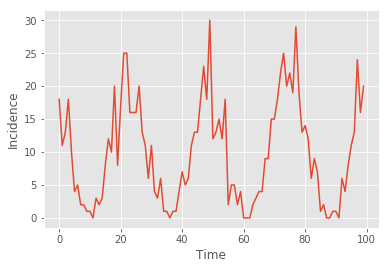

In [3]:
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('ggplot')

# list for holding simulated data, length 260
arr_list = np.zeros(260)
# iterate over season  
for s in range(10):
    #iterate over biweek per season
    for t in range(26):
        season_effect = np.random.choice([10,10,10], p = [0.2, 0.6, 0.2])
        e_y = season_effect*np.cos(10*(t+np.pi)/(13*np.pi)) + season_effect
        arr_list[(s-1)*26+t] = np.random.poisson(e_y) 

# plot simulated data to make sure it looks like ID        
ts = arr_list[:100]
plt.xlabel("Time")
plt.ylabel("Incidence")
plt.plot(ts)
plt.show()

In order to simulate delayed data we first randomly simualte the delay proportions from a dirichlet distribution

In [4]:
## simulated dirichlet proportions for applying delay values
p_vec = np.random.dirichlet(np.ones(10),size=1)[0]

print (p_vec)

p_vec_noise = []

#for i in range(len(ts)):
  #  tmp = 100*p_vec
  #  tmp += np.random.poisson(10,size=len(p_vec))
    
  #  tmp = 
    


[0.001644   0.09085629 0.13721924 0.17221546 0.08371685 0.09116853
 0.00182157 0.10095127 0.05445021 0.26595657]


If the true delay distribution is given by 
$$p_0,...,p_{9} \sim Dirichlet(\alpha_1,...,\alpha_{10})$$

we can interpret $p_i$ as the percentage of cases that were delayed by $i$ days.

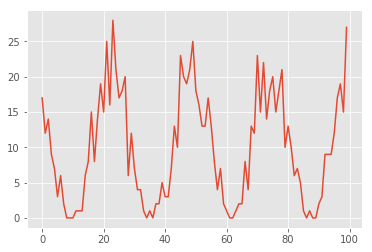

0.09567211115163028


In [129]:
import pymc3 as pm

p_vecs = []
train_n_t_d = []
for t in ts:
    tmp_p_vec = p_vec + np.random.normal(0,10,size=len(p_vec))
    tmp_p_vec = np.exp(tmp_p_vec)/sum(np.exp(tmp_p_vec))
    tmp = np.random.multinomial(t,tmp_p_vec)
    p_vecs.append(tmp_p_vec)
    train_n_t_d.append(tmp)
    
train_n_t_d = np.array(train_n_t_d)
ts = train_n_t_d.sum(axis=1)
plt.plot(ts)
plt.show()

p_vecs = np.array(p_vecs)
print (np.var(p_vecs[:,1]))

In [130]:
k = np.array(train_n_t_d).shape[1 ]

p_vec_noise = np.ones(k)

for i in range(90):
    p_vec_noise += train_n_t_d[i]
            
p_vec_noise = p_vec_noise/np.sum(p_vec_noise)
print (p_vec_noise)

[0.08466819 0.15789474 0.0617849  0.13272311 0.09954233 0.05949657
 0.08237986 0.14302059 0.10640732 0.07208238]


1.0000000000000002
[[ 0  0  0  1  0  1  0  0  0  0]
 [ 0  3  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  9  0  0  0  0]
 [ 0  0  9  0  0  0  0  0  0  0]
 [ 0  0  0  0  7  0  0  0  2  0]
 [ 0  0  0  0  6  0  0  0  1  5]
 [ 0  2  1  0  0  0  0 14  0  0]
 [ 0  0 19  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0 15  0  0  0]
 [ 0  0  0  0  0  0  0  0  0 27]]
[ 2.  3.  9.  9.  7.  6.  3. 19.  0.  0.]


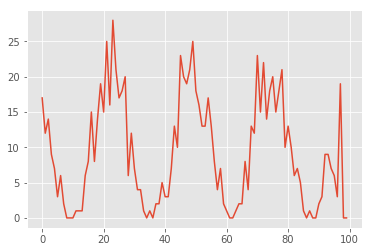

In [131]:


print (sum(p_vec))
# we apply the delay values to the last D=10 elements of the 
# simulated data in order to delay the data 
data_to_be_delayed = train_n_t_d[90:]
count = len(data_to_be_delayed[0])
folded_delayed_data = np.zeros(10)
for i in range(len(data_to_be_delayed)):
    folded_delayed_data[i] = np.sum(data_to_be_delayed[i][:count])
    count -=1

print (data_to_be_delayed)
print (folded_delayed_data)
plt.plot(np.append(ts[:90],folded_delayed_data))
plt.show()

In order to apply the delay we simply take 

$$N_{t,d} = \sum_{i=0}^dp_i*N_{t,\infty}$$

In [132]:
delayed_data = np.append(ts[:90],folded_delayed_data)

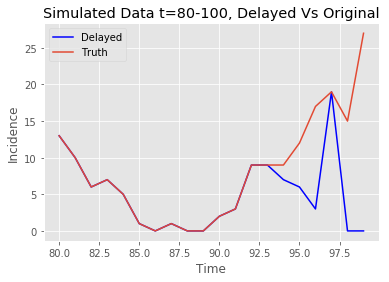

In [133]:
plt.plot(range(80,100),delayed_data[80:],color='b')
plt.plot(range(80,100),train_n_t_d[80:].sum(axis=1))
plt.title("Simulated Data t=80-100, Delayed Vs Original")
plt.legend(("Delayed","Truth"))
plt.ylabel("Incidence")
plt.xlabel("Time")
plt.show()

Now we are ready to try out the model described above toimprove nowcasts. 

$$N_{t,\infty} \sim ProcessModel$$

$$p \sim Dirichlet(p_0,p_1,...,p_9)$$




$$N_{t,\infty} | N_{t,d} \propto N_{t,d} | N_{t,\infty} \cdot N_{t,\infty}$$

In [134]:
n_t_d = data_to_be_delayed



Lets fit an $AR$-state space model of the form 
$$Y_t \sim N(X_t,\sigma_y^2)$$
$$X_t \sim N(\phi_1X_{t-1} + \phi_2X_{t-26},\sigma_x^2)$$

with 26-week seasonality

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.


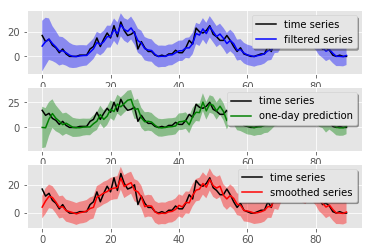

In [135]:
from pydlm import dlm, trend, seasonality, dynamic, autoReg, longSeason
myDLM = dlm(ts[:90])
myDLM = myDLM + seasonality(26, name='26week', w=1.0)

myDLM = myDLM + autoReg(degree=2, data=ts[:90], name='ar2', w=1.0)
myDLM.fit()
br =  myDLM.getMean(filterType='forwardFilter')
(predictMean, predictVar) = myDLM.predictN(N=10, date=myDLM.n-1)
myDLM.plot()

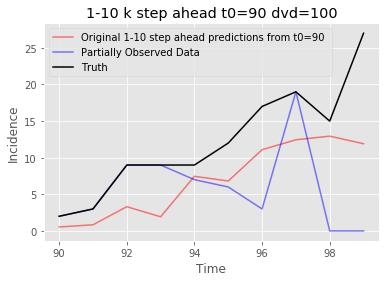

In [136]:
n_t_inf_hat = predictMean
plt.plot(range(90,100),n_t_inf_hat,color='r',alpha=.5)
plt.plot(range(90,100),delayed_data[90:],color='b',alpha=.5)
plt.plot(range(90,100),ts[90:],color='black')
plt.title("1-10 k step ahead t0=90 dvd=100")
plt.legend(("Original 1-10 step ahead predictions from t0=90 ","Partially Observed Data","Truth"))
plt.xlabel("Time")
plt.ylabel("Incidence")
plt.show()

Finally we perform the process model trajectory updating. We do this by first sampling from $N_{t,\infty}$ and accepting a sample if it improves the binomial likelihood


$$N_{t,d} \sim Binomial(N_{t,\infty}, \sum_{i=0}^dp_i)$$

In [143]:
num_mc_samples = 1000
reweighted_trajectory = []
from  scipy.stats import binom
count = 10
for t in range(len(n_t_inf_hat)):
    likelihood_previous = -100000
    likelihood_current = -1000000
    tmp = 0
    for s in range(num_mc_samples):
        fcast = np.random.normal(n_t_inf_hat[t],np.sqrt(predictVar[t])/10)
        likelihood_current = binom.logpmf(folded_delayed_data[t],fcast,sum(p_vec_noise[:count]))
        #print (data_to_be_delayed[t],fcast,sum(p_vec[:count]),likelihood_current)
        if likelihood_current > likelihood_previous:           
            likelihood_previous = likelihood_current
            tmp = fcast
    #print (len(tmp))
    reweighted_trajectory.append(tmp)
    
    count -=1 

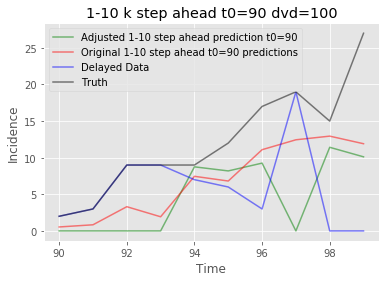

[]

In [144]:
plt.plot(range(90,100),reweighted_trajectory,color='g',alpha=.5)
plt.plot(range(90,100),n_t_inf_hat,color='r',alpha=.5)
plt.plot(range(90,100),folded_delayed_data,color='b',alpha=.5)
plt.title("1-10 k step ahead t0=90 dvd=100")
plt.plot(range(90,100),ts[90:],color='black',alpha=.5)
plt.legend(('Adjusted 1-10 step ahead prediction t0=90','Original 1-10 step ahead t0=90 predictions','Delayed Data','Truth'))
plt.xlabel("Time")
plt.ylabel("Incidence")
plt.show()
plt.plot()

## Naive scale up model 

 We can write the naive scale up model as $$\hat{p} = \frac{N_{t,\infty}}{N_{t,d}}$$


Under the simulated data, we know the proportion of scale up is simply $p_0$

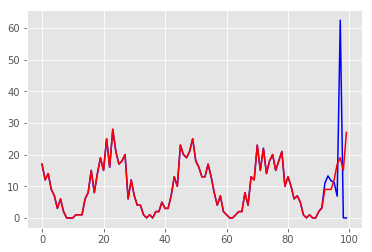

In [145]:
zero_through_90_data = delayed_data[:90]
ninety_through_100_data = delayed_data[90:]
naive_training_data = ninety_through_100_data/np.flip(np.cumsum(p_vec_noise),axis=0)
naive_training_data_final = np.append(zero_through_90_data,naive_training_data)
plt.plot(naive_training_data_final,color="b")
plt.plot(ts,color="r")
plt.show()

So we see that only some of the cases that are observed are reported. The "naive" model is one that simply trains on all data (including under-reported data) and then forecasts by diviing by $p$.


In [8]:
from pydlm import dlm, trend, seasonality, dynamic, autoReg, longSeason
myDLM = dlm(naive_training_data_final)
myDLM = myDLM + seasonality(26, name='26day', w=1.0)

myDLM = myDLM + autoReg(degree=2, data=naive_training_data_final, name='ar2', w=1.0)
myDLM.fit()
br =  myDLM.getMean(filterType='forwardFilter')
(scale_up_predictMean, predictVar) = myDLM.predictN(N=10, date=myDLM.n-1)
#plt.plot(range(100,110),predictMeanRetrain,color='b')
plt.plot(range(100,110),scale_up_predictMean,color='r')
plt.plot(range(100,110),arr_list[100:110],color='y')
plt.title("1-10 k step ahead t0 = 100 dvd=100")
plt.legend(("Naive Scale Up", "Truth"))
plt.xlabel("Time")
plt.ylabel("Incidence")

plt.show()


NameError: name 'naive_training_data_final' is not defined

## Using nowcast to improve forecast




In [147]:

## get predictions for 90-100 from nowcast
new_training_data = np.nan_to_num(np.append(ts[:90],reweighted_trajectory))
myDLM = dlm(new_training_data)
myDLM = myDLM + seasonality(26, name='26day', w=1.0)

myDLM = myDLM + autoReg(degree=2, data=new_training_data, name='ar2', w=1.0)
myDLM.fit()
br =  myDLM.getMean(filterType='forwardFilter')
(predictMeanRetrain, predictVar) = myDLM.predictN(N=10, date=myDLM.n-1)



Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.


In [15]:
truth = arr_list[100:110]

from pydlm import dlm, trend, seasonality, dynamic, autoReg, longSeason
myDLM = dlm(delayed_data)

myDLM = myDLM + autoReg(degree=2, data=delayed_data, name='ar2', w=1.0)
myDLM.fit()
br =  myDLM.getMean(filterType='forwardFilter')
(predictMean, predictVar) = myDLM.predictN(N=10, date=myDLM.n-1)

from sklearn.metrics import mean_squared_error
plt.plot(range(100,110),predictMeanRetrain,color='b')
plt.plot(range(100,110),scale_up_predictMean,color='r')
plt.plot(range(100,110),arr_list[100:110],color='y')
plt.title("1-10 k step ahead t0 = 100 dvd=100")
plt.legend(("Delay Adjusted t0=100, 1-10 step ahead ","Naive Scaleup, t0=100, 1-10 step ahead ","Truth"))
plt.xlabel("Time")
plt.ylabel("Incidence")

plt.show()


print ("RMSE",mean_squared_error(predictMeanRetrain,truth)/mean_squared_error(scale_up_predictMean,truth))

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.


NameError: name 'predictMeanRetrain' is not defined

In [60]:
from scipy.special import expit
variance_level_results = []
arr_list = np.zeros(260)
        # iterate over season  
for s in range(10):
        #iterate over biweek per season
        for t in range(26):
            season_effect = np.random.choice([10,10,10], p = [0.2, 0.6, 0.2])
            e_y = season_effect*np.cos(10*(t+np.pi)/(13*np.pi)) + season_effect
            arr_list[(s-1)*26+t] = np.random.poisson(e_y) 
ts = arr_list[:100]
for var in np.arange(0,10,.5):
    rmse_vec = []
    

    for sim in range(100):
        
        # plot simulated data to make sure it looks like ID        

        p_vec = np.random.dirichlet(np.ones(10),size=1)[0]


        p_vec_noise = []

        train_n_t_d = []
        for t in ts:
            tmp_p_vec = scipy.special.expit(p_vec) + np.random.normal(0,var,size=len(p_vec))
            tmp_p_vec = np.exp(tmp_p_vec)/sum(np.exp(tmp_p_vec))
            tmp = np.random.multinomial(t,tmp_p_vec)

            train_n_t_d.append(tmp)


        print (tmp_p_vec)    
        train_n_t_d = np.array(train_n_t_d)
        ts = train_n_t_d.sum(axis=1)


        k = np.array(train_n_t_d).shape[1 ]

        p_vec_noise = np.ones(k)

        for i in range(90):
            p_vec_noise += train_n_t_d[i]

        p_vec_noise = p_vec_noise/np.sum(p_vec_noise)


        data_to_be_delayed = train_n_t_d[90:]
        count = len(data_to_be_delayed[0])
        folded_delayed_data = np.zeros(10)
        for i in range(len(data_to_be_delayed)):
            folded_delayed_data[i] = np.sum(data_to_be_delayed[i][:count])
            count -=1

        delayed_data = np.append(ts[:90],folded_delayed_data)
        n_t_d = data_to_be_delayed

        myDLM = dlm(ts[:90])
        myDLM = myDLM + seasonality(26, name='26week', w=1.0)

        myDLM = myDLM + autoReg(degree=2, data=ts[:90], name='ar2', w=1.0)
        myDLM.fit()
        br =  myDLM.getMean(filterType='forwardFilter')
        (predictMean, predictVar) = myDLM.predictN(N=10, date=myDLM.n-1)


        n_t_inf_hat = predictMean
        num_mc_samples = 1000
reweighted_trajectory = []
from  scipy.stats import binom
from  scipy.stats import norm
count = 10

for t in range(len(n_t_inf_hat)):
        likelihood_previous = 1e-50
        likelihood_current = 1e-50
        prior_previous = 1e-50
        prior_current = 1e-50
        chain = []
        proposal_mean = 50
        ar = 0
        for s in range(num_mc_samples):

            proposal = np.random.normal(proposal_mean,10)

            prior_current = norm(n_t_inf_hat[t],np.sqrt(predictVar[t])/scale_factor).pdf(proposal)

            likelihood_current = binom.pmf(np.sum(mid_n_t_d_masked,axis=1)[t],proposal,sum(p_vec_noise[:count]))
            alpha = likelihood_current*prior_current /(likelihood_previous*prior_previous)
            #print (alpha,likelihood_current*prior_current,likelihood_previous*prior_previous)

            if alpha >1 :           
                likelihood_previous = likelihood_current
                prior_previous = prior_current
                proposal_mean = proposal
                chain.append(proposal_mean)
                ar += 1
            elif np.random.uniform(0,1) < alpha:
                #print ("hello")
                likelihood_previous = likelihood_current
                prior_previous = prior_current
                proposal_mean = proposal
                chain.append(proposal_mean)
                ar += 1
        if ar/(1.0*num_mc_samples) == 0.0:
            ret = 0
        elif np.isnan(np.mean(chain[200:])):
            ret = 0
        else:
            ret = np.mean(chain[200:])
        reweighted_trajectory.append(ret)


        count -=1 
    


        zero_through_90_data = delayed_data[:90]
        ninety_through_100_data = delayed_data[90:]
        naive_training_data = ninety_through_100_data/np.flip(np.cumsum(p_vec_noise),axis=0)
        naive_training_data_final = np.append(zero_through_90_data,naive_training_data)

        myDLM = dlm(naive_training_data_final)
        myDLM = myDLM + seasonality(26, name='26day', w=1.0)

        myDLM = myDLM + autoReg(degree=2, data=naive_training_data_final, name='ar2', w=1.0)
        myDLM.fit()
        br =  myDLM.getMean(filterType='forwardFilter')
        (scale_up_predictMean, predictVar) = myDLM.predictN(N=10, date=myDLM.n-1)


        new_training_data = np.nan_to_num(np.append(ts[:90],reweighted_trajectory))
        myDLM = dlm(new_training_data)
        myDLM = myDLM + seasonality(26, name='26day', w=1.0)

        myDLM = myDLM + autoReg(degree=2, data=new_training_data, name='ar2', w=1.0)
        myDLM.fit()
        br =  myDLM.getMean(filterType='forwardFilter')
        (predictMeanRetrain, predictVar) = myDLM.predictN(N=10, date=myDLM.n-1)

        truth = arr_list[100:110]

        from pydlm import dlm, trend, seasonality, dynamic, autoReg, longSeason
        myDLM = dlm(delayed_data)

        myDLM = myDLM + autoReg(degree=2, data=delayed_data, name='ar2', w=1.0)
        myDLM.fit()
        br =  myDLM.getMean(filterType='forwardFilter')
        (predictMean, predictVar) = myDLM.predictN(N=10, date=myDLM.n-1)
        #plt.plot(range(100,110),predictMeanRetrain,color='b')
        #plt.plot(range(100,110),scale_up_predictMean,color='r')
        #plt.plot(range(100,110),arr_list[100:110],color='y')
        #plt.title("1-10 k step ahead t0 = 100 dvd=100")
        #plt.legend(("Delay Adjusted t0=100, 1-10 step ahead ","Naive Scaleup, t0=100, 1-10 step ahead ","Truth"))
        #plt.xlabel("Time")
        #plt.ylabel("Incidence")

        #plt.show()
        rmse_vec.append(mean_squared_error(predictMeanRetrain,truth)/mean_squared_error(scale_up_predictMean,truth))
        
        
    variance_level_results.append([rmse_vec])
        
        
        

[0.10233855 0.10849206 0.09768018 0.10060769 0.09885449 0.09759009
 0.09946584 0.0991053  0.09774023 0.09812556]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09848553 0.10066759 0.10282114 0.09996721 0.099259   0.0982542
 0.10244538 0.101081   0.09771065 0.09930831]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Sta

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09883551 0.09933974 0.09916755 0.10195152 0.0989361  0.10120702
 0.09985656 0.09799874 0.10469711 0.09801016]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09993945 0.09899019 0.09952121 0.10741783 0.0988705

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09776747 0.09862009 0.10918839 0.09799657 0.09771856 0.10260355
 0.09812718 0.10141448 0.09829632 0.09826738]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09926519 0.09944044 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09818223 0.10503337 0.09812507 0.09870022 0.09777071 0.09898443
 0.10222481 0.09861268 0.10001161 0.10235487]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10362604 0.09989846 0.0976172  0.09773564 0.1000876

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0975246  0.09873525 0.1000996  0.10909538 0.09836058 0.09754065
 0.099705   0.0992034  0.10100777 0.09872777]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09756942 0.10035696 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10667137 0.09754112 0.09987171 0.09806828 0.09965167 0.09899316
 0.10237271 0.09859881 0.09863591 0.09959527]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10073841 0.10322696 0.10145191 0.10109725 0.0978676

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09985193 0.09773728 0.09825877 0.1016495  0.09896678 0.09957102
 0.09982029 0.10123008 0.10187804 0.10103631]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10059614 0.09760954 0.09769321 0.09756129 0.1087629

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10041375 0.09986517 0.10355405 0.09892414 0.09768645 0.10202522
 0.09875725 0.09809253 0.10192976 0.09875166]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10405913 0.09971824 0.09897388 0.09940883 0.1014000

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09889172 0.09911126 0.10346467 0.09969518 0.09869782 0.09820873
 0.10150976 0.10002137 0.10195971 0.09843978]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09753397 0.09794275 0.09923306 0.09752229 0.1058426

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09863899 0.09994348 0.09830261 0.09914093 0.09864702 0.10561739
 0.09860165 0.09919617 0.10247658 0.09943517]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10345921 0.09937723 0.09850307 0.10273129 0.0984745

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09765464 0.10093601 0.10434841 0.09821458 0.10018745 0.09913508
 0.09888457 0.09821228 0.10048477 0.10194221]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09942149 0.09799298 0.0978508  0.10061544 0.0977386

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10162997 0.09794877 0.09937239 0.09777633 0.10356487 0.09817321
 0.10062307 0.09882684 0.10431877 0.09776578]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09879188 0.09873527 0.09906671 0.10338689 0.1031023

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10134097 0.10053563 0.09762398 0.10058993 0.09966701 0.09845356
 0.09823289 0.0977101  0.10674423 0.09910171]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0984015  0.09901774 0.0978394  0.10414728 0.0984877

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10041545 0.09755854 0.09901847 0.10147224 0.10041363 0.09991402
 0.10238597 0.09861895 0.09928172 0.100921  ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09907662 0.10077222 0.10079015 0.10248221 0.0985346

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09926502 0.09817761 0.09882706 0.09871478 0.09925142 0.09820337
 0.09988489 0.09883502 0.10224118 0.10659967]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09887513 0.10369176 0.09779743 0.10187225 0.0979418

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09996934 0.10040246 0.09937071 0.09776303 0.10014522 0.10028825
 0.09794658 0.10605715 0.09807486 0.09998241]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10031171 0.09870323 0.10009655 0.09846677 0.1031922

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09781872 0.09780943 0.10143832 0.09910609 0.09798121 0.09768411
 0.11218308 0.09956343 0.09890041 0.0975152 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10282906 0.09914167 0.09810296 0.10196904 0.0975801

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09961279 0.09985618 0.09751803 0.0981999  0.0981506  0.09837448
 0.1065595  0.1005901  0.10357514 0.09756328]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0991463  0.09836864 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09766007 0.10045485 0.09808585 0.09853774 0.1030536  0.09970532
 0.09766846 0.097794   0.10946866 0.09757145]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.1054691  0.09804626 0.10871362 0.09934148 0.0983370

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09955297 0.0984214  0.10470685 0.10202903 0.09938228 0.09840865
 0.09992318 0.10105461 0.09815894 0.09836209]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0978917  0.09780447 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10086991 0.09878412 0.09973655 0.10504442 0.0975618  0.10086525
 0.09832813 0.1012484  0.09837286 0.09918855]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10584649 0.09754028 0.09921753 0.10224677 0.0980380

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10280132 0.09894921 0.09985219 0.10311036 0.09950283 0.1006606
 0.09770618 0.09850557 0.10044961 0.09846212]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10218163 0.10319784 0.0983169  0.09846286 0.10020358

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09912035 0.09955538 0.10030599 0.10042678 0.09858228 0.10227315
 0.09832912 0.09877072 0.09945902 0.10317719]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09884549 0.09794697 0.09875009 0.10237885 0.1017370

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09882527 0.10562378 0.09836478 0.09968748 0.1010481  0.0977163
 0.09918463 0.10111476 0.10012677 0.09830814]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09853588 0.10093375 0.09792461 0.10086952 0.10284429

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09809547 0.10398946 0.09895895 0.09939945 0.0991123  0.10546983
 0.09802732 0.10039481 0.09832548 0.09822692]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09976244 0.10494393 0.09764041 0.09835204 0.0978399

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09775149 0.09808699 0.09946678 0.09912095 0.10761672 0.10106452
 0.10290846 0.09853493 0.09783198 0.09761719]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09795941 0.10053351 0.10290812 0.09883747 0.0984510

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0977825  0.104032   0.09863099 0.09974098 0.10034572 0.10439103
 0.09904828 0.09887766 0.09911359 0.09803725]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10325622 0.10057585 0.09878314 0.09772021 0.0996996

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09887557 0.09984268 0.09969487 0.09959382 0.10228516 0.09991611
 0.10031046 0.10065425 0.09869932 0.10012776]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10149247 0.10019236 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09813726 0.09883272 0.0988028  0.10251594 0.09952885 0.10366153
 0.09820844 0.09800639 0.10152414 0.10078193]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09898521 0.101551   0.10014466 0.09870227 0.1002523

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10243675 0.09847502 0.10159243 0.0993288  0.09872946 0.09815006
 0.10033711 0.10086238 0.09792242 0.10216557]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09890563 0.10616623 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10319032 0.09759033 0.10224114 0.09849785 0.09843268 0.10096179
 0.09958278 0.09996355 0.10018756 0.09935199]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10109783 0.10070024 0.1113466  0.09801325 0.099403 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10078693 0.09825174 0.09902305 0.10015737 0.0978567  0.09848718
 0.09910363 0.10735331 0.09790799 0.1010721 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10044556 0.10263166 0.10011354 0.09865241 0.0992408

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10213832 0.10048599 0.09799042 0.09823744 0.09783058 0.10352722
 0.09991534 0.10054595 0.10023764 0.09909111]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.1004549  0.09761964 0.10143715 0.09834784 0.0979078

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09760066 0.09997048 0.10510987 0.1011215  0.09781587 0.09768936
 0.09806491 0.1033956  0.10082447 0.09840727]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09843958 0.09795824 0.10319802 0.09768049 0.1004813

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10009282 0.10266488 0.09794645 0.09888332 0.09987307 0.10242504
 0.09769365 0.09754135 0.10079988 0.10207954]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10446332 0.10132022 0.100399   0.1021072  0.0993249

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09988477 0.10071334 0.09925917 0.09848838 0.09918197 0.10396513
 0.09946978 0.10075738 0.09834791 0.09993217]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09789599 0.10310282 0.10130115 0.10114503 0.1006532

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09782641 0.098638   0.10261191 0.0989075  0.09819723 0.102184
 0.09885557 0.1020421  0.10276153 0.09797574]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09931558 0.1049945  0.10139041 0.10058107 0.09885448 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10079295 0.10330243 0.09992834 0.09950922 0.098391   0.10092277
 0.09845337 0.0989425  0.09850645 0.10125096]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09765266 0.10062596 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10142513 0.09882459 0.09928271 0.09784316 0.10350661 0.09787167
 0.10237361 0.10138929 0.09995537 0.09752786]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09850507 0.1020874  0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09923195 0.09998561 0.09851001 0.10039228 0.09837031 0.09850399
 0.10748774 0.09766828 0.10018774 0.09966209]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09820768 0.0994548  0.09909398 0.09854967 0.1063360

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09754974 0.10129503 0.09901797 0.10239693 0.10219423 0.09840919
 0.0977743  0.10351482 0.09814684 0.09970097]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10061434 0.09980591 0.09825417 0.09903908 0.0982551

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10212009 0.102905   0.10078297 0.1000722  0.09919114 0.10163827
 0.09829459 0.09808959 0.0985717  0.09833446]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09837529 0.09803706 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09801185 0.10605031 0.1012168  0.0991158  0.09840181 0.09866675
 0.10123147 0.09905527 0.09854851 0.09970142]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09960724 0.09785514 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10157811 0.10079109 0.09932119 0.10214706 0.10099839 0.0980392
 0.09813711 0.10165485 0.09813355 0.09919945]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09834598 0.1000881  0.10178564 0.09915168 0.09932715

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0990738  0.10075386 0.09941299 0.0990625  0.10053652 0.10142778
 0.09934509 0.1016328  0.09937083 0.09938382]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09775284 0.0980054  0.10105522 0.09881349 0.0982263

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10583465 0.10033794 0.10091582 0.09912376 0.09761156 0.09943097
 0.09807344 0.09835324 0.0995756  0.10074303]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10287087 0.10028479 0.09795314 0.0975294  0.0985448

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0992632  0.10426659 0.09988911 0.09779223 0.09777141 0.10118235
 0.09771914 0.09818338 0.09806104 0.10587155]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10119542 0.09818111 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0979552  0.09943803 0.10319135 0.09835156 0.09884664 0.10138018
 0.10047528 0.09834797 0.09882563 0.10318816]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10326111 0.09793108 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09808098 0.09928884 0.10480318 0.09788431 0.10497199 0.09810533
 0.0975279  0.09901405 0.10119488 0.09912854]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09988116 0.10236054 0.10261458 0.09829356 0.0975982

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09912217 0.09916654 0.09835506 0.09845785 0.10011438 0.09944748
 0.09781963 0.1021978  0.10225725 0.10306184]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10504721 0.09953139 0.09844231 0.0991026  0.0981981

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10336744 0.10039449 0.1046313  0.09782048 0.09884072 0.09785767
 0.10024323 0.09902145 0.09994997 0.09787324]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10381965 0.09985996 0.09897903 0.10236763 0.1000519

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10183939 0.10222884 0.09947608 0.09754243 0.0981801  0.09815591
 0.09808323 0.09936948 0.10052165 0.10460288]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09777956 0.09893186 0.10589934 0.09756497 0.0995297

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09993298 0.09912989 0.09964324 0.10266119 0.0982316  0.0982163
 0.10639259 0.09943824 0.09819382 0.09816016]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09755865 0.1051103  0.

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09817865 0.09815465 0.10032336 0.09949196 0.10932701 0.09772
 0.10072203 0.10004838 0.09786757 0.09816639]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10350546 0.09848732 0.0992687  0.0988275  0.09942914 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09910858 0.09793913 0.10200208 0.10338467 0.10594752 0.09969452
 0.09805946 0.09832352 0.09800604 0.09753448]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09825704 0.09824494 0.09761863 0.10704257 0.0982015

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09765972 0.09755696 0.09945326 0.09878649 0.09985769 0.09776435
 0.10125581 0.10397988 0.10319955 0.10048631]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09911008 0.10229625 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09944104 0.09877793 0.10144609 0.09862892 0.09970832 0.09807915
 0.10318977 0.1035109  0.09756004 0.09965783]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09968126 0.09933218 0.09766107 0.10183684 0.0989145

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10061262 0.10217377 0.09829032 0.10059508 0.0985584  0.10122882
 0.09818314 0.0993964  0.0982242  0.10273723]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09876982 0.09987468 0.0994253  0.10166217 0.0980971

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.1013049  0.09785387 0.09773721 0.09945497 0.09786951 0.09980356
 0.09829304 0.10104302 0.10660453 0.1000354 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09910822 0.10008223 0.10393992 0.09781836 0.0979573

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10301548 0.09785933 0.09875325 0.10592049 0.09860031 0.09829211
 0.09818997 0.10069399 0.10052596 0.09814912]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09992535 0.10120495 0.09876072 0.09941111 0.099258 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09911653 0.09753252 0.09768994 0.09852095 0.10111288 0.10283678
 0.09764849 0.09990257 0.10742326 0.09821608]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09823006 0.10561527 0.09982999 0.10237809 0.1017478

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10422609 0.09775363 0.10165489 0.09780401 0.10099271 0.09752514
 0.09868803 0.10417734 0.0984297  0.09874847]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0993682  0.10134202 0.09832766 0.09760235 0.1024217

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09800377 0.10074318 0.09917979 0.10250073 0.10621952 0.09760516
 0.10179217 0.098409   0.09783119 0.0977155 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0981985  0.10122873 0.09773963 0.10087695 0.0976068

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.1003343  0.10046983 0.09915167 0.10288154 0.09805043 0.10023571
 0.10209913 0.09886939 0.09922614 0.09868186]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0978176  0.10399593 0.09984119 0.10119083 0.0977632

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09839827 0.09936904 0.10083844 0.09934447 0.10252415 0.09844356
 0.0988807  0.0986907  0.09963547 0.10387519]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10182812 0.09768261 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.1030708  0.10069593 0.09888873 0.10004154 0.09879227 0.10075665
 0.09787939 0.097667   0.10277654 0.09943114]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09927763 0.09996319 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09842738 0.09922886 0.10046975 0.10443968 0.09925894 0.09836837
 0.09785848 0.09819993 0.1027105  0.10103812]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10145187 0.10224896 0.09858095 0.10375363 0.0977236

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.100197   0.09890093 0.09846356 0.10228059 0.09900445 0.10438305
 0.09834516 0.09884129 0.0988301  0.10075387]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09768072 0.10928304 0.09834628 0.09955299 0.0994869

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10666754 0.09818562 0.09867295 0.1036512  0.09775253 0.09955238
 0.09943823 0.09764964 0.09978406 0.09864584]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09884273 0.09763665 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10271863 0.09884402 0.09829055 0.09893558 0.09864484 0.09948463
 0.1035785  0.0983167  0.10187016 0.09931639]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09814512 0.10376695 0.10656417 0.09798658 0.0990215

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09896898 0.09765069 0.097921   0.1026407  0.09948445 0.10412372
 0.10359632 0.09830517 0.09776809 0.09954087]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.098142   0.09766203 0.10255215 0.09865771 0.0977051

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09977784 0.0994504  0.09958063 0.09793833 0.09877907 0.10144127
 0.09817168 0.0994242  0.10570141 0.09973517]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09781429 0.09901192 0.0989836  0.10346924 0.0976752

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.17323845 0.09755125 0.05180465 0.08781557 0.16724025 0.04194698
 0.07856469 0.18804694 0.04805075 0.06574046]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06265769 0.0596022  0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.13063102 0.11457493 0.13487225 0.11213208 0.07530981 0.11480831
 0.03378722 0.03795373 0.09602611 0.14990456]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05437012 0.14374921 0.05844591 0.07364237 0.0976486

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04430891 0.07068964 0.08207826 0.07394691 0.05405235 0.10619097
 0.02042303 0.24408487 0.2028982  0.10132686]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.14170176 0.08928669 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05847048 0.11172509 0.1583809  0.0820863  0.06992681 0.13100368
 0.07466235 0.0381261  0.18638047 0.08923782]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08499427 0.10412771 0.07224198 0.14517779 0.0517551

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02902381 0.09043127 0.11270544 0.1073755  0.03963365 0.17722943
 0.04426121 0.31439168 0.0517216  0.0332264 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.21073134 0.08923152 0.03700603 0.05226096 0.1128502

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09523139 0.1060653  0.08659611 0.04724783 0.09920983 0.13541411
 0.11140563 0.14732449 0.11576648 0.05573882]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0785476  0.0906873  0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03831557 0.08507064 0.09140101 0.09118068 0.06401363 0.15456659
 0.06663835 0.05134064 0.24849789 0.108975  ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10021211 0.106995   0.05676584 0.11034557 0.1241342

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.15463372 0.04194927 0.10057069 0.0586332  0.15386813 0.08315423
 0.15617569 0.07410598 0.09677039 0.0801387 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.11182868 0.05044526 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03362787 0.06632386 0.18745719 0.08839448 0.22495912 0.08737264
 0.08298213 0.09376791 0.09512469 0.03999013]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04105467 0.10664269 0.18238045 0.07584537 0.0265196

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08265189 0.25119563 0.05422468 0.04027499 0.03601787 0.14269527
 0.08966778 0.15082284 0.08665202 0.06579702]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03145708 0.13469724 0.08617211 0.09226991 0.1539193

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09788459 0.07673711 0.07498347 0.30701014 0.06119162 0.09004212
 0.03203165 0.10557426 0.075254   0.07929104]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03806947 0.14455356 0.06508638 0.11275797 0.0796498

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12271831 0.0881095  0.1106162  0.03490039 0.05746294 0.06655143
 0.11630141 0.17286878 0.14619016 0.08428086]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07178936 0.21210859 0.02736488 0.02647152 0.1181475

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07438023 0.12979125 0.0424871  0.12139864 0.11992778 0.14967172
 0.03748336 0.110795   0.06092026 0.15314466]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05713383 0.10935089 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10984362 0.04974194 0.05231905 0.06073554 0.12250547 0.06062352
 0.2004533  0.15271614 0.10101161 0.09004982]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04026572 0.21808967 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06255634 0.10452748 0.23662823 0.1326925  0.03016655 0.04985263
 0.08683975 0.0904544  0.13348379 0.07279833]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12526341 0.10848946 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06108174 0.05913428 0.10694878 0.05888563 0.14659869 0.13230405
 0.27131904 0.02961468 0.0539333  0.08017983]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10140063 0.13368459 0.09449714 0.10975244 0.0866433

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06643028 0.09545888 0.08786571 0.11196111 0.16030415 0.10507734
 0.13747084 0.11972906 0.04187037 0.07383226]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10518116 0.08660266 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10897946 0.07185508 0.1344767  0.0321888  0.06492254 0.14175035
 0.09646555 0.09109628 0.01666369 0.24160155]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12246266 0.12629513 0.14399617 0.12085057 0.0145553

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07351572 0.09123068 0.16731843 0.18017965 0.04426027 0.074389
 0.0786099  0.04589069 0.07688946 0.1677162 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09588321 0.11469621 0.1

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0939148  0.18341508 0.10933544 0.10258734 0.10743788 0.05820537
 0.08889476 0.13818766 0.05092796 0.0670937 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04943521 0.12261819 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09660708 0.14395222 0.06755971 0.03895897 0.04802979 0.06581642
 0.10919911 0.20903228 0.16529342 0.05555099]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09950309 0.11480612 0.03640008 0.05726254 0.1299335

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.17772508 0.041158   0.08230376 0.20989924 0.06130592 0.07444588
 0.13153521 0.11971784 0.07948197 0.0224271 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04957972 0.14626238 0.07947174 0.06821554 0.0702437

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05882853 0.07494025 0.07694344 0.17921833 0.0752293  0.1421042
 0.15945056 0.06767799 0.12962229 0.03598511]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.14644149 0.03181792 0.09351733 0.02637508 0.09565869

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12668687 0.06098927 0.06841462 0.05884754 0.04585308 0.06456807
 0.15812888 0.03843206 0.06317493 0.31490468]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07333649 0.13024124 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10297341 0.04894299 0.04400458 0.11767134 0.05862835 0.20666293
 0.06296246 0.17926837 0.08402807 0.0948575 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08572463 0.07539761 0.08958878 0.07530383 0.1027259

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.25135643 0.08287994 0.10449004 0.03685369 0.14405031 0.0593557
 0.06725075 0.10096723 0.08684278 0.06595314]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09076508 0.06105506 0.14102743 0.0878946  0.11925189

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06311371 0.08622627 0.17290459 0.07529273 0.03679851 0.07851528
 0.10294748 0.17707662 0.07300352 0.13412129]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08679738 0.1037429  0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06454827 0.08801301 0.08974762 0.05906221 0.09056999 0.09550117
 0.08063329 0.0965158  0.06956519 0.26584345]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07155261 0.14985405 0.16135833 0.06091456 0.0940861

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08842393 0.03148445 0.14718508 0.23396548 0.155957   0.03749863
 0.09013886 0.05171994 0.08544507 0.07818156]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04439677 0.19839235 0.08356638 0.09504745 0.0657178

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.21526606 0.11827011 0.05732896 0.0298001  0.06945277 0.0843688
 0.09913197 0.08426226 0.10368759 0.13843139]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.15432154 0.07507195 0.

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10691723 0.16342252 0.10917237 0.13430369 0.11249864 0.06344963
 0.07403994 0.03542959 0.14472965 0.05603674]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06728517 0.03701317 0.12165607 0.0731918  0.1917607

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.17252745 0.06971506 0.09856689 0.09768468 0.14161679 0.07891212
 0.04221598 0.09924563 0.13227152 0.06724389]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05120984 0.06733444 0.07202166 0.1382284  0.1537564

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.11480531 0.07886223 0.06162605 0.10625342 0.14907759 0.14835345
 0.05155403 0.06302462 0.10078164 0.12566166]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06019125 0.08600871 0.16473362 0.03400842 0.1748845

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.11835344 0.06388233 0.19121431 0.28505951 0.04616141 0.06897889
 0.05600209 0.08650857 0.04585878 0.03798067]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03629007 0.06313778 0.10557336 0.09868739 0.1939204

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.13384362 0.08952829 0.13500426 0.11653783 0.16896969 0.09166856
 0.08845088 0.06336861 0.06675975 0.04586852]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04219327 0.13041163 0.15136426 0.14913527 0.2053826

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.21309108 0.1245845  0.11348449 0.1128515  0.07586206 0.07605271
 0.08425016 0.05053331 0.06113675 0.08815346]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08634178 0.0912206  0.06902698 0.02932623 0.1259470

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.21551939 0.05998688 0.13250121 0.07254209 0.11437071 0.06484673
 0.09356854 0.06672263 0.11331131 0.06663053]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05092157 0.04398447 0.07206963 0.10884201 0.0659127

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08620021 0.02475027 0.18632095 0.09304937 0.0638531  0.14360792
 0.12144572 0.06493158 0.07942735 0.13641352]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10679257 0.046021   0.12228626 0.1468133  0.0288974

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09343122 0.06581654 0.13986994 0.06834728 0.11273325 0.08655722
 0.12486805 0.15094998 0.05913628 0.09829024]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04170566 0.09276598 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.17871393 0.13971417 0.04861374 0.05482337 0.08401612 0.05066209
 0.16408917 0.07970495 0.15205058 0.04761188]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07141951 0.09612849 0.15397837 0.0591821  0.1094949

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0508723  0.09261574 0.15486592 0.07069973 0.07030917 0.0936584
 0.24447126 0.07996002 0.0877408  0.05480666]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.13066887 0.06451975 0.

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.11670953 0.06670934 0.06950659 0.13732747 0.12953648 0.08508332
 0.07804079 0.086711   0.14449737 0.08587811]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.11388703 0.03433814 0.0555555  0.14620242 0.0550413

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05889588 0.06714834 0.06851203 0.11200513 0.15123117 0.10121577
 0.10134542 0.13111484 0.14551629 0.06301513]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03814582 0.07066576 0.06458173 0.17637788 0.0419183

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12166062 0.09419906 0.11041697 0.08604845 0.05604944 0.05637216
 0.18221587 0.06546943 0.14194119 0.0856268 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06416146 0.14642563 0.07449025 0.08204454 0.2521636

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03645623 0.13378664 0.06583908 0.0747775  0.09541037 0.11575456
 0.06817097 0.07177763 0.20998378 0.12804324]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09391802 0.08627495 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07059947 0.07768956 0.10501425 0.09041788 0.07338092 0.08825669
 0.10653965 0.2244644  0.06820685 0.09543032]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06352466 0.13568964 0.09488279 0.10465115 0.0694614

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02694391 0.10406289 0.11687585 0.08195667 0.1228304  0.14035539
 0.07055804 0.16469707 0.11016415 0.06155561]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10047016 0.13617908 0.11041813 0.10263676 0.1389045

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12975118 0.08101443 0.17086032 0.1519072  0.05777189 0.09119342
 0.07943154 0.14159428 0.04038749 0.05608824]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03953294 0.06658246 0.21812676 0.06904298 0.0732044

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.13635554 0.14827733 0.08317038 0.14458959 0.09000157 0.11397257
 0.13526724 0.03512772 0.03837761 0.07486045]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12450757 0.15869356 0.14215734 0.04191797 0.0534150

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05533745 0.11498353 0.02216297 0.16720574 0.05752059 0.18054697
 0.12291149 0.10171535 0.12219181 0.0554241 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09242483 0.12042384 0.09371568 0.06106587 0.1422854

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.11646062 0.08913965 0.06804519 0.10787994 0.17387744 0.15513938
 0.05397286 0.09367471 0.0570953  0.0847149 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.16602992 0.06460708 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07121118 0.11033248 0.0564518  0.05509265 0.07444639 0.05851126
 0.08253529 0.23741426 0.06308967 0.19091502]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.15064649 0.0935665  0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.16348448 0.09882221 0.19131368 0.08610541 0.04941581 0.06641969
 0.05365127 0.12063841 0.09684033 0.07330872]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.20713917 0.03552518 0.08554111 0.13427293 0.0789398

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09385412 0.12100769 0.06218693 0.04218618 0.07270855 0.0891344
 0.0815532  0.10268832 0.06139974 0.27328088]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03598936 0.14597184 0.19260882 0.129294   0.14510755

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.16849146 0.08087586 0.07594047 0.10828586 0.13550956 0.09319936
 0.02736899 0.14745147 0.06766784 0.09520913]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06642517 0.05525395 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04845059 0.13826641 0.06551197 0.06947405 0.05624936 0.17712213
 0.05014627 0.07174297 0.07464818 0.24838807]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08508983 0.10118025 0.0821134  0.12784462 0.0392129

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06092816 0.07126012 0.04129636 0.08053437 0.0863317  0.09369189
 0.10649702 0.17527849 0.19639011 0.08779178]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09398921 0.06548507 0.0976853  0.12926305 0.0908792

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.19646745 0.14423075 0.14749788 0.05884575 0.06055698 0.11618429
 0.08505408 0.08527767 0.05092589 0.05495925]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07963473 0.1190285  0.08951245 0.06468957 0.0341984

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.11753067 0.05278492 0.06671116 0.12490529 0.08182376 0.17460158
 0.05260337 0.19908165 0.09498182 0.03497579]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.13306672 0.09305241 0.09384689 0.09165281 0.0879462

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10944476 0.10045847 0.08964134 0.06383007 0.24186548 0.03516203
 0.08375115 0.12022896 0.0645122  0.09110553]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.19592568 0.1622447  0.05863418 0.03748296 0.0661185

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.21928115 0.17681715 0.06356881 0.10914447 0.0714696  0.05661774
 0.05338995 0.08858418 0.07091532 0.09021163]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05209445 0.06242123 0.07082013 0.0646867  0.0738072

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06684527 0.21358502 0.09713462 0.07235091 0.06394264 0.17439617
 0.06114016 0.09339703 0.08775654 0.06945164]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09212088 0.10994522 0.07103667 0.11049135 0.1347027

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04017897 0.10263427 0.06786955 0.0745581  0.05203786 0.03170693
 0.0722916  0.23307708 0.25040587 0.07523977]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.18148232 0.09516796 0.09404443 0.13479995 0.0712773

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12826115 0.10532314 0.13011506 0.07511692 0.02757944 0.11449592
 0.15604752 0.07522379 0.08932591 0.09851114]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07621647 0.03082525 0.05329263 0.03208424 0.1075267

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09742448 0.079077   0.15883833 0.10993576 0.16875944 0.05826686
 0.09265155 0.07033442 0.10947708 0.05523506]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.1660098  0.12101636 0.33558666 0.04064235 0.0549468

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04866643 0.07690888 0.1027934  0.12740546 0.09943796 0.13293856
 0.04241989 0.07115551 0.24490775 0.05336616]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0413147  0.05822641 0.057281   0.21702862 0.0917243

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04493565 0.14408248 0.06755352 0.06713424 0.1123305  0.17714299
 0.0925594  0.10292058 0.08888054 0.1024601 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06342862 0.09302132 0.04383574 0.08430797 0.1182764

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0584983  0.10038872 0.15616384 0.07819676 0.24196201 0.04859404
 0.03817418 0.10337977 0.06872031 0.10592204]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.14115654 0.14565856 0.07426347 0.12505882 0.1115181

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10796542 0.09227029 0.09191538 0.16000221 0.06369159 0.15463102
 0.0581561  0.0838457  0.0670986  0.1204237 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.1027256  0.07932403 0.119434   0.06540939 0.1130324

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05512704 0.25963519 0.04711046 0.08627879 0.05235075 0.05934426
 0.04519628 0.20547953 0.14456408 0.04491363]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10620625 0.19036965 0.12502005 0.04608689 0.0645085

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10857258 0.06658332 0.05905355 0.0686786  0.08037193 0.11125603
 0.05262307 0.25211213 0.05990948 0.14083931]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05781395 0.20429837 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08993049 0.26932252 0.0104837  0.06207173 0.04919917 0.03241848
 0.01563224 0.01550144 0.44142448 0.01401575]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08735684 0.21953886 0.08387657 0.0271435  0.0649111

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04737957 0.16157462 0.03430439 0.13605402 0.04717078 0.03991256
 0.02406147 0.06058573 0.43144972 0.01750714]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07463443 0.02593725 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01642821 0.12592191 0.09214251 0.03454008 0.24374575 0.15941171
 0.11136509 0.04746453 0.01468355 0.15429667]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02452531 0.34790291 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12024239 0.05443094 0.17497246 0.11649828 0.02330794 0.15076987
 0.11993868 0.04924706 0.18483576 0.00575661]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02124676 0.08670373 0.02109301 0.02225373 0.1128405

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.13961026 0.04908806 0.15058904 0.05493496 0.08073046 0.16748557
 0.0890461  0.11504748 0.04837861 0.10508945]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00790456 0.11174984 0.04014661 0.04790128 0.5402172

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02984798 0.04746207 0.04374781 0.0742682  0.01066106 0.05924086
 0.0443434  0.58415731 0.02814688 0.07812444]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02074092 0.02692287 0.07381452 0.19278168 0.0475566

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03523002 0.01403999 0.03981564 0.0563901  0.04776128 0.10122383
 0.01979139 0.4062717  0.24510035 0.03437569]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02102729 0.42361707 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0402162  0.01740397 0.02196766 0.02030775 0.3747821  0.12310375
 0.02919842 0.17787811 0.12349163 0.07165041]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07072575 0.37388304 0.08764547 0.0520464  0.0481543

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00776786 0.14048029 0.06894973 0.37839893 0.04320951 0.00917726
 0.06368911 0.02572909 0.16155354 0.10104468]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08085651 0.08028378 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12867082 0.1279636  0.01541546 0.03057152 0.32639202 0.0501516
 0.01836351 0.02814944 0.12981251 0.14450952]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01808503 0.11643349 0.

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02336702 0.06441041 0.2269331  0.03119116 0.16681626 0.07422143
 0.27669693 0.03724385 0.02410713 0.07501271]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01020558 0.02290244 0.041342   0.0709266  0.0310787

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02597012 0.0298345  0.05232351 0.06179339 0.02840396 0.29882096
 0.07847787 0.01335372 0.39965016 0.01137181]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.13890998 0.1167917  0.06979207 0.00679757 0.1727127

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06454896 0.14631082 0.09720753 0.18932859 0.25025755 0.0809849
 0.02814015 0.02898869 0.07991167 0.03432115]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03629398 0.17988853 0.

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12714506 0.05229425 0.27468697 0.02569578 0.04845064 0.06813341
 0.04721394 0.07638481 0.23685796 0.04313718]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03528427 0.09251495 0.2702299  0.32343918 0.0331550

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.49199356 0.00946795 0.04562476 0.0343403  0.10881928 0.12279745
 0.02689624 0.0118056  0.07554137 0.07271349]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03940419 0.06071827 0.02697656 0.15408001 0.2075403

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.059626   0.09207656 0.11116284 0.02119155 0.10160446 0.34385915
 0.02798763 0.08065719 0.04486625 0.11696836]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05225788 0.05634976 0.34301875 0.21300731 0.0695159

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02685181 0.04846338 0.14284682 0.02187937 0.04619482 0.37834702
 0.0652969  0.10318741 0.13497922 0.03195325]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05634019 0.04529668 0.27240592 0.06064607 0.0325421

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0417864  0.02775945 0.07488566 0.19990239 0.16354252 0.01333217
 0.15224616 0.0761567  0.18274932 0.06763922]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10895804 0.04180609 0.04901398 0.03900906 0.1242379

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.3868965  0.02116584 0.0470794  0.04006293 0.13176671 0.04595254
 0.0554587  0.01042694 0.20926628 0.05192415]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05814023 0.03259219 0.01543694 0.57827237 0.1272513

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06073552 0.06309581 0.01231061 0.1401283  0.11463867 0.00586753
 0.33661639 0.05070592 0.09436367 0.12153756]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12961342 0.1253209  0.08679132 0.19904848 0.0192508

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12328809 0.02888238 0.01072969 0.10273341 0.02090888 0.07949283
 0.1755483  0.03587181 0.15226481 0.27027982]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.29074346 0.04222879 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02324393 0.03417285 0.05407894 0.04637153 0.02723869 0.21382494
 0.10255202 0.17972839 0.19271399 0.12607471]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01735318 0.05052364 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.60271103 0.00387908 0.02342096 0.20110322 0.01624481 0.0611993
 0.00979693 0.02664438 0.03618946 0.01881081]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09356236 0.05434874 0.20353764 0.11826677 0.10683214

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.16298522 0.03170372 0.09538188 0.08237759 0.23743625 0.04061775
 0.05715833 0.13285434 0.13158394 0.02790098]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01701114 0.03488867 0.03157954 0.15737211 0.3014804

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04967493 0.61154703 0.01161315 0.16051612 0.02898401 0.0350643
 0.00793504 0.0276276  0.02459807 0.04243976]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09912869 0.05207062 0.

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.19067501 0.12938258 0.22756194 0.12377518 0.03238288 0.01806004
 0.02787173 0.09986063 0.01733247 0.13309754]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0756993  0.07434118 0.04604285 0.12378778 0.1441489

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.11145298 0.03526037 0.05047911 0.38748273 0.06900693 0.06620507
 0.05621438 0.10527544 0.06196613 0.05665686]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.14604839 0.0107772  0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.11734306 0.13244095 0.13622084 0.1139144  0.07836531 0.03320826
 0.03515403 0.16544279 0.04478562 0.14312474]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02523857 0.17669632 0.08509878 0.09357178 0.0339933

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00905542 0.03990569 0.10992236 0.01083919 0.00789101 0.03990546
 0.70795478 0.02858556 0.03212987 0.01381066]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03944157 0.01137115 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0356204  0.06850316 0.13744186 0.19717418 0.08613794 0.03961721
 0.04854594 0.05375964 0.07108186 0.2621178 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00642848 0.02005751 0.11985287 0.47561804 0.1403174

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.29011136 0.02376128 0.0305888  0.0384165  0.35864371 0.01259808
 0.08035718 0.04594791 0.09641276 0.02316244]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03304678 0.16491516 0.06278352 0.03179296 0.1572763

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03934957 0.08609608 0.10030533 0.13457214 0.0098783  0.09015989
 0.17917024 0.31656069 0.01957741 0.02433036]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.2828544  0.00475832 0.18037246 0.02675129 0.0428526

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.20458009 0.11899139 0.10924159 0.07692649 0.06009939 0.06229347
 0.13994313 0.07876844 0.13850472 0.0106513 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03706324 0.44722946 0.04833301 0.10366299 0.0514190

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01495166 0.08950363 0.14239418 0.03160994 0.10641451 0.05472505
 0.01688862 0.12074047 0.28989472 0.13287721]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01369983 0.08023742 0.05297504 0.11030024 0.1480034

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02214344 0.02164676 0.02495746 0.0373084  0.20226562 0.06187397
 0.16828253 0.11531878 0.26086064 0.0853424 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.059951   0.13151396 0.22808318 0.10724084 0.0195486

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.13890141 0.25707088 0.01348278 0.05162957 0.17514504 0.19002403
 0.02895812 0.06804083 0.02719821 0.04954912]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02695091 0.08186163 0.01632793 0.2141485  0.3538709

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01965586 0.02758501 0.048883   0.1053258  0.07765782 0.24044
 0.13471441 0.02021213 0.13992111 0.18560485]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09051137 0.03624153 0.0413603  0.03001725 0.10625436 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10327071 0.07596961 0.23451995 0.05591041 0.03488832 0.1764371
 0.08375776 0.08542694 0.01476191 0.13505729]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09811532 0.13628725 0.27728955 0.06613786 0.27901561

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03606366 0.07116158 0.09461144 0.06191233 0.02746447 0.2209221
 0.05411778 0.16560341 0.10992128 0.15822195]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.11188199 0.06421575 0.05338267 0.05083868 0.16684552

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07090121 0.0469255  0.50458721 0.03425758 0.02522891 0.00814977
 0.01598059 0.14241729 0.12101234 0.03053961]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.11646993 0.03898474 0.19860326 0.20240932 0.1246591

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.13101523 0.04023663 0.14849986 0.13570886 0.22628147 0.07484882
 0.04770801 0.10136209 0.04858708 0.04575195]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.2062918  0.40654893 0.05999471 0.04026051 0.0643025

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05672093 0.09363943 0.04059781 0.1118268  0.2129683  0.11344011
 0.00917449 0.04132647 0.07357465 0.24673101]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07887697 0.02239571 0.00425347 0.04964865 0.4538417

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.15948777 0.27769306 0.01775724 0.01521127 0.02849314 0.06326532
 0.07870626 0.0156969  0.33020311 0.01348592]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05492986 0.06517554 0.04820247 0.20712064 0.0431779

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08667691 0.0122219  0.05849336 0.01748206 0.06682279 0.03629291
 0.44565195 0.04268158 0.12251896 0.1111576 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00693709 0.02781982 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05116003 0.25797897 0.16945914 0.05346725 0.05343018 0.05149961
 0.06830214 0.22140169 0.0388851  0.03441589]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.402776   0.01766914 0.071488   0.06098133 0.0409696

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.16432454 0.13765525 0.09509341 0.03327501 0.04157907 0.04536345
 0.0602322  0.03064758 0.25952285 0.13230664]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05795902 0.24987886 0.08207693 0.01734745 0.0610039

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0399012  0.57968119 0.00551167 0.03576365 0.02483116 0.03017442
 0.09907633 0.02900971 0.13917839 0.01687227]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.35508718 0.14969392 0.02621719 0.0703446  0.0314099

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07752862 0.08575395 0.14076582 0.05662072 0.07917458 0.17003206
 0.10093831 0.09588966 0.08810545 0.10519082]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06858008 0.14477799 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.22023816 0.06105742 0.14977179 0.06608689 0.10562252 0.04402404
 0.13331773 0.0472516  0.12245061 0.05017925]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03167986 0.0055491  0.07279547 0.13265968 0.0435331

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10447535 0.05610534 0.07990813 0.10813175 0.11204846 0.30736967
 0.09010857 0.07653851 0.04384962 0.02146461]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04767552 0.01385782 0.02043522 0.10572473 0.0192924

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.14088334 0.13086153 0.08751986 0.23797701 0.13707751 0.02783498
 0.04324024 0.06249819 0.03081118 0.10129615]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10943582 0.23741747 0.04950753 0.02212502 0.1907589

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03613593 0.00308078 0.27974668 0.19309811 0.11711714 0.05545074
 0.16729213 0.00448108 0.12282287 0.02077454]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03420212 0.06717561 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05124908 0.10261301 0.05871404 0.21792892 0.12825072 0.0339208
 0.04415372 0.10761982 0.18968387 0.06586602]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03139113 0.22331051 0.02984771 0.29159466 0.08660911

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03135972 0.08528672 0.01226583 0.07467991 0.11049364 0.13265032
 0.03613642 0.14152236 0.33128712 0.04431795]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03315552 0.04108127 0.09145148 0.00520255 0.0544879

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08797434 0.02568634 0.1847686  0.08549427 0.01059247 0.11833743
 0.10426836 0.35526025 0.01025497 0.01736296]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.33154368 0.1209881  0.01689461 0.15069726 0.0140041

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05502365 0.30085853 0.0080643  0.02407672 0.33489601 0.01335412
 0.15890289 0.02561281 0.03471035 0.04450063]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12091993 0.15009004 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03854813 0.11357172 0.02515458 0.06174701 0.0683578  0.07551392
 0.10859911 0.12513296 0.08109208 0.30228268]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06788309 0.04007507 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04562324 0.03641419 0.06916    0.40421833 0.03832596 0.06883134
 0.05313081 0.00322044 0.23656034 0.04451535]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01480884 0.17212567 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.13472237 0.14173118 0.02522964 0.11161064 0.18742582 0.27327281
 0.04208344 0.016239   0.02382911 0.043856  ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08782119 0.04163357 0.12731077 0.0129649  0.0643135

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.23775735 0.05010516 0.08701019 0.10568283 0.05809827 0.08798907
 0.01478592 0.13979572 0.03794093 0.18083456]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02409128 0.05039957 0.08279099 0.3905161  0.2124115

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04545853 0.00536498 0.10171435 0.29872117 0.29642864 0.01054845
 0.01869776 0.09053577 0.0234546  0.10907576]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.21194603 0.48752744 0.08845566 0.01703769 0.0612168

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05575201 0.01936729 0.23765667 0.01031045 0.12819622 0.00550066
 0.05088141 0.38483217 0.02186824 0.08563488]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10497278 0.01792014 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.1233092  0.05463533 0.07212229 0.28663188 0.06015406 0.06716821
 0.02710181 0.02404841 0.18521312 0.0996157 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05506394 0.03391995 0.68975155 0.01551389 0.0170150

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0501839  0.14163798 0.41608885 0.02915859 0.04575204 0.01776017
 0.04022079 0.05978902 0.03827772 0.16113093]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01462271 0.00576815 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02211906 0.03065267 0.03309645 0.01081754 0.11704496 0.06488378
 0.07806278 0.16035091 0.37089673 0.11207511]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00658384 0.00344359 0.00943763 0.00654793 0.0480133

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05545412 0.09273056 0.17162504 0.02638664 0.17909043 0.08053379
 0.01815469 0.19455292 0.15769831 0.0237735 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02160863 0.13890799 0.04542047 0.01665374 0.0766123

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02636055 0.04590114 0.10690734 0.02412625 0.09084644 0.00940938
 0.09201222 0.025096   0.56734818 0.0119925 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04196022 0.00869266 0.04436548 0.02235806 0.0529115

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.39286814 0.03014006 0.0145327  0.07568616 0.03330433 0.10156267
 0.11252341 0.12408358 0.11014216 0.0051568 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.16163255 0.05561033 0.11511444 0.0916416  0.0638642

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.21826451 0.03876205 0.10417121 0.05843949 0.16765341 0.06917828
 0.17905209 0.06060769 0.05032914 0.05354212]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03482574 0.04269278 0.18013868 0.04386477 0.0952004

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.15050515 0.23107627 0.09504451 0.0481216  0.02270981 0.10173656
 0.04984258 0.06423801 0.19899896 0.03772656]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02834413 0.22262137 0.14314386 0.02775645 0.0591924

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07967122 0.05826187 0.06749116 0.0185505  0.21425313 0.10730033
 0.02500362 0.04172587 0.06935285 0.31838946]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00244933 0.10235492 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.16350991 0.20409597 0.02595925 0.13503246 0.12140809 0.03559803
 0.09774337 0.01715079 0.10381353 0.09568859]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01899741 0.20567463 0.07172929 0.02643009 0.0303824

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.32540008 0.01164242 0.00458319 0.00514634 0.07039638 0.00684054
 0.27026761 0.05282197 0.24399824 0.00890324]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.22923245 0.37247624 0.06634073 0.00597065 0.0260288

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02274465 0.012062   0.0815328  0.02356992 0.01751688 0.33008929
 0.00794853 0.27362787 0.00370018 0.22720788]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.00997960e-02 9.18418831e-01 1.81941954e-02 1.626047

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04523841 0.03147701 0.15439125 0.02916736 0.01970635 0.17150836
 0.05263469 0.02893129 0.418259   0.04868629]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00095888 0.01219332 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.38901344 0.01897447 0.0590274  0.06759894 0.12142518 0.26010142
 0.02764577 0.00551347 0.04473152 0.00596838]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03529488 0.00493748 0.05949223 0.02049532 0.0025856

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.16826763 0.01738316 0.33378016 0.03129624 0.12130269 0.14173768
 0.01752876 0.04170767 0.11758929 0.00940672]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08480133 0.00771539 0.12911696 0.00899931 0.4568050

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00136782 0.72640766 0.0498772  0.09453094 0.03294425 0.0010887
 0.03619575 0.00571538 0.01332181 0.03855048]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06378246 0.01645785 0.

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02711887 0.0643097  0.05100937 0.12006499 0.01567452 0.02099832
 0.22502484 0.03639204 0.22871683 0.21069051]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00899188 0.06335461 0.05524206 0.25459278 0.0403874

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01057606 0.01486839 0.32657072 0.25395102 0.00608313 0.16199409
 0.01044766 0.15535471 0.03300335 0.02715087]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10492087 0.03547885 0.25701988 0.02693974 0.3046546

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02771253 0.03467978 0.03383193 0.00695447 0.00944955 0.02085043
 0.04789233 0.10449047 0.04341787 0.67072064]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03859124 0.00477745 0.14198145 0.19197042 0.1448532

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00992054 0.39121815 0.08353371 0.0115803  0.02324155 0.3266924
 0.01321578 0.03687655 0.05378198 0.04993905]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02382743 0.05835539 0.01374517 0.10678459 0.04160107

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02228826 0.00619067 0.02491897 0.18708455 0.09247734 0.07061546
 0.05380215 0.05850632 0.37860248 0.10551381]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05240114 0.04188705 0.0253639  0.12550819 0.0149849

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07089016 0.42215288 0.18529914 0.0694756  0.07075439 0.00185419
 0.00965907 0.08937871 0.06645306 0.01408279]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07525384 0.00687133 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.18452879e-02 1.68429966e-03 1.71877831e-03 2.30728299e-02
 8.69555692e-03 3.05584396e-04 1.25020346e-02 7.94792262e-01
 1.23993026e-02 1.32984064e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.31514053 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.45502163 0.01155294 0.01773188 0.1409029  0.04030954 0.1746474
 0.01601451 0.13491722 0.00624376 0.00265823]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00230821 0.28973417 0.29288797 0.04585259 0.17394051

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08435361 0.01779583 0.04395625 0.19575947 0.06669863 0.00242653
 0.01293279 0.01217583 0.3770243  0.18687677]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03555082 0.05147838 0.14165061 0.21271544 0.0628506

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.18142752 0.19541193 0.00317638 0.40203325 0.0062942  0.03660598
 0.00792538 0.1246055  0.03318427 0.0093356 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02303274 0.06695527 0.03983103 0.03632547 0.1050456

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01803862 0.00531962 0.29671665 0.03385571 0.0169059  0.1691977
 0.10294569 0.25586771 0.0372523  0.06390009]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00572565 0.18469994 0.05434168 0.04260471 0.00600119

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06807595 0.07481845 0.22110955 0.14104546 0.08756687 0.17596106
 0.11073818 0.01680274 0.08712129 0.01676045]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.11633786 0.02369934 0.04020951 0.37239926 0.0030155

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01909953 0.01096102 0.03897866 0.06685489 0.15892426 0.05664903
 0.06149417 0.07645452 0.04919782 0.46138609]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00293524 0.04394308 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04803128 0.36522715 0.05546839 0.20578181 0.00854467 0.0227546
 0.19809335 0.03882812 0.04244346 0.01482717]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.042867   0.61125673 0.

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00139345 0.01439095 0.25061092 0.07219859 0.08357174 0.0506974
 0.03137846 0.07532584 0.09172081 0.32871184]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03985931 0.01718861 0.02284728 0.07442064 0.02275004

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.1081573  0.01685196 0.03363237 0.07663001 0.41330395 0.24360183
 0.02497352 0.01731547 0.03180243 0.03373116]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03764129 0.02435785 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12144368 0.02208035 0.05809462 0.00972963 0.27269884 0.04531061
 0.02383154 0.15028617 0.06988263 0.22664193]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.22790957 0.37079259 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02698528 0.00557727 0.01466005 0.03742862 0.06261044 0.0298966
 0.02635527 0.62357551 0.1710615  0.00184946]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10055614 0.02101483 0.

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.27276295 0.123553   0.01266375 0.04003881 0.03420119 0.01088041
 0.01645538 0.27604961 0.18679593 0.02659897]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00574026 0.00078726 0.32040281 0.09288144 0.0132825

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0070685  0.00048032 0.00590064 0.3302478  0.06903029 0.02997655
 0.01734738 0.05155998 0.02793572 0.46045281]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06240237 0.04697139 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.36868832 0.09988052 0.04102336 0.08276987 0.1601377  0.00828491
 0.01593798 0.14318965 0.03504286 0.04504482]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06802096 0.31324007 0.00585815 0.00558088 0.1436381

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00608071 0.04002082 0.00791752 0.53555609 0.1217532  0.10061808
 0.03250887 0.04099012 0.00789582 0.10665878]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00531807 0.05187009 0.06009179 0.002338   0.3646791

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.86769488e-03 2.09636833e-03 3.35364694e-04 6.13742920e-03
 5.15074151e-03 7.80339604e-02 1.69624652e-02 8.59926740e-01
 1.42156216e-03 2.50676738e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00771946 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.23315902 0.45335998 0.08910192 0.03821901 0.00954944 0.00898449
 0.06458137 0.03917204 0.00137001 0.06250273]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01757119 0.0982565  0.05530238 0.06263216 0.2516370

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08930153 0.10624976 0.06636109 0.1692213  0.10432425 0.00942553
 0.13738877 0.12150385 0.02305403 0.1731699 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06174036 0.04215358 0.0336702  0.02806791 0.0206692

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.2615291  0.05143915 0.02906237 0.31306558 0.04600822 0.05489791
 0.05332967 0.12736432 0.02782242 0.03548126]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.33721918 0.13489434 0.14728042 0.00259521 0.0426726

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07979606 0.03047251 0.06773282 0.27424986 0.16287826 0.03141649
 0.09695245 0.17970784 0.02305485 0.05373886]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00586906 0.08978108 0.00293357 0.09430568 0.0161321

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.29063678 0.04484718 0.01148938 0.03774167 0.25479889 0.02850517
 0.14075229 0.06343397 0.0874136  0.04038106]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.17071935 0.04898968 0.05032184 0.23747656 0.0685385

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07020777 0.04534987 0.01404826 0.08786105 0.70315238 0.0108283
 0.01622458 0.00975949 0.03227997 0.01028832]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.58078438 0.10736773 0.03265454 0.03075929 0.04832185

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00534559 0.10096186 0.28312517 0.16175141 0.00264604 0.00653382
 0.08621244 0.00862034 0.24719784 0.09760549]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10483583 0.54234158 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.14932449 0.00805603 0.40592165 0.08979244 0.0044608  0.13747622
 0.08698135 0.04729348 0.04994358 0.02074996]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02433305 0.35641456 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01631583 0.02080057 0.08623763 0.29636126 0.07503992 0.13713716
 0.08070649 0.18265399 0.04648078 0.05826638]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.21554534 0.16753102 0.15001025 0.06578182 0.1543929

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.1024943  0.00424552 0.42314034 0.15453587 0.05202407 0.03371123
 0.09861196 0.09101895 0.01246157 0.02775618]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.39490893 0.00477594 0.00209743 0.00276176 0.4077018

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00149502 0.00153478 0.00348389 0.02581603 0.03860787 0.89605885
 0.00293639 0.01503266 0.00349707 0.01153745]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00797206 0.02570941 0.01938422 0.01870223 0.6640977

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.31033776 0.00234004 0.02201268 0.00208301 0.19747115 0.02696915
 0.1524711  0.21050465 0.06379425 0.01201621]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02303561 0.43946491 0.01280263 0.02820704 0.1409216

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01960999 0.03309615 0.0193678  0.10072047 0.00950163 0.64251159
 0.12532649 0.01454916 0.0224013  0.01291541]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06933381 0.05958453 0.13512018 0.00682793 0.1151964

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.7391829  0.01146861 0.00557685 0.06500624 0.01159975 0.06668899
 0.01079778 0.07448749 0.00609199 0.0090994 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.1175243  0.03375645 0.04640068 0.56075593 0.0165269

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00813537 0.00226809 0.06803362 0.0494051  0.11936167 0.19666843
 0.04621186 0.05518814 0.30745463 0.14727309]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.13641784 0.04304584 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03189547 0.01423323 0.11227974 0.01960557 0.15724265 0.01381603
 0.20039511 0.32558167 0.08482884 0.0401217 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08305274 0.4323716  0.16594142 0.10233934 0.0673974

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.23723427 0.01524215 0.02026205 0.05930552 0.00596464 0.00699815
 0.39372008 0.00581678 0.13210483 0.12335153]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00361483 0.04013413 0.02063818 0.18211892 0.0018547

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.22607593 0.01306481 0.19319104 0.0073525  0.09516296 0.02376781
 0.40304721 0.01454958 0.01433014 0.00945802]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00751754 0.07808655 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05361552 0.02996196 0.05992508 0.17085031 0.00616973 0.04056387
 0.01728668 0.04699703 0.38443796 0.19019186]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03211077 0.11667479 0.2323269  0.00654018 0.2189380

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02035283 0.11600643 0.00148699 0.06835593 0.04662476 0.15289474
 0.04111577 0.04980757 0.37918275 0.12417223]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.16367391 0.10043276 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07467837 0.00508384 0.08018932 0.08943046 0.06663895 0.0258435
 0.00874065 0.01071583 0.62168829 0.0169908 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00628517 0.21716076 0.0196588  0.27664564 0.26500428

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.24455484 0.08454116 0.04998446 0.05161905 0.0573968  0.03207417
 0.3066501  0.04159823 0.07890981 0.05267138]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.37288121 0.00568415 0.21182446 0.01773113 0.0140971

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02135435 0.27753256 0.14074213 0.02584212 0.11036699 0.03161433
 0.06841877 0.16822229 0.01753739 0.13836907]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.72971203e-02 1.80250284e-01 1.72926003e-01 4.788641

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00484054 0.14684783 0.06875158 0.0218746  0.04521497 0.01829236
 0.01320786 0.58232687 0.03942765 0.05921574]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10971287 0.0141205  0.08234429 0.01246945 0.0724192

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.28352574 0.07089393 0.06502045 0.13600507 0.19301379 0.12836624
 0.04289304 0.06492952 0.00229683 0.01305539]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02669899 0.17994804 0.58584802 0.03301642 0.0223338

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0897136  0.06187084 0.24684097 0.0180558  0.04651989 0.3861881
 0.03408984 0.06444454 0.01099873 0.04127767]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.20203753 0.13524817 0.07531011 0.04046124 0.05295432

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.43940265 0.08251135 0.07377779 0.02634549 0.02817571 0.02899097
 0.00485841 0.20909439 0.06641878 0.04042446]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01494089 0.03355497 0.01168032 0.18137198 0.0852618

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12281443 0.0952133  0.44365644 0.01500279 0.02771966 0.05201051
 0.03085959 0.15461653 0.01361656 0.04449018]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0116985  0.01043746 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.048722   0.11119359 0.03846112 0.03638012 0.0072481  0.45245905
 0.20561102 0.00884203 0.01832889 0.07275409]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01115093 0.00431168 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.31703955 0.05534281 0.02041204 0.05589883 0.05265335 0.01553042
 0.03648805 0.01042638 0.33916406 0.0970445 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.047695   0.15155869 0.22492818 0.03841648 0.1857668

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02989293 0.5042928  0.01184974 0.04164516 0.02054444 0.0132726
 0.04257148 0.08357624 0.04855411 0.2038005 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01329551 0.024647   0.05320785 0.38473968 0.16086498

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0763333  0.0743469  0.02246701 0.05172658 0.12933261 0.0079354
 0.02861462 0.07085175 0.52457486 0.01381697]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.28571574 0.01244965 0.01968509 0.03184536 0.00257535

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02455742 0.02013105 0.01688181 0.28663685 0.23897227 0.04023315
 0.07892326 0.0633297  0.16489602 0.06543848]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09001552 0.00643044 0.03280852 0.15002434 0.0103114

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.14693357 0.48261597 0.0248107  0.0043095  0.15516325 0.0162192
 0.09861853 0.01762066 0.01495454 0.03875409]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02534191 0.00430641 0.19352964 0.00498624 0.01030392

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02248473 0.08478421 0.01657683 0.03194798 0.05421118 0.58541703
 0.01148636 0.12016795 0.04717069 0.02575303]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08559167 0.00461289 0.00521185 0.77937335 0.0012794

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.023031   0.02090515 0.00447649 0.00659619 0.01875941 0.14496433
 0.16020096 0.13396697 0.00239894 0.48470057]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06389391 0.00270087 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.46744934 0.10198043 0.00775554 0.02283103 0.08882232 0.00909716
 0.10203357 0.128551   0.03094039 0.04053921]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00471253 0.08309342 0.07015553 0.62616986 0.0564602

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08100721 0.02904274 0.02018112 0.26410525 0.00669318 0.03240872
 0.10304087 0.0487551  0.34857069 0.06619512]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0923588  0.1825786  0.00185994 0.02470252 0.2624335

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04170159 0.00405108 0.01164307 0.58637116 0.29383973 0.00955952
 0.0011834  0.00423685 0.03529831 0.01211528]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01563156 0.01413134 0.18724227 0.21721096 0.0047980

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05895491 0.01872739 0.03525753 0.02944655 0.09861782 0.54355941
 0.04942817 0.00626726 0.08407891 0.07566205]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.30338123 0.3304592  0.00445448 0.02532191 0.0924668

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02835329 0.06723395 0.03940743 0.053954   0.12063644 0.00186469
 0.22431626 0.0013611  0.01118772 0.45168512]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01869445 0.23932875 0.06538986 0.24601175 0.0776641

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10715813 0.04764451 0.05400041 0.14504846 0.03030948 0.01113871
 0.07781958 0.17371421 0.02120158 0.33196492]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00188063 0.003093   0.02323783 0.05744062 0.0131370

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.46177736e-03 3.88249488e-04 8.67695249e-01 1.94944205e-02
 3.80995784e-04 3.71024488e-02 3.44703940e-03 3.56480053e-03
 5.06922763e-02 1.57727429e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.22785743e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.61552622e-01 3.71236970e-02 6.21833575e-04 1.26399218e-02
 3.15662320e-02 1.53269030e-03 6.67549028e-03 1.45787409e-02
 9.15996094e-02 4.21091628e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.19876309e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.85143333e-03 7.14758020e-03 2.73769252e-04 1.59404048e-03
 4.75769915e-02 8.33913312e-01 4.73850309e-03 5.18074432e-02
 1.06150056e-02 3.74819215e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.80911575e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.18095338e-03 2.63933373e-03 3.31230050e-04 3.45926322e-04
 1.62604356e-02 2.53964695e-04 9.66658072e-04 4.53354492e-05
 9.74869636e-01 1.10652661e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0035128  0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0201234  0.00511311 0.00621149 0.48856081 0.01647049 0.19014468
 0.01676436 0.2437904  0.00726666 0.00555461]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.47696234 0.00053684 0.00644414 0.00117924 0.0079377

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.68317908e-02 8.28161463e-01 3.61927517e-02 6.71023080e-02
 2.18587460e-04 1.28912237e-02 4.48213179e-04 8.13300886e-03
 7.53552062e-03 2.48513258e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.45290218e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00795812 0.18140287 0.00957611 0.00909464 0.14173369 0.50058208
 0.00452654 0.04542552 0.06744026 0.03226019]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00162866 0.00143631 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07733226 0.07574421 0.09176203 0.31306025 0.01152859 0.23718448
 0.17410801 0.01676282 0.00189004 0.0006273 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00868439 0.01029222 0.00793151 0.03777388 0.1364661

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.96228836e-03 6.19937576e-03 2.06492967e-02 6.01426402e-04
 8.10035559e-01 1.00466694e-01 7.77398417e-03 4.16178694e-02
 1.00286404e-02 6.64865739e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00146335 0.04284436 0.06740585 0.01991395 0.05073629 0.76896302
 0.0026684  0.00083118 0.01942005 0.02575356]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00737145 0.01743384 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0016478  0.2085444  0.06785189 0.01455832 0.24455696 0.02233069
 0.09463954 0.13998178 0.00312818 0.20276043]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.53903819 0.06510668 0.00728159 0.04445796 0.0049182

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00437753 0.00220285 0.0515011  0.04003617 0.00348439 0.22154957
 0.02146387 0.58477652 0.00191949 0.06868852]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.27035082 0.08813882 0.13172492 0.01836512 0.0057929

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00448923 0.001022   0.03939674 0.00421951 0.15755833 0.00078873
 0.74548483 0.0033233  0.00412269 0.03959465]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09858072 0.00184219 0.1890641  0.02129566 0.0018815

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00628121 0.18631188 0.04841865 0.03885142 0.01879781 0.31483469
 0.2666046  0.00270222 0.00365457 0.11354295]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.41686022e-01 1.65862937e-02 6.26321838e-04 6.784815

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.66995679e-01 5.44980075e-02 2.96271499e-02 6.64476447e-05
 2.02766107e-03 5.12799293e-04 5.41668307e-03 2.20069507e-01
 3.11465109e-01 9.32095702e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00359749 0.00081445 0.13929532 0.01064265 0.58864988 0.02453724
 0.00183568 0.03094288 0.17801519 0.0216692 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothin

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.24915513e-01 8.66352074e-03 1.74119345e-02 6.23134467e-03
 3.40569253e-01 6.26068527e-02 2.08890494e-01 6.06419864e-03
 2.44479250e-02 1.98963705e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02052648 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04272376 0.00658227 0.0870468  0.07888901 0.000469   0.0017719
 0.12140301 0.00456509 0.19345567 0.46309348]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.89125724e-02 8.10093949e-02 6.15645167e-01 1.9025674

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.13891941e-01 4.20152390e-04 1.05973616e-01 1.30487039e-03
 7.76791801e-02 2.74804553e-04 2.27524302e-02 7.89881911e-02
 4.22423662e-04 9.82923909e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03805278 0.00147012 0.00774797 0.0264671  0.67811785 0.00737884
 0.1310451  0.02316575 0.08303373 0.00352076]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00136188 0.01083266 0.01125232 0.64333762 0.0160388

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00299248 0.53356218 0.05891819 0.00183557 0.0033641  0.02685589
 0.2079256  0.00102811 0.00923445 0.15428344]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.69699392e-03 8.60304619e-02 5.59785844e-03 2.619311

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00554291 0.00077344 0.0113893  0.08667676 0.6974762  0.02731548
 0.15621245 0.00350731 0.00670769 0.00439845]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0122966  0.30664445 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.22786936e-05 2.87675683e-02 2.38241647e-01 3.72936461e-01
 8.14552127e-03 3.65551395e-02 1.29429061e-03 1.22571934e-01
 1.71312775e-01 2.01423852e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03920993 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09146621 0.049429   0.06683882 0.05683845 0.00579289 0.00519191
 0.21999519 0.00784747 0.14581439 0.35078568]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00734505 0.67255275 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.49891751e-03 4.67250095e-01 1.92260864e-03 2.05697712e-02
 1.42109627e-04 1.80429155e-01 1.07376157e-02 6.07012139e-03
 6.24284622e-02 2.42951144e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.95653127e-02 1.91059740e-02 3.71082095e-02 4.49589984e-02
 1.12546974e-01 7.43612007e-01 9.95243060e-03 3.61749197e-04
 2.97623573e-03 9.81210866e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.44788140e-03 2.67925111e-02 1.93068501e-02 1.29904430e-04
 1.34087665e-02 5.69204401e-01 7.08715793e-02 1.08503065e-02
 2.05046582e-01 7.89412179e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00092363 0.04133577 0.0006539  0.01247393 0.53195039 0.26145507
 0.00589608 0.0311354  0.07303352 0.04114231]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01539551 0.13870163 0.12761842 0.16968084 0.0115302

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.34823411 0.17355529 0.27826443 0.0213347  0.0418041  0.01129467
 0.00184864 0.00744609 0.03152964 0.08468834]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.25194588 0.19745327 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.34105261 0.07738431 0.04763628 0.09682174 0.01812063 0.11374787
 0.04888881 0.06076264 0.13559368 0.05999142]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01412392 0.02106993 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.21168557 0.00764501 0.00182682 0.00864781 0.01127841 0.10790359
 0.05978245 0.06136431 0.2112469  0.31861911]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03335735 0.12799173 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02013659 0.1875209  0.07724791 0.19719482 0.35928566 0.03719662
 0.03882686 0.01226168 0.01160975 0.0587192 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0362748  0.33454548 0.02096022 0.11452541 0.0279901

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05257271 0.0113463  0.11139379 0.17751145 0.01723535 0.02593518
 0.03204296 0.00510794 0.24584865 0.32100566]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.18762415e-02 7.966319

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.71392862e-01 2.38199222e-03 7.07638207e-02 3.46071807e-02
 1.64962961e-01 5.77070468e-05 1.14034467e-02 1.41770407e-01
 1.94639516e-01 8.02010611e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.37760897 0.00071544 0.0486002  0.05748639 0.29615232 0.00664089
 0.02863674 0.0368633  0.12974766 0.0175481 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00158276 0.00404718 0.02800313 0.90317924 0.0029080

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.32926390e-03 5.76491679e-02 7.81768118e-01 5.21023440e-03
 4.50832271e-03 3.44272938e-02 1.12744366e-02 1.00495905e-01
 3.39951832e-04 9.97305771e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.09549782e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.06489746e-01 4.62211063e-02 3.79075354e-03 1.96422048e-03
 9.38091517e-02 8.55956476e-04 2.37422442e-04 4.76160397e-01
 2.68008981e-01 2.46226575e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00341131 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00100844 0.0194719  0.08358065 0.00041274 0.1251302  0.338122
 0.02591732 0.00308458 0.01896433 0.38430783]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00091697 0.87869331 0.00434033 0.00595272 0.00373277 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.06497507e-03 1.44630497e-02 6.39122587e-01 1.32978782e-01
 2.64640976e-03 3.77041153e-03 4.17659823e-04 1.55576325e-01
 2.28422746e-02 2.51175260e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04903581 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.28779915 0.0807804  0.00935981 0.01286462 0.00447459 0.06167974
 0.04172752 0.06279799 0.03687248 0.4016437 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.49030501e-02 9.19121161e-03 5.19088960e-04 2.047562

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00775966 0.00566312 0.02405197 0.01628335 0.1348724  0.06563222
 0.36314391 0.00104293 0.0813704  0.30018004]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.12223817 0.27096773 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02041459 0.0024783  0.07011622 0.00200108 0.04534967 0.04111634
 0.02496639 0.78764148 0.00417406 0.00174188]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.21669147 0.01188771 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05954981 0.27963056 0.01041568 0.03926649 0.00504014 0.01080986
 0.30571192 0.00512425 0.27249151 0.01195977]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.60984561e-03 3.79641596e-03 2.09982005e-02 1.436620

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09068843 0.01424651 0.05397275 0.00664406 0.22079063 0.23702131
 0.0081766  0.07449484 0.01596227 0.27800259]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01095163 0.21783895 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0074127  0.02958132 0.50259977 0.00221304 0.0123325  0.04427114
 0.00979472 0.3274623  0.00751319 0.0568193 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0034495  0.02870639 0.5027049  0.02435257 0.0519430

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.66522367e-03 3.45432932e-02 5.43574275e-04 7.66469766e-04
 3.87440699e-02 3.98974219e-02 9.06520327e-04 6.18574850e-01
 2.60366167e-01 2.99240968e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.24890479 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02370001 0.11575872 0.00823077 0.0068134  0.00466877 0.35369362
 0.015363   0.07151741 0.04462915 0.35562514]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00654482 0.05812647 0.00594889 0.47320205 0.1054169

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.70967177e-04 2.24566823e-02 4.73196355e-03 9.06938957e-04
 8.61356321e-04 1.10203560e-04 1.54329129e-05 1.47651827e-02
 1.27139838e-01 8.28641434e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02436496 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.94258804e-04 2.20740279e-02 4.42071547e-02 2.14309265e-02
 5.93083491e-01 2.88331118e-01 4.00444925e-03 2.06065130e-03
 1.73328217e-02 7.18110065e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.43237452e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.85851139e-02 4.61002812e-04 9.13599496e-01 8.20613589e-03
 7.95304073e-03 1.39765695e-02 3.73829777e-03 1.89075454e-03
 1.10357438e-03 1.04860147e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0276756  0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00124296 0.36699516 0.00526746 0.09339242 0.00234533 0.1424924
 0.00663862 0.01448599 0.04052452 0.32661514]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.80499574e-02 1.15316581e-02 2.07020572e-03 2.2881733

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05245011 0.03698841 0.00622888 0.01442051 0.00252561 0.1521134
 0.33204673 0.32077575 0.046576   0.03587461]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05453722 0.0841433  0.

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.37337094 0.07589091 0.05263102 0.09084193 0.05439421 0.01590922
 0.01942132 0.28384347 0.03293791 0.00075906]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0475781  0.76370997 0.06424224 0.07805348 0.0029203

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.71938015e-05 4.70851163e-02 1.58335624e-03 6.00311390e-02
 1.54000828e-03 6.23808367e-03 1.03134179e-01 1.36265664e-03
 2.65025234e-03 7.76278015e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00980888 0.03952481 0.08903779 0.00813129 0.04433273 0.01659903
 0.09287314 0.03347855 0.01423414 0.65197963]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03840771 0.02132067 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00229507 0.52155988 0.24787719 0.01196342 0.0272499  0.02170684
 0.08063975 0.02055653 0.03633419 0.02981723]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00324109 0.34495808 0.15142945 0.09258187 0.0092108

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.65908684 0.00699427 0.02860867 0.00118425 0.06226785 0.15572151
 0.00959084 0.03602483 0.01570281 0.02481811]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00657873 0.05985187 0.5130421  0.09075649 0.0390686

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.2727423  0.09173048 0.01054815 0.03147582 0.00139092 0.01765681
 0.42384998 0.02260027 0.00076082 0.12724445]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02919514 0.03594378 0.00674278 0.06250977 0.0477869

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00263401 0.01087011 0.3316015  0.53385439 0.00302181 0.00588808
 0.03946573 0.0069512  0.00514397 0.0605692 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04595937 0.0012515  0.00625014 0.00541212 0.0023008

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.07892476 0.00417658 0.0621115  0.00576494 0.01937591 0.00166457
 0.5847476  0.06461686 0.09207702 0.08654026]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.52088622e-04 2.847637

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.43024827e-01 2.43425678e-03 5.85484833e-02 9.35840396e-02
 3.24032957e-03 3.60377467e-04 6.32709363e-02 3.05164085e-01
 4.22646135e-03 2.61462033e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.72211989e-03 2.57267804e-02 5.86837128e-03 3.18569884e-04
 1.22995139e-04 1.25456897e-01 1.59494491e-02 4.72866017e-02
 3.82955650e-02 7.39252650e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01256392 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01775524 0.02190744 0.04824367 0.00466838 0.24087632 0.46355916
 0.11302706 0.00551214 0.07871588 0.00573472]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.08961458e-02 2.492390

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0152944  0.0805662  0.03530331 0.15562384 0.19624459 0.24340472
 0.00182161 0.11333236 0.1136898  0.04471918]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.12185819e-04 8.850703

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.58750590e-03 1.18476871e-02 1.33708521e-02 1.08200958e-03
 1.12958963e-04 4.19968670e-02 2.93045900e-01 2.29331639e-02
 6.61170309e-02 5.43906024e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01477478 0.01618269 0.00209727 0.07200781 0.23854554 0.06656109
 0.03516592 0.24663908 0.02489997 0.28312585]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00248467 0.00635777 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.64416620e-03 4.37735352e-02 5.95161807e-01 1.01472755e-04
 3.19407143e-03 4.38253723e-02 2.92992199e-02 4.48649316e-02
 1.66180558e-02 2.19517367e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.13182428 0.00232625 0.10695398 0.00551997 0.08262927 0.27514932
 0.09563217 0.24837707 0.03458015 0.01700754]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering complet

Backward smoothing completed.
[0.00801385 0.063234   0.06639366 0.01897743 0.00487144 0.00089415
 0.0008774  0.00968323 0.79963668 0.02741816]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02228385 0.24764943 0.32241573 0.04500875 0.00568876 0.16240052
 0.03143929 0.01212637 0.14952949 0.0014578 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...


Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00663495 0.15409152 0.12098665 0.00237926 0.2262357  0.35625455
 0.0934988  0.02092894 0.01634926 0.00264035]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothin

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01084932 0.21485318 0.00959479 0.04080239 0.02962737 0.01477335
 0.03810066 0.37598563 0.16927519 0.09613812]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05458701 0.12863273 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00178301 0.02981029 0.16098733 0.00662263 0.13014804 0.01304538
 0.46831104 0.06860129 0.00986396 0.11082703]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01005278 0.00248055 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.51850412e-01 3.92469542e-02 1.18052059e-04 1.81623727e-04
 5.58796575e-05 6.99562486e-02 3.23894211e-02 1.56622754e-04
 5.85737706e-03 1.87409188e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01792702 0.07800758 0.03704064 0.00534315 0.06193332 0.02225586
 0.24575113 0.01390931 0.51606105 0.00177095]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.77958955 0.00145022 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0012162  0.00173224 0.03614431 0.31492828 0.00347002 0.00362538
 0.27630359 0.00078278 0.14694152 0.21485568]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.36085294e-01 2.97400726e-05 5.33977025e-03 5.064412

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00708105 0.08060312 0.05452609 0.02377335 0.16922909 0.04729795
 0.03576837 0.21088409 0.08141126 0.28942563]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.39011966e-04 9.48258424e-03 1.25009678e-04 8.406927

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06341146 0.01330204 0.07288229 0.0435851  0.00334954 0.02353971
 0.00698553 0.31437102 0.06147884 0.39709446]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00150949 0.00153643 0.0014271  0.0090332  0.0592180

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.08434222e-01 1.84792076e-03 1.56420194e-04 8.17127259e-03
 8.59739620e-01 5.65159897e-03 2.75457874e-03 5.66167293e-03
 2.79226556e-03 4.79042846e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.16747878e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.10920053e-04 6.95967651e-01 4.95013650e-02 9.23363867e-03
 5.01230824e-03 1.67836374e-03 2.30282390e-01 4.95674670e-03
 3.13955468e-03 1.17062316e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.48824266e-02 2.77874764e-02 8.06793687e-01 1.91673987e-02
 1.16531433e-02 4.44062871e-02 1.50441934e-02 4.58124722e-02
 3.96016739e-03 4.92747665e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.26316630e-01 1.02935702e-03 1.19638590e-02 4.57693795e-02
 4.42750920e-02 1.00503336e-02 5.52300269e-04 5.90477240e-01
 1.69373240e-01 1.92569404e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.68515888e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.37663718 0.06429574 0.31781716 0.06953451 0.10219188 0.00768808
 0.00321579 0.00267059 0.05077779 0.00517126]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.42501908e-02 2.399020

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.11125240e-04 7.79038333e-04 6.80070118e-01 7.82999561e-02
 9.02919484e-04 4.40911883e-02 1.18136678e-01 4.98294042e-02
 8.71167936e-03 1.87678932e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.01945799e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.66602696e-02 1.85117996e-01 2.73948333e-03 1.60230259e-02
 1.85161884e-03 3.20100660e-04 4.89237151e-04 3.85646828e-03
 2.70675711e-01 4.72266089e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.72800793e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.64538104e-02 7.86704013e-03 1.80651650e-04 2.15960959e-04
 1.19422435e-02 4.22042387e-02 8.72715918e-01 4.94087409e-04
 1.61259296e-02 1.18001201e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.96575356e-02 3.66698135e-03 7.65586917e-05 5.79461543e-03
 3.29582992e-01 1.32710161e-03 1.16046045e-01 5.07425421e-01
 1.61909006e-02 2.31848913e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.17974805 0.01339963 0.07155776 0.05464551 0.34543707 0.06177687
 0.03041843 0.1335351  0.10489167 0.00458991]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.56459874e-02 2.03940735e-01 2.27985286e-04 1.894372

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.41134590e-05 1.91354841e-06 2.40335924e-04 1.37391495e-04
 3.19712276e-03 2.91915035e-04 9.11914606e-05 4.41920834e-05
 9.95531849e-01 4.49975159e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.44443737e-04 1.24684365e-02 7.79543723e-03 4.28682288e-03
 2.12455106e-05 9.47622774e-03 5.05331285e-01 1.05115655e-02
 2.84850236e-01 1.65114300e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.99255376e-05 6.83447834e-04 8.10980889e-03 1.42135887e-04
 2.84486309e-02 1.60008044e-04 9.45476754e-01 1.70721025e-03
 6.12739976e-06 1.52359518e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.45783936 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.82503082 0.01175467 0.01113225 0.00092747 0.00440701 0.02449958
 0.0010946  0.10257083 0.00426912 0.01431365]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.06583124e-05 2.66630358e-02 4.45438639e-01 1.045472

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.61280524e-02 4.55438912e-03 4.85308083e-03 9.26869715e-02
 8.40462311e-04 7.53414145e-01 5.53846524e-03 5.67020388e-06
 7.13269344e-02 6.51829292e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00579151 0.03075703 0.02055184 0.02976663 0.0065646  0.02325394
 0.01063055 0.78268313 0.08842565 0.00157512]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.87310453e-02 5.970387

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.34077354 0.01112472 0.00246008 0.01592427 0.01442592 0.43427019
 0.01802125 0.09501466 0.02881105 0.03917432]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.00512066e-03 4.25499948e-01 5.78020906e-02 3.083062

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.23964743e-01 1.41607909e-02 8.83921236e-02 1.05461989e-02
 3.20970177e-03 1.59299310e-03 2.15566919e-01 4.09707683e-02
 1.45472401e-03 1.41036455e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.65672584e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03638349 0.00541755 0.21441162 0.0923735  0.2963638  0.04513048
 0.03158332 0.00479016 0.00085214 0.27269392]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.18957891 0.03888875 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.1272275  0.00125328 0.321631   0.02113431 0.0006457  0.10514798
 0.00571186 0.15108489 0.18764003 0.07852345]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.26635530e-02 4.835190

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.94568546e-05 2.96531370e-01 1.90513785e-03 3.32570728e-03
 1.00954060e-01 5.25973080e-03 9.84923159e-03 7.13212777e-03
 5.67316358e-01 7.66681929e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.86295784e-03 1.90346559e-02 2.10844502e-04 9.04261148e-01
 2.50055804e-02 3.76413473e-04 1.32350436e-02 5.43921934e-03
 3.00778751e-02 4.96262119e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.01765979e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.41457008e-02 6.21407082e-03 3.29589672e-02 4.20940635e-02
 1.46134848e-01 4.54484187e-01 3.92649582e-02 1.30596514e-04
 1.63421006e-01 5.11516021e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.19822669e-03 7.73871422e-01 1.26891189e-01 1.74055974e-03
 1.99338690e-02 2.77858017e-04 5.17129000e-02 1.83852685e-02
 2.14938244e-03 3.83932475e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.80157270e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.67570914e-01 2.68409385e-03 8.34240042e-03 4.82143796e-03
 6.27989356e-01 6.93834966e-02 9.44501627e-02 6.89532779e-03
 1.73119087e-02 5.50902344e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.40585336e-02 7.37773612e-04 1.65872227e-02 1.97987830e-02
 3.30222212e-03 5.12475677e-02 7.46033333e-02 1.93932976e-01
 5.75653367e-01 7.82212092e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.58806955e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.01591161e-04 6.12176659e-03 7.93518160e-01 8.03659140e-03
 8.10481993e-03 4.33522009e-03 5.81075814e-03 1.64408558e-01
 8.03064660e-04 8.55947051e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.15778024e-04 1.05814809e-02 1.08312962e-04 1.56289711e-04
 7.76608329e-02 5.65023056e-01 4.93230687e-04 3.44892265e-01
 9.37019116e-04 3.17346913e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.16568264e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.2334709  0.01402382 0.00230054 0.00773608 0.00570423 0.06607
 0.16385404 0.44924845 0.05017611 0.00741584]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.98786052e-04 3.65039764e-02 5.10048637e-01 8.87605617e

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.88006977e-03 5.17404876e-03 1.22049914e-01 1.15910321e-01
 6.95118877e-04 3.88495894e-01 2.66017028e-03 1.32540025e-04
 8.66255757e-04 3.58135668e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.03409669e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03288725 0.20644397 0.11062314 0.0018695  0.00244412 0.00272138
 0.02371721 0.53038096 0.00504892 0.08386357]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothin

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.65511979e-04 2.26694126e-02 6.25484236e-03 7.10570939e-03
 3.87615234e-04 4.03190156e-03 8.47103088e-01 4.67878012e-04
 9.72600550e-02 1.44539854e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00071863 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.65772984e-02 8.02289392e-03 2.02339626e-02 4.71323298e-01
 2.34154080e-03 5.81382557e-05 3.74115619e-01 5.05147243e-03
 3.16273335e-03 9.91130427e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.07273751e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.78228503e-04 9.03248088e-02 1.38104453e-02 3.63211356e-02
 1.33791432e-03 3.98231748e-01 1.39212293e-02 1.27487920e-03
 2.53021491e-04 4.43546590e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.21659588e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02185848 0.42932209 0.01686099 0.02012325 0.00124246 0.04179846
 0.26637501 0.00266132 0.03137113 0.16838679]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.39358215e-02 1.15799659e-03 4.06587276e-03 4.893281

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.19871969 0.02190908 0.02030748 0.01333436 0.03802876 0.03205276
 0.00278534 0.10810617 0.49352052 0.07123585]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.06606954e-05 7.70937943e-02 2.41049509e-02 2.343899

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.24535223e-01 1.10303308e-03 3.69707785e-02 6.95442322e-03
 4.01101168e-05 6.26852212e-03 3.62440885e-04 2.54743381e-02
 7.92986537e-01 5.30459390e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.21039517 0.00067604 0.2678121  0.05406141 0.07931776 0.00236398
 0.03444325 0.00997205 0.32585761 0.01510063]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.10742904 0.04555524 0.13248452 0.0835399  0.0044530

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.00026079e-03 5.72427301e-01 4.80200763e-02 1.36284729e-04
 1.90481015e-01 1.59972970e-05 3.41056379e-03 1.48136048e-01
 2.40390463e-02 8.33340623e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.38786287e-03 5.99581902e-01 1.47473587e-01 8.52693051e-06
 5.73878058e-03 1.34759265e-03 6.04073261e-02 1.77718349e-02
 8.99081729e-03 1.51291770e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00439172 0.03005334 0.00763433 0.66409688 0.08236199 0.01676014
 0.07258512 0.11172871 0.0011277  0.00926007]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.25266056e-01 6.57573118e-01 8.08269964e-04 3.356285

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.67788607e-02 1.34053485e-01 1.18708969e-01 2.80064218e-02
 6.36426407e-01 1.21341437e-02 4.76321379e-03 2.93936857e-02
 1.96758000e-02 5.90130880e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.92109386e-02 8.79999346e-04 2.38750960e-04 4.92114702e-01
 1.07561463e-03 3.81236622e-01 2.39917672e-02 2.49322251e-04
 8.65536078e-04 1.36747715e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.55836469 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.83765084e-01 8.10548993e-03 3.29341504e-02 4.49125211e-05
 3.42237129e-05 3.14536997e-01 9.43212900e-04 8.67086318e-02
 2.81753984e-02 2.44751900e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.38771976e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.84755912e-02 1.56162543e-04 2.28445426e-02 2.36113343e-01
 3.27171546e-02 2.24245814e-02 2.61271121e-02 4.07918390e-03
 2.49845227e-01 3.77217102e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08264782 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.81841435e-05 1.45716904e-03 4.77454674e-02 3.21696858e-03
 4.98398802e-01 1.78982324e-02 7.57661021e-04 3.01894135e-02
 2.20806698e-04 4.00097296e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.35950477e-04 4.18964689e-03 1.79235350e-01 1.11502819e-02
 1.21102714e-04 4.18003257e-04 9.23949375e-04 7.80259045e-01
 1.05785079e-03 2.23088188e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.21654358 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.24962325e-02 4.15686805e-03 9.72638724e-04 8.03397095e-03
 1.49835108e-02 6.31577327e-04 4.48314683e-02 1.10755575e-03
 9.08972898e-01 3.81327943e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.04558660e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.11140577e-01 2.70133121e-02 3.27595170e-03 7.33806056e-04
 1.62648891e-04 5.99011748e-03 7.11625401e-03 2.61636486e-02
 4.11358434e-03 1.42900997e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.45191313e-05 3.58847747e-03 1.10613644e-03 3.93113089e-01
 4.08551752e-04 5.84290992e-03 5.44396552e-01 2.04229515e-03
 3.30378763e-02 1.64095930e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.74434523e-01 5.60700217e-02 1.61379249e-02 5.90197305e-02
 4.71014428e-05 3.90780269e-05 2.34495505e-02 5.33809191e-04
 8.88580095e-03 6.13824601e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01097847 0.01263001 0.07104222 0.01110116 0.00824786 0.64226047
 0.00514964 0.00442279 0.13547245 0.09869493]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.15705579e-05 3.445461

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.44092286 0.02201354 0.00131621 0.07332008 0.01757268 0.16758304
 0.02226068 0.06996428 0.01521278 0.16983386]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.26228960e-04 6.80248370e-04 8.42859349e-01 1.757837

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.74685227e-05 7.02846155e-01 3.43894901e-04 4.22993585e-03
 1.53395760e-02 7.87104495e-02 4.41574742e-03 4.46452995e-02
 1.14944604e-01 3.45068700e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.16027397 0.14771865 0.00257504 0.66819891 0.00705346 0.00145911
 0.00113758 0.00904181 0.00068356 0.0018579 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02413322 0.07730494 0.29816692 0.01206213 0.0126903

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.80743354e-05 1.49385999e-05 6.94819878e-04 8.58481154e-05
 2.48460693e-05 6.55085406e-01 4.08593214e-03 1.08155871e-04
 5.40135326e-04 3.39341843e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.05963882 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.06528459 0.00340492 0.0686028  0.02285701 0.74400139 0.01592029
 0.02030188 0.00226912 0.00081716 0.05654083]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.48625273e-03 8.83430836e-03 3.53818254e-04 1.275989

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.28749290e-01 5.11607625e-03 3.34895000e-04 1.91396683e-03
 6.69315718e-01 3.70818229e-02 2.48673932e-03 6.01545848e-03
 8.93161268e-05 1.48896718e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00448486 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0061183  0.00147334 0.44112755 0.00113455 0.06163057 0.17265199
 0.03413945 0.00156882 0.26607036 0.01408507]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.94492828 0.01923736 0

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.1891703  0.14940413 0.08247766 0.00541278 0.0229944  0.01782808
 0.09834395 0.39237751 0.00148206 0.04050914]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.23109470e-04 3.19504159e-01 4.18585600e-05 2.101375

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.10781564e-02 8.67898837e-02 7.79492468e-05 1.96611140e-02
 4.80282212e-02 1.41332195e-02 3.44534795e-02 7.52382626e-01
 2.13266726e-03 1.26268332e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.03756041 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.59714306e-04 9.72906522e-03 9.88369948e-04 1.05659536e-02
 9.02839622e-01 2.00587279e-04 2.40499252e-02 8.10276647e-03
 1.24530436e-02 3.03109522e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02215535 0.00883807 0.02504266 0.19698744 0.04021804 0.04866705
 0.00060507 0.32073629 0.03721306 0.29953698]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00641119 0.23034211 0.10827657 0.45476838 0.0612886

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.08073453 0.0019297  0.12039071 0.21587655 0.01205104 0.00636836
 0.04241452 0.0006504  0.48546329 0.0341209 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.16320311e-03 3.906938

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.85067359e-03 8.68226186e-01 1.30876232e-02 3.74727374e-03
 1.45904878e-03 2.79396261e-03 1.48111629e-03 9.85291512e-05
 7.44083971e-03 9.88147472e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00118245 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.67204104e-01 6.19550384e-02 2.78495779e-04 1.64487632e-03
 1.44713040e-01 1.69464230e-02 6.58586085e-03 5.12115271e-04
 8.25815788e-06 1.51787643e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.37553018e-05 6.93740771e-03 1.69616816e-05 1.27061156e-05
 6.52662344e-05 9.87984527e-01 8.07507896e-04 2.10395780e-04
 3.94430557e-03 7.16705860e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.12842585e-03 4.73910782e-04 3.11760596e-04 1.18099572e-01
 7.77087955e-04 6.40172042e-04 4.31330107e-03 2.91289519e-02
 6.21887888e-04 8.41504930e-01]
Starting

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.39240718e-03 1.82135551e-01 1.43765943e-01 3.04365719e-02
 1.54210200e-01 7.16502989e-02 5.40942250e-03 5.59924693e-05
 2.61218724e-05 4.08917491e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.08814171e-

Backward smoothing completed.
[5.44082617e-02 3.37174764e-01 6.88897364e-02 4.48242893e-04
 1.86790583e-03 3.11339189e-02 3.75399834e-03 4.34662587e-01
 6.75100635e-02 1.50521803e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.74235196e-03 1.61245149e-03 1.71191814e-03 5.75689646e-04
 4.99724426e-03 1.22347383e-04 4.59858953e-05 1.30862437e-04
 1.97260254e-04 9.88863889e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.76177860e-01 9.18326098e-05 3.22381936e-03 1.06347744e-02
 1.31361804e-03 1.91833268e-01 7.41656436e-04 4.94369656e-03
 1.38263817e-03 9.65683618e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.12124497e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.62298123e-01 7.77910955e-04 2.25796445e-04 7.28381827e-03
 2.08601995e-03 7.13657411e-03 3.29889138e-02 8.91044280e-04
 5.65405310e-01 2.09064887e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01293544 0.00783104 0.01869256 0.01152429 0.00732315 0.00412572
 0.00373246 0.08580209 0.15065403 0.69737922]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.22851917e-01 7.45727805e-05 3.23363090e-03 4.098658

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.38804364e-02 2.04956244e-05 4.00884880e-04 2.16390884e-02
 5.28991777e-01 1.80201122e-02 1.31036092e-01 1.95009050e-01
 1.46419242e-02 6.36013916e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.41766568 0.00188785 0.35649012 0.01572604 0.03636131 0.01059605
 0.05291907 0.04640172 0.04884804 0.01310411]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.22086856e-02 7.15337032e-03 6.92549509e-03 9.76201011e-04
 1.12125131e-01 3.06094713e-02 3.17000700e-04 3.22526580e-05
 7.81092234e-01 3.85601587e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.55273872e-01 3.29075342e-04 4.20562963e-05 4.99370476e-03
 1.44231190e-01 1.07618869e-03 2.38149515e-03 2.23822647e-02
 6.74014429e-02 1.88871000e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
[0.09046752 0.03388737 0.05126614 0.00114346 0.02410393 0.72944191
 0.00990068 0.02854767 0.00099001 0.03025132]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.42919836e-05 1.10810370e-02 4.19940032e-05 4.53133598e-03
 1.23370751e-01 1.72900457e-02 4.95509202e-04 2.19379816e-02
 8.06880789e-01 1.43462646e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.33646764e-04 3.41727135e-02 6.42566750e-05 1.46324202e-05
 3.88244156e-02 7.48688730e-02 4.48026690e-02 3.86695121e-02
 5.80705475e-01 1.87743806e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.64162333e-05 2.37645287e-03 1.44251621e-01 1.49408717e-04
 4.88519000e-02 4.15775378e-03 1.27521291e-04 4.03348056e-01
 3.81618751e-01 1.51021195e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.31879878e-04 8.02575733e-03 1.17033004e-02 6.00733695e-01
 3.75669966e-01 5.35525579e-04 6.28596255e-04 1.06649706e-03
 3.13232650e-04 7.91549891e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

[3.64506394e-05 1.62381838e-01 3.11874285e-04 3.86663044e-02
 7.75831222e-01 1.52388631e-02 2.55650961e-03 4.64316253e-03
 3.22655184e-07 3.33453362e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.82884258e-01 1.30049763e-02 7.24474804e-04 1.05686011e-03
 6.18049754e-01 2.23301211e-03 1.70178300e-01 6.04502687e-04
 1.12251311e-02 3.87310857e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01760573 0.00106852 0.02339808 0.11944381 0.06195435 0.04171442
 0.0078206  0.19312145 0.12267986 0.41119317]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.23346830e-04 7.81889990e-04 4.86394830e-01 8.831983

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.29418246e-04 1.52625061e-03 6.66694693e-03 4.43730225e-06
 4.53366501e-03 5.96619449e-04 9.06205625e-05 1.26269344e-04
 9.85084405e-01 1.24136797e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.46261285e-05 3.42014080e-03 2.38794806e-03 1.29992292e-03
 3.45253721e-03 1.74033743e-02 6.01019185e-03 8.70804453e-01
 6.80887827e-02 2.70880230e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.61806179e-03 1.39277411e-02 2.23460642e-05 6.15052854e-03
 4.40646511e-02 9.43414716e-02 1.08032907e-02 3.47903359e-01
 1.47814201e-01 3.32354350e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.53042193e-04 2.79256019e-02 8.82374078e-03 2.47285053e-02
 5.39533950e-02 3.40130198e-03 1.96808905e-02 3.51575267e-01
 4.63767661e-01 4.59905942e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.28110334e-02 1.80346663e-03 5.79260587e-03 8.54541535e-01
 9.70359297e-03 1.04366400e-03 2.76967233e-02 1.76076656e-02
 1.36193388e-04 8.86351999e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.50608048e-01 1.70877460e-02 6.69518540e-04 2.14084875e-01
 7.33470971e-02 1.10444058e-03 5.65867992e-04 1.75002459e-02
 2.31203983e-02 1.91176248e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.45467860e-01 2.33897210e-06 8.85972396e-02 6.60934260e-02
 4.49557479e-03 1.39386711e-01 4.89415442e-05 9.36639336e-04
 2.60883441e-07 5.49710084e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.37097953e-01 3.14752605e-04 3.92187340e-06 2.66599533e-02
 3.55599643e-03 4.75962261e-03 5.50855895e-04 1.26529134e-01
 3.86153022e-04 1.41657688e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.50438900e-03 2.47118221e-02 6.58329130e-06 1.16587081e-02
 1.78707455e-02 7.16096470e-03 2.26236016e-01 3.43894277e-02
 3.99762164e-03 6.68463722e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.36421760e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.70321113e-05 1.27531246e-01 5.02062479e-02 3.32569275e-01
 2.51060295e-03 7.66619002e-03 2.52988999e-01 1.40797674e-01
 6.61361055e-02 1.95566272e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.39794610e-03 3.12329199e-05 4.37250026e-07 9.83906303e-01
 2.33260570e-03 1.40022203e-04 3.21888470e-04 1.47795461e-03
 1.03910694e-02 5.40453079e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.95570436e-03 3.97902406e-03 5.81387355e-01 2.64701159e-03
 2.31392171e-05 1.15689625e-07 1.01313900e-05 2.85894486e-05
 4.06439932e-01 2.52899704e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.94041243e-04 9.94169619e-04 8.76379462e-05 3.44741134e-05
 3.59245551e-04 3.59624269e-02 1.14218854e-03 9.59033167e-01
 9.09833167e-04 1.28281630e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.33426549e-01 4.45650726e-03 1.06898544e-02 1.25361882e-02
 3.04671538e-03 7.05690911e-05 2.23247743e-02 2.40771647e-02
 6.60739918e-01 2.86317595e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.28789695e-02 4.01800679e-04 4.27323267e-03 7.27474845e-02
 9.68289508e-02 1.23711356e-02 5.05288515e-02 7.34892373e-01
 2.23801437e-04 4.85340067e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.07036264e-

Backward smoothing completed.
[2.63871046e-03 4.91138204e-01 1.21619654e-03 4.21443073e-02
 4.08205555e-02 3.33978699e-03 3.35182455e-03 4.13261907e-01
 1.29261083e-05 2.07558081e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.01347009e-02 5.39947837e-01 1.60247872e-01 8.45643809e-02
 7.03974228e-04 5.00135099e-03 9.74591579e-04 2.34421001e-03
 1.28770339e-04 1.95952312e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.82068716e-05 9.26117586e-03 7.47482038e-04 1.04619264e-02
 4.93490180e-04 3.54593148e-03 2.77816485e-01 2.27813600e-02
 5.72885475e-03 6.69115088e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.05086218e-03 5.26091351e-02 3.86089373e-04 2.76529808e-04
 8.44839620e-01 2.92698302e-02 2.28561922e-05 1.74853351e-03
 3.29744398e-02 3.68221035e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.21947965e-02 6.67629971e-01 2.96834604e-05 2.12982877e-04
 6.04373792e-05 4.97345350e-05 3.78166801e-03 8.34893307e-02
 2.22274931e-01 2.76464618e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.75154867e-04 9.42787531e-03 8.87784194e-02 1.45121760e-03
 1.09718081e-04 1.98403844e-02 3.50342979e-02 1.66898188e-04
 2.35159561e-02 8.21500078e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.16373695e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.59767240e-03 1.83181563e-04 1.03954356e-02 3.91021596e-04
 4.26926363e-05 8.81823001e-04 1.89452146e-02 6.47112813e-05
 7.29899666e-01 2.37598581e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.89251162e-03 6.44320108e-02 3.49422461e-05 8.88157353e-04
 1.47727962e-04 5.37008488e-05 1.90662078e-03 6.05469463e-01
 6.73738760e-02 2.56800989e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.47009655e-01 1.74941534e-03 2.79420387e-04 6.02388253e-05
 1.13579600e-02 5.70271860e-01 5.98354603e-04 3.66678759e-06
 2.66713429e-01 1.95600013e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.86265987e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00189229 0.50529878 0.01619304 0.01646715 0.32428827 0.00690459
 0.00268406 0.11776862 0.00098793 0.00751527]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.43004578e-03 6.539340

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.44079071e-03 9.55589774e-07 4.72915800e-03 2.47850187e-06
 4.75885120e-04 6.97581506e-03 7.38620693e-05 7.80582611e-02
 9.07599150e-01 6.43643502e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.03567655e-04 2.33112064e-03 5.07060774e-03 1.20514421e-05
 4.20659284e-04 1.58049306e-05 9.44268729e-04 9.07696330e-06
 9.85585365e-01 5.10747788e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.05307911e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.42852481e-03 7.11620084e-03 4.49168553e-05 7.23557019e-01
 1.25553368e-02 2.21785055e-01 9.98470508e-03 1.17078632e-03
 2.19276043e-02 4.29851766e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.03937039e-02 7.65666739e-02 1.32269766e-03 7.79777788e-01
 5.08100362e-02 5.58731791e-02 2.36658430e-04 1.84203309e-02
 6.56839836e-03 3.05332415e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.46604532e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.88733089e-03 1.07826479e-04 5.55811837e-02 5.95017650e-01
 1.98068757e-04 2.30835235e-01 2.46377948e-05 7.83647176e-04
 1.13791521e-01 1.77289886e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.71613489e-04 6.19022444e-03 2.51529440e-04 4.01899155e-06
 2.60125034e-03 8.57128957e-05 1.66229691e-04 2.53153111e-02
 9.59089848e-01 5.42426186e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00131721 0.0012792  0.0112094  0.00669588 0.86001023 0.01705283
 0.00132351 0.05371137 0.04493947 0.00246092]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.62246770e-01 9.46663978e-02 4.94472936e-03 7.01537943e-03
 1.90491583e-02 1.26544565e-03 1.90101897e-03 2.66125418e-04
 9.77200083e-05 8.54725550e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering co

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.54469048e-03 3.68444232e-01 2.44967517e-04 6.92510212e-04
 4.13476290e-04 8.96383486e-03 5.51263015e-02 2.23401986e-01
 3.36680785e-02 2.99499923e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.24507459e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.31590988e-02 1.14129694e-03 5.44181162e-04 1.23176905e-03
 3.39741897e-05 1.30837552e-05 9.80947925e-01 2.27509534e-04
 3.45647022e-04 2.35551435e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00581018 0.00699903 0.06639482 0.6949657  0.07637297 0.01242784
 0.00827052 0.03849643 0.08848184 0.00178067]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.30434563e-03 7.265215

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02171551 0.00497259 0.00418976 0.08557255 0.00791127 0.06343573
 0.06882357 0.05312149 0.6499875  0.04027003]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.95104903e-02 1.248434

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.82141570e-03 6.59731562e-02 2.61370388e-02 8.90245165e-01
 1.14616436e-03 9.91695286e-05 3.53224957e-03 1.57339489e-04
 9.30481883e-03 1.58348297e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.87103308e-04 4.67435954e-02 6.82383598e-01 1.04363420e-02
 2.00997739e-02 1.05912899e-02 6.09904002e-04 8.95941179e-02
 3.30497943e-02 1.05604481e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.99271102e-02 6.93566452e-01 2.57913670e-03 5.01997587e-03
 1.80809149e-02 1.45177594e-04 6.87433943e-02 1.47338881e-03
 1.55603077e-01 4.86137324e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.29815848e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.29930486e-03 1.08899666e-04 1.03123297e-02 9.91873317e-03
 5.14118731e-03 9.69186432e-03 9.36135994e-05 2.48251227e-06
 6.15473933e-01 3.39957652e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.80405009e-01 4.14313516e-02 1.96318250e-01 2.11473165e-03
 1.29391324e-02 4.48830121e-01 2.26863960e-04 4.81767728e-03
 5.29715654e-03 7.61970723e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.76400210e-04 9.97505891e-02 2.01305805e-02 4.42292271e-03
 3.24843636e-02 8.30348727e-01 3.56420590e-05 1.27785972e-03
 4.35431223e-03 6.41860314e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.76906125e-03 9.46060723e-03 2.37073146e-03 8.16742974e-01
 8.51976687e-04 1.59063163e-02 4.23962978e-03 1.40388769e-01
 2.64606066e-05 2.43474248e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.68830059e-01 5.23299602e-03 1.61163811e-03 6.89923848e-01
 1.99183714e-06 6.97219309e-04 6.88884091e-03 7.75127762e-04
 2.39967740e-02 1.02041506e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.51743543e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.34910315e-03 2.73179793e-04 1.48620601e-03 2.01785610e-02
 7.62217140e-04 1.61497129e-04 6.13227667e-03 8.14307238e-01
 1.47871081e-01 1.47864078e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.31225029e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.42865083e-02 2.32246096e-03 1.92155380e-01 2.59426130e-04
 1.48330982e-01 6.48082383e-04 1.30299187e-02 1.85848148e-03
 5.15741007e-01 5.13677532e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.09275330e-03 7.73354464e-05 9.74907612e-01 2.22596734e-04
 4.98398124e-04 2.09497495e-02 4.89336661e-04 6.61811180e-04
 4.71147408e-04 6.29259974e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.90524146e-02 4.47589761e-04 1.16443841e-04 2.93286045e-05
 2.44234988e-03 1.80801280e-03 3.56424691e-03 8.93489825e-01
 4.50429838e-03 4.54549052e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.61770795 0.0013138  0.00616156 0.12861469 0.05693012 0.15059788
 0.01797689 0.01015227 0.00379487 0.00674997]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing comp

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.26239125e-02 1.71896845e-02 1.76737354e-02 2.23970567e-02
 1.63484301e-05 4.17095651e-01 8.33132342e-03 4.43885545e-01
 4.60278417e-04 4.03264644e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.80121751e-03 7.41008146e-03 3.96081317e-04 1.01067658e-02
 3.92586156e-02 3.75276127e-03 8.63000145e-02 1.95582386e-05
 8.46404832e-01 1.55007198e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.98176744e-03 2.69472085e-04 8.15384225e-03 6.66350954e-03
 5.97346377e-04 4.19781760e-04 4.51046548e-01 5.36025641e-04
 4.41834569e-01 8.74971385e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.45265931 0.11365759 0.18054509 0.07292936 0.05093373 0.00285363
 0.00372599 0.05870975 0.02939536 0.03459017]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.13966474e-04 3.830313

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.39332644e-02 2.28277461e-01 2.13566367e-02 4.95863416e-02
 2.97705335e-02 6.74922678e-03 2.61434793e-02 5.93192069e-01
 4.34349691e-04 5.56638258e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.18428832e-02 1.34239851e-03 2.49807430e-03 7.81587545e-05
 4.58402680e-04 1.32499733e-02 1.49954479e-01 7.61706364e-04
 1.10319797e-01 7.09494126e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

[1.11700661e-02 9.27757456e-01 3.62455554e-06 2.60103169e-03
 2.30391363e-02 7.40276452e-03 3.13576508e-04 4.84033606e-03
 3.10962114e-03 1.97623870e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.47891098e-05 3.70966528e-04 9.88556151e-01 7.20029742e-04
 1.04386662e-03 1.37222223e-03 2.24504271e-03 6.86373213e-04
 4.88500339e-03 3.55557465e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.57229148e-02 2.13520882e-01 6.54092987e-03 3.76644402e-04
 4.00551720e-02 5.82826994e-01 2.06816089e-02 1.19960534e-03
 1.04284319e-01 4.79092916e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.20441553e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.36754481e-01 2.84716313e-02 1.75752252e-01 2.58233848e-02
 2.61212307e-04 3.07324842e-02 6.00834284e-02 5.12996424e-01
 1.92029680e-03 2.72044059e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.81920039e-03 1.38109549e-02 1.72242743e-02 2.17968723e-03
 4.83182574e-02 9.53639501e-03 2.73853735e-03 8.98378065e-01
 4.69162978e-03 3.02998158e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.035654   0.12714122 0.01189557 0.02105843 0.45140292 0.12765198
 0.0628915  0.04241646 0.00452151 0.11536642]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering co

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.90854610e-01 2.25763160e-03 1.17497961e-02 1.00037471e-01
 1.50955921e-02 2.70551834e-04 1.00581367e-02 5.70733606e-02
 6.11580201e-01 1.02264858e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.97428547e-04 2.12523197e-03 5.19547090e-02 5.24879444e-03
 3.76544845e-05 1.22870001e-03 8.39387243e-02 2.00761271e-03
 8.10673204e-01 4.17879406e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.79519238e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.04606621 0.00468614 0.00160072 0.00214847 0.35995417 0.47130984
 0.06682499 0.00363475 0.03171817 0.01205656]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.38564372e-04 2.209798

Backward smoothing completed.
[4.97124935e-02 2.60575096e-02 7.60311968e-03 6.83174343e-07
 3.70243553e-02 8.37452520e-03 1.48902034e-02 5.68601873e-04
 1.34095112e-01 7.21673397e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.70776475e-03 2.53198973e-05 2.11767001e-03 9.44546794e-01
 1.46081164e-02 7.50565310e-06 2.76467068e-02 3.25194423e-06
 7.76942292e-03 1.56744743e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.00198991e-02 2.31013244e-01 2.63031298e-01 2.50520700e-02
 2.44127423e-05 9.64606444e-04 1.34609179e-01 3.07424260e-05
 1.72960004e-03 3.13524948e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.73612320e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.71568902e-04 3.14393248e-02 1.93433282e-02 3.00009974e-04
 1.29167196e-04 9.13733228e-01 5.60591364e-05 3.32239573e-04
 3.30097445e-02 1.28532964e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
[1.49216524e-03 2.77253417e-01 4.56562790e-04 5.83990372e-01
 1.17096751e-03 1.26576964e-03 2.19605143e-04 1.32073834e-01
 1.79555146e-03 2.81754812e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.09818393 0.24954918 0.00856606 0.29221013 0.04617807 0.05700531
 0.21392663 0.00163314 0.01598944 0.0167581 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.60175729e-03 9.71643789e-01 2.88861029e-07 1.18204669e-06
 8.75189147e-05 1.65615078e-05 1.09786529e-06 2.06052133e-02
 4.22135420e-05 3.78062517e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.00076180e-05 6.61826280e-01 5.04186806e-02 2.50293458e-01
 2.45393389e-02 4.04408490e-03 3.42507982e-03 1.04445080e-04
 5.20488786e-03 6.37373141e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.91998055e-08 8.08914289e-06 2.18055767e-04 2.15718428e-01
 4.13449957e-04 4.67141996e-04 7.82763963e-01 4.01225415e-04
 7.65207091e-07 8.85204871e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.00995497e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.65214564e-01 7.38517595e-05 1.99336940e-03 3.80836063e-03
 1.47351613e-01 1.45412551e-03 5.67198614e-02 3.88919107e-03
 4.62705428e-02 4.73224520e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.49938794e-04 3.72157954e-04 8.58961608e-02 9.00198589e-01
 3.26869045e-05 1.23150488e-02 5.55594682e-04 1.38406139e-04
 8.23407165e-05 1.59076607e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.45171078e-04 1.02711700e-02 3.54157522e-02 1.93383860e-01
 2.53571309e-04 2.05108986e-02 2.71940413e-01 3.69619016e-04
 4.67474065e-01 3.54791622e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.12504635e-04 2.25302861e-03 2.19236259e-02 8.56141395e-01
 5.36302367e-05 1.59318390e-04 7.21653472e-04 2.08570779e-03
 1.16507340e-01 4.17965323e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.67743287e-06 9.63647280e-01 1.29652090e-05 9.69062849e-03
 2.41054552e-03 1.29779963e-04 8.48423541e-03 4.18675099e-04
 1.43010936e-02 9.01118902e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.03978802e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.55783865e-02 9.09948002e-04 3.59379023e-04 8.84207391e-02
 2.27355989e-03 2.91125656e-03 7.68633508e-01 2.65792603e-02
 4.47846960e-03 7.98554932e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.54776098e-05 2.26324969e-04 8.83432818e-04 1.33433813e-01
 7.99621550e-01 2.33543065e-03 2.40676848e-05 2.74110431e-03
 4.97851669e-03 5.57402817e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01232508 0.01950284 0.2236505  0.38129778 0.021063   0.06833761
 0.0012331  0.2230973  0.02979548 0.0196973 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothin

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.45996305e-03 6.94448365e-03 9.72393209e-02 1.32826570e-01
 1.98292191e-02 5.69836279e-03 6.16851179e-01 1.11870146e-02
 1.15524150e-04 1.07848362e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forw

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.55447925e-02 9.89311899e-05 1.78272032e-02 3.28896114e-03
 9.19054586e-04 1.81040479e-02 9.25916211e-03 4.25200714e-03
 2.20130187e-03 8.78504538e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.26169998e-01 1.79091514e-05 8.64959845e-02 6.95343535e-05
 3.28529972e-01 3.58317631e-04 4.44941881e-02 2.93830077e-01
 7.03441880e-06 2.00269857e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.01052920e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.81546346e-03 3.86837130e-03 1.07851464e-02 1.07461735e-01
 9.91153031e-03 1.98518049e-04 8.93768900e-03 8.16986861e-01
 3.67208779e-02 3.31380771e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.02426951e-01 6.17640262e-04 1.23723218e-05 4.89920497e-05
 3.38556709e-02 1.45824389e-05 3.08021467e-05 3.49523300e-06
 6.21496584e-02 8.39835191e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.31503594e-05 1.03676195e-01 1.14729339e-04 1.62630861e-06
 1.50917895e-04 5.57117374e-01 5.30743720e-05 3.37543510e-04
 3.35064984e-01 3.41040543e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.80083675e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.01606430e-01 1.75497607e-06 1.45545407e-04 2.16513823e-04
 1.57568227e-03 2.36214251e-03 1.00495454e-01 1.79087189e-03
 4.87637973e-01 4.16763165e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.53927099e-01 3.55526209e-04 5.84372020e-03 1.22445049e-02
 4.57149232e-05 2.34351612e-04 1.79062075e-01 1.12371466e-02
 3.69529663e-02 9.68954573e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.63224370e-01 5.73183175e-01 3.51544511e-05 1.55192344e-02
 3.01911945e-02 3.51802185e-03 1.65719800e-05 1.28931310e-02
 1.40388353e-03 1.52627109e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.16179210e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.63469137e-01 1.67340423e-01 7.49555679e-05 1.02533393e-05
 1.12266487e-03 1.77112094e-03 1.15533537e-03 2.24696932e-01
 4.40359146e-01 3.23048380e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.07923230e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.64595118e-02 1.88173344e-02 2.49448994e-03 5.50977754e-02
 3.06835796e-04 2.24644081e-02 3.88141901e-01 4.13542977e-01
 4.26723795e-02 2.38640541e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.88723855e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.43477573e-06 2.07153528e-04 1.07163386e-03 4.99243498e-05
 7.87221798e-09 9.98438025e-01 1.87154706e-04 8.93402483e-06
 3.33803571e-05 3.51335664e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.71259284e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.85566988e-03 3.65368922e-02 4.12460332e-04 1.01199760e-02
 6.99235801e-04 2.15169818e-05 2.17988278e-03 1.00354460e-06
 3.21699320e-04 9.41851663e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.35477697e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.17500906e-05 8.44532144e-01 4.94360208e-02 6.52996285e-06
 7.59535112e-04 2.79432446e-03 3.47075090e-02 5.20826627e-05
 1.38946345e-02 5.37454690e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.18143563e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.16656068e-02 1.67008210e-01 1.10172247e-04 1.14405505e-01
 3.81364278e-03 1.13672015e-01 4.74378005e-04 5.51809451e-01
 1.97888695e-04 6.84313057e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.84600518e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.04681189e-01 2.17967488e-03 2.91830292e-02 4.86015180e-04
 1.47644597e-03 4.14884514e-02 1.32374274e-03 8.16105090e-01
 5.08917689e-05 3.02546990e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.38541364e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.10828365e-04 1.67936939e-02 5.79900673e-03 6.30039226e-01
 3.19909784e-01 2.57008756e-02 1.26589044e-03 4.03014450e-05
 6.76216428e-05 7.27711309e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.41025893e-02 1.68427614e-04 4.89798707e-01 1.70771864e-01
 4.71326207e-03 4.80954711e-03 5.46657797e-02 5.59957729e-03
 9.11229149e-02 1.54247332e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.85006203e-01 2.50413951e-02 5.94433738e-02 8.33092038e-02
 1.99602606e-03 6.57473511e-03 3.05618166e-06 4.25253546e-02
 2.96048237e-01 5.24158484e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.05253330e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.86730332e-03 4.97233210e-04 7.58581815e-01 8.82813684e-03
 2.82174860e-02 9.29067031e-03 1.67188935e-01 2.01108371e-02
 2.25607947e-03 1.61504577e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.06507245e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.98910402e-04 5.81209423e-04 4.34443766e-04 3.88264950e-04
 2.73426607e-01 1.98067745e-03 1.58938592e-03 8.13319207e-02
 7.43493873e-02 5.65319193e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.20248883e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.49983210e-06 8.53423615e-03 1.89736186e-05 2.84503987e-03
 9.76948949e-01 4.82369503e-03 1.82864680e-03 1.91975143e-05
 2.10384552e-05 4.95872361e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.80369695e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.32103356e-04 7.86875602e-04 1.45838789e-02 1.91996701e-03
 1.45247147e-05 5.67023944e-04 7.91822254e-01 1.26875786e-01
 2.48913622e-02 3.79062242e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.80105470e-01 4.18195483e-01 3.97241632e-06 1.05401545e-03
 2.53910319e-05 8.39834656e-05 7.20588924e-05 4.24484116e-06
 4.16269264e-04 3.91116797e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.50237061e-02 3.49597424e-02 7.52358302e-01 2.81853899e-02
 4.32012978e-05 6.79261203e-03 1.55424254e-01 6.93293384e-03
 9.86483859e-07 2.78871781e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.54406862e-07 6.62833700e-03 2.81345413e-05 8.53834827e-06
 6.23545008e-05 8.67049496e-02 9.05181246e-01 3.45512496e-04
 1.46142863e-05 1.02555921e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.34849642e-04 1.90263585e-05 2.47104258e-04 1.73634620e-06
 1.60347201e-01 5.10804795e-04 1.31892715e-02 1.91687395e-03
 2.36350403e-03 8.21169628e-01]
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
[2.01086646e-03 1.90949317e-03 9.72615749e-04 1.39569722e-03
 1.98805249e-03 2.32230456e-03 1.77355912e-03 9.86968852e-01
 5.41759659e-04 1.16799836e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.52851143e-06 9.91962008e-01 1.06635585e-06 1.05841486e-04
 1.45997171e-05 5.31780923e-03 3.29749052e-05 5.94805280e-05
 2.48796204e-03 8.72964072e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.21009793e-03 7.70800947e-04 8.12302685e-03 9.75354072e-02
 3.93340173e-03 3.00586797e-03 1.48029844e-03 3.66313042e-02
 8.42425417e-01 1.88437781e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.71015731e-01 4.80738578e-02 6.99844576e-05 5.79905153e-03
 5.75697399e-02 1.86490352e-04 2.89305178e-04 2.12220212e-03
 1.92719756e-04 1.14680918e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.61310718e-04 5.62565867e-04 3.77167620e-05 1.14510814e-04
 9.45882499e-05 9.94225655e-03 9.39961017e-01 4.67316320e-02
 2.33468779e-03 5.97143335e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02092266 0.07925987 0.13027804 0.69248316 0.00834575 0.0115366
 0.00804986 0.00209732 0.04631984 0.0007069 ]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.27632849e-03 4.9423881

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01348136 0.04989388 0.11938391 0.10418533 0.01914394 0.04242604
 0.17156003 0.06308083 0.41492674 0.00191794]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.47621741e-04 1.809682

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.09364990e-01 2.27458082e-03 6.14066077e-03 3.07498067e-01
 9.98114868e-06 6.54090483e-04 2.07442372e-03 2.32655856e-04
 7.02214219e-04 7.10483365e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.34801089e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.85142496e-01 2.87873379e-04 2.83753681e-03 9.35162723e-04
 3.67311775e-02 7.35376581e-03 8.03506079e-03 1.36162557e-01
 1.82815593e-02 4.23281006e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.17735902e-03 6.95449133e-04 7.48548400e-02 6.59856700e-01
 2.55227199e-01 7.34018990e-05 2.73485714e-04 1.82207519e-03
 8.97481079e-06 1.05152964e-05]
Starting

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.12783211e-02 7.46499228e-06 4.33228161e-04 4.36024510e-05
 1.24387826e-04 1.00798433e-01 8.83434980e-01 3.85226517e-03
 2.72336012e-05 8.34513777e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.38694317e-01 6.90803956e-01 2.48709381e-03 5.17221864e-03
 2.83273349e-03 3.77668610e-06 1.87196844e-02 4.67423871e-02
 8.05317633e-02 1.40120688e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.09805175e-01 1.61533538e-03 3.07567399e-03 3.89407474e-02
 3.12006352e-01 4.22753197e-01 2.98325581e-04 8.06201648e-03
 2.45107366e-04 3.19806847e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.90956585e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.205441   0.00726561 0.52954881 0.22987095 0.01015483 0.00373435
 0.00079495 0.00969159 0.00288063 0.00061726]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.65150535e-05 6.969063

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.20484162e-03 3.38948585e-06 4.06007282e-04 1.56939230e-02
 1.58458694e-03 1.31236101e-04 2.77605606e-04 9.80565801e-01
 1.16836309e-05 1.20925694e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.10414074e-04 1.65395260e-02 1.11134022e-03 6.78011269e-01
 2.72944001e-01 2.42046437e-03 1.21338452e-02 9.38897848e-05
 5.61463762e-04 1.58737867e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.47791602e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.07341939e-02 4.01854259e-05 6.55575978e-02 3.50855592e-02
 8.10950852e-01 1.60216939e-03 3.41564417e-04 9.37842172e-03
 6.39864046e-02 2.32305119e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.44913854e-

Backward smoothing completed.
[4.41367979e-04 5.64164770e-03 9.79296398e-02 1.22897014e-04
 1.78973517e-02 4.43098370e-02 3.39460259e-01 5.23834108e-06
 4.55555820e-01 3.86359418e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.46794184e-02 5.96375523e-01 2.86267076e-04 1.42152947e-01
 6.99814405e-02 3.86139223e-02 3.68175419e-03 2.06379517e-04
 1.87576874e-03 1.32146579e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.00476627 0.07956505 0.0049936  0.03193263 0.00222864 0.61457023
 0.00095455 0.19478529 0.05924809 0.00695564]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.38042237e-05 2.431598

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.92843793e-04 1.92388203e-02 2.91057849e-02 7.82005811e-03
 4.50969255e-04 1.11563603e-04 4.83245793e-03 2.18759773e-02
 8.02318405e-01 1.14053120e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.49721018e-01 7.98141101e-03 1.14097325e-02 3.88208383e-02
 1.98635590e-05 1.00640724e-02 2.47854853e-01 5.60508030e-02
 2.73913081e-01 4.16432702e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.38829277e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.58106192e-03 8.52226119e-01 1.01960242e-03 1.38473766e-01
 1.33096277e-05 1.38933144e-03 2.03592994e-04 4.99711826e-03
 3.30110226e-05 6.30872174e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.66706981e-05 2.59317840e-01 4.63688393e-02 6.02543151e-04
 7.50971010e-05 7.76120520e-06 3.31571773e-07 4.35138183e-06
 6.23496733e-03 6.87371598e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.60564629e-04 7.63004173e-05 3.09942059e-06 1.58296834e-02
 2.50769743e-02 9.56759461e-01 2.20526085e-05 5.00645187e-06
 7.52928817e-05 1.99156490e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.59551235e-02 5.27090139e-02 3.91519190e-04 1.79309081e-04
 1.89340419e-02 3.10589981e-02 3.00491766e-02 1.25397764e-01
 6.39051239e-02 6.41419929e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.91967772e-02 2.23073411e-01 2.94030390e-03 1.87981189e-04
 1.28735659e-02 1.18497884e-01 4.67372458e-03 1.30668397e-05
 5.47839560e-01 7.03725188e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.80905965e-03 4.58258490e-03 9.77116623e-04 8.87024305e-01
 2.94422433e-03 3.09976862e-02 6.17112322e-02 1.89553600e-04
 5.64303923e-04 8.19993405e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.45262552e-05 8.43874699e-04 2.38383333e-05 8.74847588e-01
 3.48086926e-05 1.22092237e-01 4.96469825e-05 9.54617170e-04
 2.05995901e-04 9.32867689e-04]
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.87063712e-02 1.73587892e-02 6.06793137e-04 6.77839968e-01
 1.97669216e-02 4.37848233e-05 5.71767792e-02 6.18450846e-03
 1.10940679e-01 9.13754054e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.51307473e-01 2.33107198e-01 1.31898437e-02 2.37725631e-01
 3.20959169e-02 9.81323571e-03 3.05237732e-04 2.32058935e-03
 1.79495838e-02 2.18529169e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.52782427e-03 2.45726574e-04 2.15032661e-01 5.23807660e-01
 8.19582236e-02 1.28597512e-01 3.24295393e-06 7.44715472e-04
 4.60749856e-02 7.44858583e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.17075171e-03 8.69681932e-03 4.40807768e-01 3.75525677e-03
 1.79437002e-03 3.05321230e-02 3.25274718e-03 1.85598514e-01
 2.79968055e-04 3.24111682e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.28200837e-07 1.34235577e-03 1.94795467e-05 5.08193148e-01
 3.58390217e-02 7.34496599e-03 4.35585580e-01 1.16511963e-02
 3.08243636e-06 2.08424823e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.86004774e-02 3.56955156e-02 1.95919034e-02 2.88341248e-01
 2.15047357e-04 1.12433228e-02 1.96783753e-03 7.38705929e-04
 1.11925614e-03 6.22486686e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.83231880e-01 2.95539330e-03 1.36524657e-01 3.54551048e-01
 3.34765293e-03 2.65342760e-06 3.45097289e-05 3.09617393e-03
 6.16489002e-04 1.56395420e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.96455870e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.84845489e-02 1.62316546e-01 1.56875180e-03 7.46488510e-01
 1.34598386e-03 1.36906804e-02 1.57351290e-05 5.64086727e-04
 4.53782922e-02 1.46865037e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.00965480e-03 3.73883172e-03 3.31394774e-02 4.47968461e-01
 6.24306954e-05 1.28056732e-02 1.20021517e-01 4.70801942e-03
 7.12974539e-02 3.03248481e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.82899532e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.30431992 0.00082377 0.56742233 0.00138181 0.00845691 0.0671801
 0.01009341 0.00274398 0.00101332 0.03656446]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering complete

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.71348191e-04 1.48836627e-03 8.62116993e-07 2.77451420e-01
 1.31712383e-04 7.55127752e-03 7.02680506e-01 1.01009130e-02
 1.16187597e-05 1.19763592e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.78195670e-03 8.56525011e-06 3.38907067e-07 2.69743069e-02
 9.71026636e-01 6.56566048e-07 1.84792187e-04 3.21493849e-07
 2.12071822e-05 1.21904537e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.19972874e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.40838348e-07 7.58748659e-02 2.48854024e-06 8.86394723e-04
 2.20687838e-04 3.38442982e-03 5.14410371e-04 7.30480569e-06
 9.18766965e-01 3.41912069e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.89328680e-01 6.10061565e-02 1.46156192e-03 3.12262837e-02
 6.56474652e-07 1.47866734e-04 5.64872102e-05 4.73666025e-08
 6.16724836e-01 4.74238424e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.90306480e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.53163872e-05 1.26729036e-08 1.31437631e-02 2.30746172e-07
 2.41664827e-07 9.84004238e-01 3.71616119e-07 1.94905705e-06
 2.76255699e-03 1.13198415e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.11440400e-01 6.27646456e-03 2.18467074e-01 3.56452988e-01
 1.59212800e-01 1.18679853e-05 3.01218648e-02 1.57908343e-02
 2.54728264e-04 1.97097793e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.48886781e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.25710426e-02 1.85093876e-03 3.95429369e-02 3.76944528e-03
 6.46764297e-02 6.65080734e-01 3.20221390e-03 1.16019285e-02
 1.97514447e-01 1.89883222e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.37588905e-06 4.96936356e-04 2.69785898e-02 3.14966392e-04
 1.13508600e-04 4.72621760e-07 5.96495362e-03 1.67886318e-04
 8.80788749e-05 9.65873231e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.16382657e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.07647961e-03 1.93554689e-01 1.69855482e-03 3.13302348e-01
 8.86730148e-02 1.15493436e-04 8.57232247e-05 6.11210483e-05
 4.01371257e-01 6.13183351e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.38223680e-08 3.34009996e-01 6.95524601e-04 5.65051667e-01
 4.72022904e-03 6.06142165e-04 4.68231989e-05 7.91071077e-02
 1.16606201e-05 1.57507855e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.73516058e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.80493657e-03 4.02107213e-04 1.62059499e-04 4.40701403e-01
 5.48068467e-01 4.23273667e-07 3.40859380e-04 8.36502274e-03
 2.53814716e-06 1.52183252e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.98515663e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.71422437e-04 1.29929170e-03 1.08854684e-05 2.83120290e-06
 8.92399466e-05 2.06378045e-04 5.75946877e-02 1.99646330e-02
 1.22079914e-05 9.20648422e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.01587784e-03 5.47243182e-03 1.10780994e-02 2.59882897e-03
 1.60945843e-03 4.66488963e-06 4.89677867e-03 9.71310982e-01
 1.25436377e-05 3.34651945e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.73655064e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.68998352e-01 5.26112279e-07 4.38861644e-08 2.10114653e-04
 5.62720153e-06 2.80070327e-06 7.30704382e-01 1.79714406e-05
 3.48075421e-05 2.53737088e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.49714008e-05 9.83227140e-01 2.92765048e-03 2.31892265e-03
 9.99914667e-04 2.89401226e-03 4.92508112e-03 2.60010096e-03
 5.86414684e-06 1.63418813e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.78947750e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.98054189e-03 6.98779576e-01 8.29126585e-07 2.62979608e-03
 3.19558891e-05 1.54901124e-03 1.64682155e-01 2.30793348e-03
 1.26721549e-01 3.16652619e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.07653505e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.62026344e-04 2.07377701e-01 1.32296815e-01 8.95570648e-04
 1.73081335e-01 3.63031571e-05 1.57915401e-01 1.85982179e-03
 5.19968778e-06 3.26169827e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.34327647e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.49093411e-01 6.52004573e-02 1.16253613e-01 3.38880540e-05
 4.20714689e-05 2.79016610e-01 1.45610196e-02 1.39177398e-01
 2.94618935e-02 7.15963928e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.05400916e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.46170643e-07 2.13798369e-06 6.73063189e-02 1.03055392e-02
 8.88981038e-01 1.19379255e-02 5.64448803e-03 4.56115039e-05
 1.03723987e-05 1.57662220e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.64821861e-04 4.01806928e-02 1.92125886e-04 1.11105002e-06
 2.58717281e-02 1.01036838e-04 5.31128155e-03 9.25114847e-01
 1.10940545e-06 3.06124535e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.14573788e-05 3.66438518e-02 4.85883770e-03 5.62830352e-01
 7.50853363e-02 1.67880572e-01 2.42347339e-02 1.48018552e-05
 1.25199596e-01 3.20046057e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.78140337e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.62294677e-04 1.85097339e-04 1.68334133e-04 9.97590674e-01
 1.00963305e-07 6.11392586e-04 1.03386037e-03 1.21289392e-04
 1.23843447e-04 3.11344215e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.39986977e-06 4.77320747e-05 2.82412186e-01 3.54037600e-03
 8.84145091e-03 1.67243745e-03 7.00434659e-01 8.62294705e-04
 2.17803705e-03 3.42660738e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.99053205e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.50973730e-07 1.65213522e-04 4.29413903e-05 9.22886497e-01
 1.81283738e-04 7.63101638e-07 5.65952122e-09 1.72541725e-02
 7.72245944e-06 5.94612498e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.42751249e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.23047727e-03 1.28348954e-03 6.16215179e-05 1.51605317e-03
 6.56734441e-01 3.58201427e-03 3.43729552e-04 2.69206329e-01
 2.99412382e-05 6.30119033e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.60158505e-03 7.07529902e-02 1.64826993e-03 4.92787552e-04
 7.73288672e-03 2.22494963e-01 5.04823311e-04 6.44563685e-07
 3.58414375e-01 3.34356674e-01]
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.86258545e-01 8.13719201e-03 7.99023396e-04 1.25746627e-05
 2.69583414e-03 1.70880683e-06 2.75812399e-04 7.02510389e-05
 1.37122692e-03 3.77831182e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.47302602e-04 1.02182095e-04 1.19224514e-06 8.27013838e-04
 6.26912121e-03 2.53733732e-03 1.35688063e-05 8.11926543e-03
 1.81209192e-04 9.81301807e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.21273196e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.20320406e-03 1.76518787e-04 1.77666059e-02 1.05093321e-05
 3.76273222e-04 2.16721772e-05 5.49083019e-06 9.40891589e-01
 2.00454358e-02 1.95027006e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.44618317e-01 2.34489883e-03 2.43328439e-07 1.29850899e-01
 1.61525970e-05 9.04798675e-03 1.09716303e-01 1.73127839e-03
 6.88917874e-04 1.98500370e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.85083320e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.48693622e-01 9.46810448e-04 1.78823825e-06 1.93890666e-05
 1.60261727e-06 4.05547808e-04 7.21911455e-05 2.18217307e-04
 4.51045227e-07 1.49640381e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.98111135e-07 1.05440347e-02 1.63007314e-04 9.42473522e-01
 3.00289192e-02 1.00774652e-02 1.56312596e-03 1.24312764e-06
 2.64442795e-04 4.88404149e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.24269101e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.63450977e-04 6.60608559e-03 5.53282960e-02 6.17677579e-05
 2.17501447e-02 1.23790937e-04 9.15920911e-01 4.99811822e-08
 7.56205055e-06 3.79410063e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.98468530e-06 1.52995366e-03 7.04550401e-04 6.45073305e-06
 9.81558234e-06 4.47430758e-06 1.43670327e-02 2.21959830e-06
 1.36322778e-04 9.83237196e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.06438562e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.16990680e-01 9.13466158e-04 4.09641006e-01 5.45926643e-03
 1.49562113e-04 7.62293459e-04 4.75592976e-02 7.91955896e-02
 2.34672492e-01 4.65634675e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.79920158e-05 4.45711411e-07 1.95081818e-04 3.71431549e-03
 6.25434094e-07 1.04506772e-03 9.16905662e-01 2.54905543e-04
 7.77169595e-02 9.89451865e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.74578330e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.35190638e-05 3.26998774e-03 3.17528680e-04 2.05531836e-04
 5.62547039e-05 3.90158781e-04 9.17446916e-03 8.59807878e-03
 9.77924481e-01 3.99899138e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.13287146e-01 9.70345975e-03 1.45324965e-01 8.24797888e-04
 2.05572631e-01 2.33352501e-02 9.28658218e-02 8.05324718e-03
 2.52499162e-07 1.03242914e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.04957765e-

Backward smoothing completed.
[2.98261733e-01 3.89930871e-04 1.12065881e-04 5.06894139e-01
 1.25161047e-01 6.71740022e-02 6.64623111e-06 1.16420514e-04
 1.60064529e-03 2.83370071e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.85473317e-02 9.55276285e-01 5.60102057e-03 1.49527483e-02
 8.35248927e-09 3.56311145e-03 1.01789434e-03 3.49101268e-05
 4.84200750e-04 5.22489342e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.49630168e-03 6.49623974e-03 4.37850276e-01 2.53242837e-03
 1.80882497e-03 4.63422136e-02 4.80299613e-01 2.37812078e-05
 1.14051228e-02 1.17451992e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.43441199e-03 6.47063195e-04 9.70506947e-05 8.23218468e-03
 3.88188883e-08 5.69539206e-06 8.81910250e-02 2.93114909e-01
 1.75522041e-05 6.05260069e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.05622183e-03 9.64143732e-01 1.39848568e-06 2.97584361e-04
 6.60750400e-03 3.12557052e-05 4.33478056e-04 2.08069952e-02
 4.99693358e-04 1.22137021e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.68045454e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.76392607e-01 1.42476988e-04 1.16205847e-02 3.00041504e-03
 1.05524401e-01 5.94758925e-06 1.37122720e-05 1.22255292e-04
 2.79561833e-03 3.81981211e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.29303647e-02 2.93893523e-01 2.35506804e-04 8.79780620e-04
 9.29956048e-02 5.59908460e-01 1.06333562e-03 2.35539849e-04
 2.54218397e-02 2.43604432e-03]
Starting

Backward smoothing completed.
[7.28280591e-07 3.97404024e-04 1.22616324e-07 8.68538368e-01
 2.45497809e-05 4.09964921e-07 1.30367288e-01 1.30465305e-04
 4.18781438e-04 1.21882059e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.92202922e-05 3.75442152e-03 1.34962098e-04 7.50717660e-05
 1.70366207e-03 3.54454807e-05 1.25534191e-01 5.25999360e-06
 3.06464066e-04 8.68401302e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.75688726e-05 1.56678809e-02 7.12052603e-02 9.06289745e-01
 4.26564700e-03 1.31279996e-04 2.70421242e-04 3.30722341e-05
 3.02013999e-05 2.08892276e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.75702322e-01 1.02245240e-02 1.86451691e-03 1.40867389e-01
 6.26235962e-03 1.63311168e-01 1.33431896e-03 3.14358673e-04
 7.15315592e-05 4.75121778e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.15225152e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.66161098e-01 2.42972723e-05 4.87691152e-01 8.34724872e-07
 7.57054933e-04 2.05825153e-03 2.98615700e-06 3.77059846e-02
 6.45794519e-05 5.53376166e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.46465126e-01 3.52529631e-05 2.59712423e-04 3.36571873e-03
 1.81289579e-04 4.50672728e-06 1.97477314e-02 5.72162849e-05
 2.98812060e-02 2.24034386e-06]
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.63843126e-04 2.11391121e-04 6.36610711e-02 6.84981079e-06
 2.60799124e-03 1.37012138e-03 8.12064862e-01 1.26423882e-04
 1.26469443e-03 1.18522752e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.64348300e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.15885701e-03 1.81457549e-02 1.00265301e-01 5.60499359e-05
 6.76017625e-02 6.63644965e-01 1.96164413e-05 1.36154465e-05
 1.88334659e-06 1.45092194e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.12985461e-01 3.22208450e-01 9.07052257e-06 1.96087355e-02
 1.07267676e-02 7.42454136e-04 1.47365577e-03 2.93714831e-05
 2.97360195e-03 2.92424315e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.57912322e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.15073798e-03 1.35783137e-03 1.37421438e-03 9.78917985e-01
 2.83420824e-06 1.61766691e-06 1.11830490e-02 1.10539622e-08
 5.24851596e-08 1.16664462e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.10604764e-02 3.68455455e-02 4.46177360e-01 3.80119788e-01
 3.57312402e-06 1.07961740e-04 1.60097449e-02 4.89872490e-03
 3.03363012e-02 4.44405249e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.41364782e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.43847512e-04 9.29595515e-05 1.35179911e-04 2.24498771e-04
 4.48925512e-02 1.13140462e-05 8.06760680e-08 9.39638178e-01
 1.47566523e-02 1.04737950e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.53476468e-06 7.24354997e-09 9.05685788e-07 1.74658923e-05
 9.44269324e-07 5.00764475e-06 2.54468559e-07 9.99934556e-01
 8.02315905e-07 3.85216079e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.23286146e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.88768539e-05 2.27190973e-01 1.02447992e-03 1.77027686e-04
 2.19757772e-03 1.46714584e-04 1.21110015e-01 3.06606364e-03
 5.25047757e-06 6.45063021e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.16923714e-04 8.98630284e-05 5.43239159e-04 2.37455087e-03
 4.94996402e-05 9.60241578e-01 1.80054978

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.90816745e-03 4.13686175e-03 9.16827937e-03 5.96369100e-06
 3.64470053e-01 3.94472493e-01 9.20241095e-04 3.44102919e-05
 2.20030996e-01 8.52534677e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.08263645e-06 4.85883589e-03 6.85702848e-03 1.63868784e-02
 1.96257578e-06 1.57444661e-05 9.71625270e-01 7.75827094e-06
 8.28156888e-06 2.36157451e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.39451121e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.06710664e-05 2.83784207e-06 1.58935567e-03 4.74374937e-03
 1.30057791e-04 2.13350749e-02 5.49239582e-07 1.90009750e-02
 9.52625054e-01 5.61675321e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.17851742e-04 6.21519281e-02 7.93969482e-01 4.22537350e-02
 1.83304740e-03 4.50634623e-04 1.00421251e-04 1.16390693e-05
 9.27682958e-05 9.90184924e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.08830101e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.63828871e-01 1.49016856e-01 4.50917509e-01 1.21341953e-04
 8.24594935e-05 2.38188058e-02 7.43680883e-04 1.09387930e-02
 1.26560775e-05 5.19025981e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.50660577e-01 3.58019753e-05 6.26006584e-05 1.83539471e-01
 4.67972625e-04 1.18110648e-01 6.12563561e-02 4.88534938e-05
 4.34665350e-01 5.11523699e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.99527815e-03 3.64025811e-01 5.76779346e-01 1.32151123e-03
 1.35157397e-03 4.05365249e-02 2.20913187e-05 8.02209850e-03
 1.44078909e-04 2.80168585e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.51408609e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.06707911e-04 4.21530933e-02 3.55895876e-01 2.05588158e-01
 1.10848440e-02 2.37776808e-02 1.36831800e-05 7.34628668e-02
 2.25452416e-01 6.21646743e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.77922378e-05 1.22350691e-05 3.92178168e-03 1.87196135e-06
 1.27531680e-05 1.64651896e-02 1.05806291e-03 9.10768855e-04
 9.74643350e-01 2.92619494e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.83598484e-

Backward smoothing completed.
[3.20740305e-04 5.89481018e-04 6.01778707e-04 3.11949785e-04
 8.42523865e-03 4.39654839e-03 2.52160043e-01 4.50680202e-01
 7.72285776e-02 2.05285441e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.86695843e-04 6.64157614e-08 3.10605822e-02 1.75210886e-03
 2.27663355e-04 4.09898707e-04 5.36082255e-06 5.89533235e-04
 1.27995431e-03 9.64388136e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.26758673e-02 1.40493547e-02 1.32313771e-01 2.83868725e-03
 6.19930284e-05 4.29647793e-03 8.07802786e-01 4.98439779e-03
 6.71445991e-04 3.05219434e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.33717173e-

Backward smoothing completed.
[8.23102777e-03 1.23453477e-03 2.07645443e-05 7.35917055e-06
 7.31839165e-01 1.70373031e-05 1.96345187e-01 5.09897136e-04
 6.16683558e-02 1.26671473e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.76848849e-02 7.10249490e-03 9.26132284e-01 5.02968205e-04
 1.50381278e-02 4.62299296e-04 8.91417251e-03 3.87601254e-07
 2.41622596e-02 1.21047536e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.04517992e-01 5.13945011e-01 6.45571009e-02 4.66591133e-03
 9.51577195e-05 2.11510659e-01 6.00655692e-04 7.54772826e-05
 2.87338640e-05 3.30176686e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.94402930e-06 9.81381727e-01 8.26244731e-04 2.30597828e-03
 9.85860354e-07 1.79697889e-03 4.38774317e-03 5.31599869e-04
 3.21778690e-03 5.54801172e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.13530358e-03 1.80707596e-04 4.85025380e-04 8.04827544e-03
 7.58770382e-07 4.44407257e-03 7.26448995e-04 1.75238480e-04
 1.41186244e-01 8.38617925e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.97556766e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.69004791e-06 9.26635915e-04 7.67508996e-03 9.22669681e-06
 3.77549372e-03 3.61743197e-03 9.81042852e-01 2.67854678e-03
 1.32302276e-04 1.40730470e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.43254454e-03 8.60295206e-04 8.46456129e-04 1.26359585e-01
 6.26946802e-04 4.44864946e-03 4.70057896e-03 2.35174769e-04
 2.40935328e-04 8.60248834e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.36946124e-04 7.90688351e-04 6.16016998e-07 6.93161604e-03
 9.81858452e-01 9.30954401e-03 8.40514231e-05 3.86236815e-04
 6.82495340e-05 1.33599774e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.02347773e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.22219370e-02 3.91173420e-04 4.87339059e-03 1.57414209e-04
 5.56870011e-02 9.08143899e-01 7.67838535e-06 7.31121371e-03
 4.54943163e-05 1.16079832e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.04711985e-03 8.55703692e-05 1.98286351e-01 7.25294661e-01
 1.24981974e-04 3.81952526e-04 2.49840766e-03 7.12502450e-02
 2.24042631e-05 8.30636689e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.01300915e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.42351186e-02 2.43814771e-02 1.50584717e-03 1.16516851e-01
 2.85989794e-01 3.25356842e-04 1.15502474e-01 3.83178841e-03
 2.53275978e-05 4.27685965e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.81445838e-07 1.25259496e-04 4.03798296e-05 4.43959001e-04
 4.88189795e-04 8.05359738e-01 2.77304586e-02 5.27410055e-04
 1.38024326e-03 1.63903480e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.01331441e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.46564678e-02 9.58983357e-01 4.52430400e-05 4.67933018e-03
 8.72768384e-04 1.38594410e-02 8.37728617e-06 6.70222403e-03
 1.84227353e-04 8.56350050e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.31189476e-03 2.14521175e-03 2.05111948e-04 9.12500269e-01
 2.73550728e-04 6.51552688e-02 3.47278330e-03 7.45334203e-03
 1.27622001e-04 3.54945672e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.66200856e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.26183696e-04 5.03302161e-01 2.80268138e-03 4.57144654e-01
 3.17457401e-02 1.47855364e-05 2.06873243e-03 2.49171652e-03
 4.15857241e-07 3.02929410e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.56522179e-01 9.10184832e-03 4.32711231e-01 9.57380058e-05
 1.56314142e-01 1.78378958e-02 3.24480611e-07 7.92165507e-04
 2.63543764e-02 2.70099153e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.23702888e-05 1.48559760e-07 2.28947479e-03 2.90562538e-07
 9.93695363e-01 3.23351140e-03 4.59482602e-04 1.13423556e-05
 6.26215557e-08 2.47953567e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.93215655e-05 1.11200891e-01 9.52901689e-03 5.65894540e-04
 1.05957170e-03 2.43605212e-02 2.10086003e-02 3.93319188e-02
 7.88235702e-01 4.63856139e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.55894684e-04 8.60752856e-05 7.48395767e-05 2.60098204e-01
 1.10997073e-03 9.72533792e-06 1.20362024e-04 7.37606065e-01
 4.05040031e-04 3.38232778e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.23512779e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.62603208e-05 2.43700493e-03 2.20625566e-02 2.02801922e-02
 5.27018474e-03 9.80134631e-07 9.79262119e-05 4.81319823e-04
 1.00776182e-03 9.48265813e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.12323687e-03 5.62597825e-03 4.28080097e-01 1.01374179e-05
 5.69716977e-02 7.49772277e-02 7.46810940e-05 2.28993790e-01
 2.67830361e-04 2.02875324e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.68533408e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.46968391e-02 4.01469733e-02 3.04444199e-01 3.32148045e-01
 6.37492509e-03 1.96902279e-01 2.16907161e-02 2.08011341e-02
 7.01456413e-07 3.27941879e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.22958747e-02 7.45098410e-05 2.22632660e-03 4.82846177e-01
 1.77129868e-01 5.30569924e-04 2.16890299e-01 7.08794319e-02
 2.66844946e-02 1.04424482e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.20672082e-06 2.76907985e-04 5.99555815e-02 9.29971602e-01
 1.70526052e-04 9.56380184e-03 1.03119569e-06 4.45163974e-08
 5.84411782e-05 8.56729231e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.34067681e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.32182950e-11 9.01592085e-01 5.92917016e-05 9.79540507e-02
 3.78971004e-04 2.54647204e-07 1.05420020e-05 3.13486732e-06
 2.72407563e-10 1.66972396e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.95115692e-01 1.96288093e-01 1.55202913e-03 1.14218316e-04
 4.29436342e-03 2.33477614e-03 1.75522952e-04 7.23656504e-07
 7.17314616e-06 1.17408478e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.97658541e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.39737798e-01 3.85009358e-01 4.00926633e-01 1.99088287e-02
 3.00976816e-03 2.23089048e-05 3.71540175e-02 9.19843887e-03
 5.03180804e-03 1.04062682e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.27130887e-05 3.16082676e-04 5.11278829e-05 1.52867494e-05
 5.34430585e-03 4.48377821e-06 3.08692650e-07 1.08103930e-01
 9.07685576e-07 8.86140854e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.00999082e-03 6.65902111e-04 9.32932604e-02 1.40141907e-02
 1.25134250e-01 7.58009802e-01 7.39449588e-04 8.29177087e-07
 1.97223110e-05 1.12602609e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.97876994e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.74441749e-02 3.09495817e-06 3.64306972e-01 1.37337997e-02
 7.50710735e-05 6.00064808e-04 2.57972655e-03 9.08414372e-04
 3.21583145e-01 2.78765537e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.97686679e-05 9.35719006e-06 4.26726618e-03 1.62236704e-08
 2.94824428e-05 7.46960241e-06 7.52962748e-06 1.82169807e-07
 9.95658898e-01 2.95274698e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.20752785e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.96493145e-04 1.77770029e-01 2.30340380e-04 3.61203717e-07
 1.65843305e-01 6.65664717e-03 4.44876031e-09 9.31894805e-06
 9.60030773e-03 6.39393194e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.97530696e-05 1.68827976e-05 7.40686887e-04 6.73182001e-01
 7.02151052e-06 3.02863794e-01 3.87856244e-03 1.62834836e-02
 1.14404667e-07 2.92769971e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.38772064e-02 3.54066748e-01 7.99139335e-04 3.05811991e-04
 5.31733817e-01 9.54583640e-08 2.80531573e-02 2.27237544e-05
 7.11389056e-02 2.39511416e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.79206862e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.59920347e-06 6.95271782e-05 1.10865858e-01 8.87750878e-01
 1.73646158e-04 1.19876078e-04 3.76846010e-08 7.88685260e-07
 2.44347272e-05 9.90354316e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.72544330e-03 6.11166774e-06 4.51227662e-06 8.89370037e-05
 8.74347623e-04 9.63947090e-01 4.46439869e-08 6.64696773e-06
 3.13669294e-02 9.79936611e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.85954065e-03 7.23675038e-01 4.37061627e-04 2.08283660e-01
 8.33528418e-04 3.95824776e-02 3.70199480e-03 6.12888282e-05
 1.27108364e-04 1.34383016e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.43787692e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.37892838e-01 5.26177838e-05 1.09167829e-01 1.60331095e-02
 1.21046812e-05 1.55600189e-04 9.17862599e-08 7.53189555e-06
 3.49999335e-04 1.36328277e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.30849742e-04 6.24664030e-07 1.23022881e-04 2.06680703e-04
 8.96566011e-07 1.26913799e-05 9.99013021e-01 4.54560846e-06
 5.03128408e-07 7.16408800e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.72534070e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.21887804e-04 1.00814022e-03 4.00544906e-02 2.75538032e-03
 9.46626769e-05 1.99389405e-02 1.41594485e-04 8.92582865e-05
 9.19260888e-01 1.62347570e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.14091517e-02 4.43958654e-02 8.44824522e-04 3.95528428e-01
 2.09056428e-04 6.81532836e-02 2.28832405e-04 5.23274799e-05
 3.41725012e-01 1.17453218e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.02515897e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.53088878e-03 1.13128633e-04 1.80874272e-02 3.05679297e-04
 3.03217311e-03 2.31665620e-02 9.27016722e-01 7.88058331e-03
 3.86854116e-05 1.78281500e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.73165679e-01 4.60711357e-02 1.95584548e-04 7.73270668e-05
 3.63711635e-03 2.97400678e-04 1.75600763e-04 1.54045768e-04
 8.83208590e-02 5.87905251e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.07862489e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.03177496e-04 1.94726090e-04 8.29518511e-05 9.92299484e-01
 5.85063461e-09 7.31885526e-03 6.32785989e-10 5.55030695e-07
 2.16760494e-07 2.69567381e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.26541916e-03 2.08690571e-03 4.09353056e-04 1.91641396e-03
 1.43058626e-05 3.33476298e-06 5.51931552e-04 9.81185367e-01
 4.40882608e-03 1.58143184e-04]
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.37084339e-05 5.16505518e-04 6.37125133e-02 5.50199749e-06
 3.08660922e-03 1.71050733e-03 3.23988762e-02 4.42866726e-02
 2.53501689e-06 8.54266570e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forw

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.56210484e-06 1.02426307e-02 2.46162046e-03 7.45846621e-03
 2.38960489e-02 6.40082782e-01 2.75174467e-01 1.89876677e-02
 2.16926952e-02 2.06027383e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.01191417e-04 8.26033063e-03 2.58649705e-04 3.03543757e-06
 2.60692446e-06 6.88823266e-04 5.47468490e-02 9.35852328e-01
 1.82078169e-07 8.60031188e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.63462811e-

Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.18275200e-03 1.60103280e-01 9.45052685e-02 4.33547158e-06
 4.01052221e-03 2.06061229e-02 2.18730580e-04 8.66060497e-02
 6.27831611e-04 6.26135107e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting back

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.65542274e-01 1.21332255e-04 2.49432242e-04 1.48082034e-02
 1.88800643e-01 9.81613082e-04 6.11148565e-04 2.28024867e-01
 7.90040605e-04 7.04464149e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.67868783e-

[5.08957306e-02 5.22894610e-04 9.44082121e-01 5.65780862e-08
 3.07729025e-06 6.49146699e-04 4.06296777e-05 3.12954228e-06
 1.24953777e-07 3.80308881e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.03390281e-08 8.13815334e-06 7.78413259e-01 9.62962324e-04
 2.07124133e-01 1.29599904e-02 3.51318515e-04 1.63212549e-04
 1.69638383e-05 2.09735862e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.51799379e-01 4.68015628e-01 5.57395965e-02 5.63177741e-02
 7.68638585e-04 2.01060345e-02 2.02429913e-07 4.51122676e-02
 2.13181241e-03 8.66725094e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.88505416e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.65447371e-05 4.20566463e-08 2.43556079e-08 1.07267258e-02
 5.34431015e-05 1.53373071e-04 8.81976223e-03 9.80173288e-01
 8.81237247e-06 2.79841763e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
[6.27192810e-06 9.64367743e-01 4.21275614e-04 1.13555607e-02
 9.15453117e-04 4.87245679e-05 1.00861916e-06 2.11602063e-02
 1.71955981e-03 4.19652521e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.52024386e-01 2.56410968e-04 3.87605696e-02 1.57361397e-05
 4.52477919e-05 3.98539862e-01 7.98237796e-03 8.05575476e-05
 2.01873967e-01 4.20884931e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.51543713e-04 1.69469057e-02 6.77096760e-01 2.28855893e-01
 1.01621568e-02 2.10358990e-04 3.38208161e-05 9.46583256e-05
 6.42226967e-02 2.22520597e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.98350292e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.30472635e-02 2.89254905e-03 1.07320784e-07 5.42088447e-04
 4.40663184e-05 1.94737808e-04 7.58093099e-06 1.11430142e-03
 5.22798562e-04 9.81634507e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.06287699e-09 2.89942056e-04 1.35750163e-02 2.21651764e-02
 1.18853556e-02 2.11999539e-03 1.28179898e-02 1.47248647e-03
 1.86901364e-05 9.35655347e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.96089443e-06 4.68748793e-03 4.65941788e-02 4.20641623e-06
 1.71310035e-02 5.37783368e-02 2.58575510e-05 6.42449923e-04
 8.76328724e-01 8.03793896e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.79532030e-05 1.12594340e-04 1.90945759e-07 7.82574091e-05
 5.41289423e-01 4.57525818e-01 3.00736163e-04 8.60822625e-08
 1.73023344e-04 4.91917539e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.86259828e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.47970174e-06 8.21126168e-05 4.74769186e-01 4.05956742e-02
 9.91685781e-05 1.35081511e-05 1.42387298e-03 3.92434016e-03
 1.98168685e-03 4.77107971e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.43791000e-01 3.72525261e-02 1.71051781e-02 1.06140087e-04
 2.98002647e-03 5.43746733e-02 6.87462635e-04 3.73941432e-02
 6.30868631e-03 1.64215176e-07]
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.79228051e-05 5.93564183e-06 6.31359619e-07 1.00101408e-07
 9.98260626e-01 4.03735625e-08 1.14457155e-07 5.06050511e-06
 1.23871570e-05 1.69718207e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.96460916e-02 2.00432900e-01 4.61381465e-02 2.94250302e-01
 5.51923367e-02 1.58331806e-01 1.94148719e-01 3.37303588e-05
 1.54030288e-03 2.85664622e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.31703514e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.77363404e-05 3.99585098e-01 9.39082904e-05 4.54466424e-06
 1.67017507e-05 5.62548596e-01 3.83126505e-03 1.30400405e-02
 2.04338178e-02 3.68291131e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.53253154e-02 6.41788427e-03 3.41750362e-02 8.02446046e-01
 8.07802860e-04 5.11158523e-07 1.53087357e-02 1.78338283e-04
 5.79950599e-03 1.19540825e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.47519300e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.0038743  0.03051623 0.3575909  0.03884625 0.00103627 0.18009753
 0.00193126 0.00696182 0.25990005 0.11924539]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.70282644e-04 2.86003215e-05 3.95349967e-01 8.89062479e-03
 7.07216960e-07 1.46155299e-04 2.76068369e-05 2.07708639e-02
 1.71363744e-06 5.74513478e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.70047165e-05 9.26976282e-01 5.68091720e-02 1.29733942e-02
 1.99046285e-04 5.92096073e-04 5.13112908e-05 6.91090602e-06
 2.36420011e-03 5.82384572e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.10905913e-03 7.55989238e-06 5.57758318e-04 1.47349435e-01
 6.11388726e-01 4.27793320e-05 2.21651531e-04 7.42618556e-05
 2.35391768e-01 8.57000693e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.80880981e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.31871304e-01 3.41890422e-05 2.02572684e-04 8.78783559e-06
 3.98778220e-03 1.59077970e-06 7.60205198e-01 3.41354457e-03
 2.72261779e-04 2.76915520e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.85637568e-03 8.98187428e-02 9.82408351e-06 1.14899645e-03
 2.24964721e-05 1.93546891e-01 3.40812589e-02 6.22037288e-07
 2.17131035e-03 6.75343482e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.25023424e-06 1.32045744e-03 1.39138918e-06 8.00559209e-06
 9.89302571e-01 3.80190125e-06 1.82990093e-04 1.16038304e-04
 1.68196575e-05 9.04067486e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.44748353e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.05193030e-02 1.46797264e-05 1.41690518e-06 1.00877057e-06
 5.83716075e-02 6.98153884e-01 7.88910870e-07 6.97028805e-03
 1.12590163e-01 5.33768600e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.85371379e-01 3.69651170e-02 5.15902124e-01 6.78396815e-07
 1.57316463e-01 1.00727446e-03 2.84712373e-06 1.36021647e-04
 3.01418096e-03 2.83914295e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.51460447e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.08838752e-03 4.55283334e-02 6.69140134e-03 2.89839834e-01
 1.38427823e-04 9.98761012e-03 2.96966032e-04 5.31312224e-02
 1.83920876e-02 5.73905730e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.08439059e-03 2.86399495e-03 1.47749540e-04 4.21803045e-02
 1.06678549e-04 1.86461585e-04 3.48910461e-03 1.99361192e-02
 1.40748627e-05 9.29991122e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.34103323e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.31436142e-04 4.68839759e-04 3.38711120e-03 3.33108212e-04
 2.00154169e-05 7.15003123e-03 9.06134537e-01 7.36159142e-02
 1.19623547e-03 7.56277131e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.45711742e-01 3.79523408e-03 2.14430596e-04 1.73170968e-04
 1.64845075e-02 1.04978664e-02 1.66829568e-02 4.60631409e-03
 1.81895833e-03 1.48193356e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

[5.51027816e-09 1.84079042e-07 2.04057225e-06 1.00323798e-07
 1.57521162e-06 6.17107156e-04 9.99328602e-01 4.68401659e-10
 2.64615929e-05 2.39233507e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.53039365e-02 5.92731520e-04 4.85544476e-01 2.63005650e-02
 7.54146184e-06 2.95975230e-04 9.56123286e-05 3.53514969e-02
 3.44627559e-01 1.18801064e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.80848964e-01 1.29281414e-07 2.92871989e-05 9.87744338e-07
 4.60913006e-06 3.41369791e-05 7.37451295e-07 4.20995992e-03
 3.71584551e-09 1.48711847e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.98609086e-04 8.17455364e-05 1.26944050e-05 8.96309477e-05
 4.81817407e-01 1.05911191e-07 1.61830666e-07 2.73046546e-04
 5.17098125e-01 2.84740835e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.68069066e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.19450421e-06 5.07235045e-04 1.58028348e-05 1.18794758e-01
 4.89314279e-06 2.06389371e-04 8.60858491e-01 1.04586579e-05
 1.95486415e-02 5.21352981e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.52151714e-04 4.87781404e-02 6.50028594e-08 1.19506622e-04
 1.66362186e-03 3.66091145e-06 9.48489249e-01 1.54344969e-04
 3.38519176e-04 7.40687775e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.01052911 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.23654864e-07 8.84784409e-10 4.20741825e-09 5.50996022e-05
 7.28147921e-04 5.53783602e-06 9.99069646e-01 8.69087821e-08
 1.26618866e-04 1.47344002e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.75675918e-01 2.96333856e-02 4.24784341e-03 5.38113418e-06
 7.25302780e-03 2.85108575e-01 1.85746973e-01 2.27938572e-01
 8.17201728e-04 8.35731227e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.86567448e-

Backward smoothing completed.
[3.58471704e-02 1.11223269e-03 1.86536030e-06 4.76768741e-06
 1.38005387e-01 1.87818190e-02 7.54434629e-01 6.06490188e-05
 4.38715123e-02 7.87996753e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.01958286e-04 1.20366037e-01 8.24144501e-01 2.72374617e-08
 4.13514453e-04 3.28536193e-02 1.26299055e-03 1.31446820e-04
 1.95858429e-02 5.40062765e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.96478134e-09 1.49556519e-05 3.46611344e-05 8.92349910e-04
 6.29257617e-07 1.52813612e-04 3.78494247e-04 3.28633053e-05
 4.27161200e-03 9.94221619e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.00813324e-03 5.12433394e-04 2.41658069e-01 3.74562727e-05
 4.73412204e-08 1.63975817e-01 1.37060176e-01 4.54121977e-01
 1.62563461e-03 2.56829095e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.90178624e-02 1.68054011e-04 6.21157499e-04 1.29961193e-04
 6.55120331e-04 8.78721912e-05 3.21945731e-08 4.37506480e-06
 9.09122315e-01 3.01932505e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.44975094e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.69812566e-03 4.13267699e-04 5.79841514e-03 9.07197652e-05
 9.00883185e-05 1.69880307e-04 2.73298774e-04 9.86230382e-01
 2.33002465e-04 2.81941770e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.77476325e-03 1.64131189e-06 7.83204700e-04 3.79614130e-01
 5.72673463e-01 6.33605070e-03 1.75522684e-02 4.33366736e-04
 7.09657705e-05 1.97601454e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.61246401e-07 7.68671119e-01 7.28351706e-05 2.17512847e-01
 4.08068034e-05 6.25952938e-05 4.78473445e-04 1.39640171e-05
 1.91654699e-07 1.31468062e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.89917340e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.81655144e-03 3.25948010e-02 1.68774063e-06 4.32844633e-02
 6.59121130e-02 8.03481308e-03 4.81348443e-06 8.01299474e-01
 3.44175972e-02 9.63368567e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.16336619e-07 1.88647509e-06 4.06969952e-06 1.06934541e-08
 6.37124418e-02 9.45692305e-05 1.96803121e-08 9.45215503e-03
 3.29499352e-03 9.23439638e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.94749477e-03 5.74985864e-01 1.58835569e-08 9.55963834e-04
 4.20751415e-01 1.29848903e-03 1.18757981e-05 2.56724305e-08
 8.65594624e-07 4.79902965e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.23486905e-04 8.60802215e-07 1.61666978e-06 1.08447053e-08
 9.14816148e-07 9.97961799e-01 7.55596821e-04 3.01377962e-06
 8.77814026e-04 2.74886016e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.73382421e-

[1.42396888e-03 2.12135188e-01 3.18172377e-02 4.23689270e-03
 5.64699423e-01 3.12222297e-03 1.00201731e-01 6.09248589e-02
 1.55629107e-05 2.14229140e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.38322015e-08 6.73286677e-03 1.10603203e-01 2.02857143e-03
 1.32287957e-02 1.01073033e-03 1.18836095e-05 5.73486452e-01
 2.92894842e-01 2.62188191e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.67317565e-05 4.91495609e-07 1.04894939e-03 1.14785040e-04
 1.94564250e-05 1.76733862e-07 1.17850486e-05 9.98600455e-01
 5.23598715e-09 1.67164145e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.33298338e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.18134043e-04 3.12811863e-02 6.16032120e-05 7.77075130e-03
 2.54138746e-02 4.97505455e-01 1.83987311e-03 1.72190284e-04
 4.34989190e-01 7.47741801e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.58706100e-01 9.10647487e-03 5.25111675e-08 1.14416386e-01
 2.58925689e-03 2.33551616e-04 1.42653622e-01 3.36253043e-01
 2.25973026e-01 1.00684869e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.07794008e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.63223937e-03 3.90580780e-05 7.09783840e-02 1.62961208e-02
 1.75230403e-03 7.18752794e-05 8.92883909e-01 1.69136775e-03
 1.16274524e-05 7.64311447e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.03338360e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.24499282e-02 1.23221528e-03 2.23410581e-06 3.50313456e-03
 3.37539200e-01 5.36627850e-06 1.38869025e-04 6.34679591e-01
 4.46948407e-04 2.51257034e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.79313131e-04 1.01742746e-02 1.38414963e-01 2.81198368e-04
 1.75820211e-07 2.03702133e-04 2.41357490e-03 3.11191430e-04
 2.71407066e-04 8.47650199e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.35824331e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.69078096e-04 1.04940907e-02 8.80854449e-03 3.95758215e-03
 4.78909151e-02 3.10262627e-02 2.04560067e-01 6.92919587e-01
 2.77813084e-10 7.38726545e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.14354012e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.02266882e-02 4.94880256e-03 6.80304365e-01 1.72993084e-03
 3.37173620e-06 7.10752045e-05 2.86624846e-06 3.78794428e-06
 2.89496393e-01 3.21271899e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.89311129e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.06427804e-06 5.25055322e-10 2.33896179e-05 1.15694338e-07
 8.02439119e-08 1.15560621e-04 1.10400872e-02 6.44262784e-04
 9.88045585e-01 1.29854461e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.46147112e-09 6.56121689e-02 4.38383879e-05 1.09006427e-04
 1.97022319e-05 1.25306107e-04 6.97363676e-01 3.13056758e-02
 8.12812605e-07 2.05419812e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.03041295e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.85754995e-10 1.87304150e-02 2.97948483e-08 8.37189000e-08
 7.17117765e-07 9.81230706e-01 6.83541862e-08 3.76932544e-05
 6.35528309e-08 2.23255898e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.50901709e-04 4.23272240e-07 3.47941060e-07 1.05930190e-04
 9.94048946e-01 1.20901528e-04 1.14236511e-07 5.01336986e-07
 1.55014513e-07 5.57177880e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.65572556e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.09568341e-11 2.24781824e-06 2.53532772e-07 2.42724086e-06
 1.46761088e-07 4.10630084e-09 9.99849742e-01 1.07272865e-04
 2.28512574e-06 3.56203163e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.30230090e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.34792909e-04 3.06944969e-07 8.28247203e-01 3.61388631e-09
 4.90828349e-03 1.48778484e-01 2.46313020e-05 1.76137800e-02
 5.86661631e-07 9.19284583e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.60618854e-

Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.01192823e-05 1.72071642e-02 5.04450683e-03 4.33277601e-03
 6.14044121e-04 1.37025075e-03 6.39001761e-02 8.05158145e-04
 1.82049873e-05 9.06697600e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting back

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.44485454e-07 6.07084458e-08 6.84894917e-03 4.00119967e-04
 1.90273178e-05 1.67636440e-05 1.94579236e-05 1.51943442e-04
 1.65460706e-04 9.92377973e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.10165777e-02 7.31918590e-06 2.38346866e-02 7.31027737e-01
 2.59506946e-05 1.90993285e-01 4.87609878e-03 2.69111754e-02
 1.19140578e-03 1.15764311e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.74019754e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.73931789e-08 8.55673926e-08 7.51503601e-11 1.12012786e-05
 1.43304655e-04 9.72902173e-05 7.48728060e-08 1.62700136e-07
 1.45168434e-05 9.99733286e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.90620978e-02 1.00697257e-02 5.84316796e-05 1.59656058e-01
 4.68550175e-02 1.20095481e-03 7.62309036e-01 3.54294177e-04
 1.16087668e-05 4.22775963e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.20810965e-04 3.90846099e-06 6.47383241e-03 3.87925941e-04
 8.76118682e-01 4.45465543e-03 9.16405489e-04 1.06777912e-02
 3.95946460e-05 1.00706393e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.22911217e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.84403567e-04 1.35800506e-07 7.37682795e-01 1.45113003e-04
 7.24677595e-08 1.51901645e-01 9.28695784e-02 1.00135355e-04
 1.13103650e-03 1.58850849e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.27381607e-07 1.82840620e-03 4.32374406e-03 2.15658939e-06
 2.70742124e-06 1.95735671e-05 5.95695441e-08 1.93306453e-05
 9.93697994e-01 1.05800163e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.86407837e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.16089707e-03 2.78914325e-04 3.90633019e-02 2.87796618e-02
 2.16343783e-08 7.89087409e-07 1.64032610e-05 1.01409649e-02
 3.00804381e-01 6.18754665e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.62670087e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.82021971e-01 2.64658547e-04 8.14160336e-04 1.16760853e-06
 4.28456877e-01 3.22300087e-04 7.76545585e-03 3.74265270e-02
 5.66527355e-06 3.42921217e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.86272663e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.14559596e-02 3.31746684e-06 5.46185322e-01 3.29133813e-08
 9.84379111e-04 7.93031668e-06 4.51393651e-03 4.08012755e-05
 3.76807047e-01 1.27380828e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.65994242e-02 6.42844353e-04 1.81441903e-06 1.28331342e-03
 3.59691184e-04 7.73048357e-07 7.15616900e-01 2.29063656e-05
 7.28044856e-05 2.65399528e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.22372284e-04 2.48921903e-05 1.11454152e-03 2.39943216e-02
 3.91144895e-06 9.74160941e-01 2.63487489e-10 1.94931316e-04
 1.80914888e-04 3.17343947e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.68163073e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.25555889e-02 7.41318174e-03 1.42067477e-04 8.94759550e-04
 1.23444399e-01 8.89666082e-04 2.70785388e-01 2.15575850e-02
 5.61622085e-01 6.95279434e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.89638915e-10 4.16448470e-04 9.21308261e-01 2.04613714e-02
 8.38758787e-06 3.13537981e-02 9.09475945e-06 1.73716950e-05
 9.92642342e-03 1.64988429e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.47309288e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.20990920e-04 3.71963267e-05 9.66223332e-01 5.56764256e-04
 5.33857318e-03 8.90791406e-07 1.39904720e-03 2.12673720e-02
 2.13722395e-03 2.31860962e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.38092593e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.74491063e-05 7.69646997e-03 3.18722238e-05 2.59007589e-03
 9.85140231e-01 2.15245795e-03 2.84234313e-04 1.75995086e-03
 8.21975601e-06 2.99038740e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.24131413e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.14613369e-02 4.82968844e-05 3.14265167e-04 7.36098288e-05
 4.26889291e-01 1.68231225e-05 1.27456180e-07 1.77369505e-04
 5.10780001e-01 2.38878940e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.56535177e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.23279436e-04 2.88548430e-03 7.82510172e-01 6.79858530e-02
 1.13867633e-01 1.49566586e-03 8.92250599e-03 1.40751489e-02
 1.17353766e-04 7.71690380e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.41617245e-06 2.14659350e-07 1.63970025e-05 9.24921312e-01
 1.34402379e-08 2.37305215e-05 4.29285497e-02 5.20282159e-03
 2.19369918e-07 2.69053259e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.26653275e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.30592564e-02 3.87913226e-07 7.78632715e-05 3.07832116e-04
 1.38811886e-03 3.38134899e-04 4.44238333e-03 2.09577306e-04
 1.37932480e-05 9.80162653e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.38286826e-03 1.30387868e-02 6.41742508e-02 9.19876836e-01
 1.06155094e-07 1.83910503e-04 2.27917728e-05 1.84249553e-05
 1.30199541e-03 2.96951250e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.58145137e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.21882331e-02 1.56295660e-03 5.37098109e-03 3.39844465e-05
 7.96650378e-01 2.05490622e-03 7.44790112e-02 1.33123258e-04
 1.20901324e-04 5.74055242e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.31523079e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.53048412e-01 3.39266057e-03 3.52132135e-05 2.31739892e-02
 2.58527905e-03 3.64358058e-06 1.74049201e-02 7.71011025e-07
 3.54979358e-04 1.32188025e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.77946709e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.65680758e-01 6.13478579e-01 9.50838595e-03 7.87528035e-06
 6.60981382e-03 1.77012264e-07 4.62173313e-03 3.13314504e-05
 1.40238910e-07 6.12060157e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.78583162e-07 5.83112653e-05 2.86482951e-03 5.57585178e-03
 3.69996026e-01 3.27747036e-04 2.21096656e-01 1.95302269e-04
 1.71816717e-01 2.28068180e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.87408770e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.45631232e-06 1.87630083e-04 1.63746591e-07 1.15503794e-03
 8.73946542e-01 1.24432987e-01 2.68901277e-05 2.45288906e-04
 2.88787158e-09 2.32210656e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[0.02185572 0

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.88145842e-07 1.00363908e-03 1.15432422e-01 9.48751775e-04
 2.07941295e-01 1.32143002e-03 3.66091958e-03 1.22798617e-01
 3.86677553e-01 1.60215085e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.43287628e-03 3.18306489e-03 3.25871606e-05 3.51535727e-02
 1.95079437e-04 6.27136711e-06 2.67811535e-04 9.06391518e-01
 3.03278289e-06 5.33341855e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.58856107e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.70185433e-08 2.18497531e-01 2.73749120e-01 4.01832072e-01
 1.39727727e-04 7.33000181e-05 9.84292355e-02 7.23985509e-03
 3.90946067e-05 2.73968485e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.42944653e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.62961417e-04 7.91761936e-01 2.07053364e-01 1.40248013e-05
 3.98560176e-04 4.21480851e-05 3.26350773e-08 4.17057190e-09
 3.38100163e-05 3.31580628e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.26084921e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.38771836e-05 9.52989080e-08 5.87738851e-04 1.02813990e-04
 5.91968334e-10 9.52599502e-06 1.94350100e-08 2.53968255e-08
 9.99235519e-01 3.84127621e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.59054135e-04 2.30958870e-04 7.89363611e-04 1.96060319e-05
 4.54873202e-01 5.43881270e-01 4.16567060e-05 1.65677707e-06
 3.13328090e-06 9.80536570e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.95740279e-01 1.54209850e-08 1.04233271e-05 8.48103982e-06
 1.55166993e-03 3.53046233e-04 1.63494766e-04 2.17705400e-06
 1.66318611e-04 2.00409437e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.39713045e-08 3.58228180e-02 1.37250807e-03 8.93628668e-01
 2.00040365e-03 5.92575142e-04 2.29203125e-05 3.31535405e-05
 1.19850910e-05 6.65149239e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.40988497e-03 2.87378764e-04 1.52802923e-02 6.94529234e-04
 5.53792211e-01 2.01965381e-01 3.30857835e-02 6.87297413e-04
 1.43160495e-01 4.46367462e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.30406357e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.94835506e-01 5.71737762e-06 1.04613967e-01 1.16793194e-04
 2.97273192e-01 2.32658381e-03 4.83183064e-07 4.80914951e-05
 1.06596412e-05 7.69006586e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.41631763e-07 2.25674749e-03 9.92549557e-01 2.17448297e-03
 1.24521831e-04 2.61761049e-03 2.75417519e-04 2.67821837e-08
 5.04528936e-08 1.44410312e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.13441652e-02 8.75964530e-01 2.02546317e-03 3.73480086e-08
 1.64989805e-02 3.63345222e-05 1.41260133e-07 5.92476901e-06
 8.52615521e-03 5.59826787e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.24510253e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.93571350e-01 8.61868500e-04 4.01930024e-07 3.02298398e-03
 3.59370004e-04 6.23327817e-05 1.77206125e-02 1.65269633e-01
 2.21002594e-02 2.97031188e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.38821778e-04 5.58509754e-03 7.33201216e-07 1.70647860e-01
 8.21929708e-01 4.89872384e-05 1.51702822e-03 1.51878752e-05
 8.12425417e-06 1.08451323e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.56121306e-05 2.80070458e-03 2.83050774e-01 2.67505828e-04
 7.88381294e-07 7.10269055e-01 4.37956202e-08 1.96309638e-06
 3.59354320e-03 9.85643600e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.21159029e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.67988360e-06 1.03456255e-03 5.08926198e-02 1.21251014e-04
 4.76537166e-01 1.43927296e-06 4.71403396e-01 5.12327900e-06
 1.70774318e-06 5.47479620e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.01771585e-05 1.12177803e-01 6.55826458e-01 4.28996013e-02
 1.84282572e-01 5.23307054e-06 1.15868964e-04 3.55320804e-06
 4.61648342e-03 2.24998975e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.36945425e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.87726936e-01 5.28553948e-01 1.35975446e-06 3.45561427e-04
 4.54851508e-07 2.56231083e-01 2.66761188e-02 4.13218230e-05
 3.27414548e-07 4.22889914e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.45733800e-06 8.04196350e-06 5.37104952e-04 1.38444427e-03
 3.16499991e-05 8.46511281e-07 1.16995854e-04 8.60231344e-01
 1.37367192e-01 3.16923571e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.37799155e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.71299655e-03 4.81015775e-06 4.24246612e-01 8.49041122e-04
 5.54561375e-01 2.86564879e-03 1.76329522e-05 2.58471873e-05
 1.17746126e-03 1.35385744e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.73246097e-03 7.43823402e-04 9.12144995e-03 1.49789458e-03
 2.83610372e-06 3.81481077e-01 1.10257168e-01 4.91149925e-01
 1.23033526e-05 1.06135668e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.48163157e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.01344665e-03 1.27541141e-01 1.06884978e-05 1.20304258e-01
 1.21955651e-05 7.50875600e-01 2.33878288e-05 9.28975460e-06
 2.09764196e-04 2.28790335e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.59906629e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.74864332e-02 1.90370791e-07 6.75956483e-06 8.17244222e-05
 8.20728357e-02 8.93397134e-06 6.65184490e-01 1.94332987e-01
 3.99090280e-03 3.68347432e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.16348253e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.33148693e-04 1.41812114e-03 2.07859814e-03 2.09505930e-01
 1.24164341e-05 6.93774498e-01 9.20125258e-05 3.92399951e-02
 6.40147369e-03 4.73438062e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.39481760e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.81582781e-01 1.85130104e-04 1.96086138e-04 2.66562891e-05
 1.19776197e-04 1.45278987e-04 7.88740534e-06 1.69221588e-02
 8.14214903e-04 2.99223819e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.25720326e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.12146683e-05 3.26228151e-05 6.62685690e-01 2.82200777e-05
 1.04638960e-02 3.21417328e-01 4.88632797e-07 9.95094199e-08
 4.55422960e-05 5.29489775e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.30819388e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.52804687e-05 1.30671859e-04 7.84378926e-02 4.36828115e-05
 1.76793606e-03 1.58336481e-02 5.30664542e-03 7.90356709e-01
 9.81382420e-03 9.82537092e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.89364574e-06 1.10160382e-07 1.06496092e-04 8.05982841e-03
 5.40674964e-04 9.86510533e-01 8.41951351e-07 3.78784272e-05
 6.49941674e-06 4.73524435e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.65025591e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.33535672e-04 4.09103360e-02 6.13593491e-01 2.24958073e-04
 3.43579089e-01 7.02227135e-04 4.72113528e-08 1.96288835e-06
 5.30707707e-05 1.01281740e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.64767547e-03 3.85209859e-02 1.75667037e-01 1.64958722e-05
 4.33694010e-03 5.57722211e-03 2.13460576e-01 3.07006834e-01
 2.49765632e-01 6.02749869e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.69979449e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.74118840e-06 3.15929428e-07 1.22401574e-04 3.83760581e-05
 1.55662368e-05 9.74227884e-01 1.08133461e-04 2.54812417e-02
 5.96183180e-08 2.80293769e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.92373063e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.83251857e-05 3.30338410e-02 3.47452695e-03 2.94040299e-01
 1.92945106e-01 1.30940581e-02 4.92394465e-03 9.04378607e-04
 4.40206181e-01 1.72893398e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.06003922e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.21215616e-07 1.74402245e-01 7.57987728e-05 1.30851822e-03
 2.65896333e-03 1.82510445e-05 7.52750771e-03 3.22200742e-09
 8.12742290e-01 1.26630122e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.98266071e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.62300198e-05 5.88716455e-03 6.01118513e-09 2.42998280e-03
 1.03178905e-04 1.28411319e-01 6.17952652e-01 3.22691257e-06
 1.77040597e-03 2.43415834e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.71030893e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.08701687e-08 1.57566856e-03 1.18644199e-08 8.70355912e-04
 2.42640700e-05 2.58132588e-09 9.97528551e-01 2.94584859e-08
 2.86720646e-09 1.10287960e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.41403995e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.13549083e-05 1.86209615e-04 1.86343890e-05 9.11219779e-05
 2.89080260e-06 5.98854934e-04 9.99071517e-01 7.53934517e-06
 1.50602012e-07 1.72644889e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.66603603e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.13691687e-05 2.33637420e-02 6.83318142e-07 3.22558463e-01
 1.88353004e-08 5.33087762e-01 4.45132627e-09 1.94721240e-08
 1.20933223e-01 2.47150977e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.46616495e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.31167539e-03 1.35317219e-05 7.49586964e-07 5.24242321e-04
 4.82557422e-05 8.83757010e-01 1.06804323e-01 4.59699701e-05
 4.79794203e-04 1.44474698e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.19919606e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.42207356e-03 1.03844642e-02 8.83516140e-07 1.29381306e-02
 1.15561345e-04 9.07217022e-01 4.43945160e-03 7.72830245e-04
 6.27078747e-02 1.70844255e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.37573548e-03 8.18820428e-01 5.37438785e-04 1.32122030e-03
 3.19364194e-07 3.33839058e-03 1.52312119e-01 1.26615562e-04
 1.50776722e-02 3.09006056e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.72374664e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.23272867e-04 4.42959919e-02 5.47228410e-01 4.03138571e-01
 7.51612201e-04 2.11390189e-04 1.04212139e-07 3.33895584e-03
 9.73221892e-05 1.43702924e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.62372046e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.07677966e-11 7.82303581e-08 4.09174298e-04 5.91969936e-08
 1.16523433e-05 1.48225166e-07 8.46744228e-04 2.29428920e-08
 9.98730658e-01 1.46242463e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.33354290e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.62646921e-02 9.28896378e-01 1.39599477e-05 6.18317421e-03
 2.05459363e-06 3.24534848e-06 1.34547823e-07 3.67055653e-02
 2.64245395e-07 1.93053210e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.32434931e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.51925888e-07 2.01169494e-07 7.34853898e-09 9.70185637e-06
 2.51641532e-02 2.03057505e-04 8.97575956e-01 5.42448440e-03
 7.10142990e-02 6.07987404e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.68506304e-05 9.51057374e-01 1.77686781e-02 2.55294245e-07
 2.11747427e-03 7.99526074e-06 3.59478281e-04 2.85280562e-02
 2.01912539e-05 7.36468714e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.92443979e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.93491021e-01 1.92274773e-05 1.12552027e-03 3.63739763e-08
 4.46874810e-04 4.91015749e-08 2.52708778e-03 1.73934550e-03
 6.33443852e-05 5.87493780e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.81749523e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.84540311e-03 3.38376620e-06 2.18841153e-04 9.79138920e-01
 9.91626545e-05 1.24564819e-03 5.91370313e-03 1.85304079e-04
 6.63241736e-05 3.28330952e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.97831663e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.18945835e-06 2.50762805e-02 2.41945502e-05 2.77414182e-05
 7.07667303e-03 9.60036798e-01 6.18608980e-07 8.79414625e-05
 9.28876117e-05 7.57267575e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.18959645e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.09716230e-07 1.55968561e-04 7.84583522e-05 2.44473704e-06
 1.33677721e-07 8.73592096e-01 1.74546960e-04 4.69133155e-03
 3.46709170e-04 1.20958101e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.99543179e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.84047032e-01 1.91312474e-05 9.99042094e-07 2.22203047e-02
 7.28603972e-03 1.86399197e-01 1.17676322e-06 1.69593907e-05
 2.34234910e-06 6.81787514e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.14039626e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.03247744e-02 2.65988127e-05 9.68879337e-01 6.22425526e-08
 7.62751269e-06 6.63349870e-04 7.84621294e-06 4.48386779e-05
 4.04653297e-05 5.09986275e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.05636545e-03 4.98666114e-03 7.68431120e-01 2.17162325e-01
 5.47641250e-03 1.40879190e-08 8.15511622e-04 9.54987951e-07
 1.03961009e-06 6.95947999e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.23145669e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.06223474e-03 1.61298851e-02 4.07573190e-02 1.39707211e-02
 4.82915980e-01 2.15035913e-08 1.11090860e-01 1.89156859e-01
 2.95746916e-02 1.13341429e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.44221724e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.83988777e-04 3.84799887e-05 9.75127003e-01 1.90389777e-03
 3.61900804e-03 1.32575599e-02 2.69714492e-10 1.60358909e-07
 1.45957496e-05 5.55530656e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.36465030e-05 1.64231742e-03 2.99920243e-04 7.53968782e-06
 6.11908661e-07 1.99242473e-05 8.58715813e-06 3.87169272e-01
 1.17098708e-07 6.10838064e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.98211470e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.39347727e-04 1.22596596e-04 7.37762802e-04 2.62074825e-01
 2.47002132e-01 2.68746602e-01 3.70791924e-06 1.07571358e-01
 1.12823239e-01 3.78429246e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.23889098e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.76795814e-05 1.19617027e-01 4.70657585e-01 6.33561381e-06
 1.92084389e-03 3.83611249e-07 1.72327750e-03 4.05973019e-01
 1.34523824e-05 3.96298569e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.76553101e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.46243510e-01 5.66830821e-09 1.55869927e-02 5.05482850e-03
 2.61053305e-07 6.32533337e-01 4.17639873e-04 1.62452195e-04
 4.49403966e-07 5.23175237e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.10947942e-03 4.86312986e-03 4.61377363e-01 8.41298723e-12
 4.56282473e-01 6.04263258e-02 1.07513558e-04 6.48869505e-03
 1.51150721e-05 2.32990505e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.79594722e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.25183145e-05 4.66237474e-03 9.44299490e-01 3.39079990e-03
 5.46826385e-08 5.14034451e-06 1.08583328e-05 4.69738832e-02
 5.94876928e-06 6.28932194e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.03544919e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.67664157e-01 2.53384214e-09 2.30372518e-03 5.66010225e-03
 1.04052259e-03 4.55163971e-08 1.09241215e-02 1.44366628e-01
 6.68040496e-01 1.99459073e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.11689106e-03 1.48184503e-06 2.45093032e-01 4.64389119e-06
 2.44138981e-04 3.92552311e-06 1.93922199e-05 6.97344790e-01
 2.59779238e-03 5.25739123e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.49494194e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.42271961e-07 1.69869140e-01 5.29401162e-01 1.29533301e-03
 1.66883672e-05 2.46450843e-05 2.19056337e-03 5.80318624e-06
 1.62841207e-04 2.97033182e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.07148298e-07 1.80665885e-06 1.32069305e-07 1.29759433e-06
 7.42574918e-07 3.59329495e-07 3.45932478e-07 2.61022321e-09
 9.99990767e-01 4.23956310e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.82839314e-01 2.92209143e-09 1.10329941e-08 6.80623815e-07
 4.94481122e-07 1.60601378e-02 1.07487549e-03 4.38206273e-06
 2.08373458e-07 1.98931255e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.22666754e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.37003431e-01 7.63275641e-06 5.36562767e-10 1.27990473e-01
 5.74016229e-04 1.10088423e-01 8.44288554e-02 3.98286534e-02
 2.84131778e-06 7.56723482e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.04584213e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.12877718e-08 4.24909604e-03 8.89779092e-06 2.23881552e-05
 3.80412250e-02 8.58074622e-01 7.33087887e-04 5.67811828e-03
 1.64027466e-05 9.31760813e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.19797672e-05 1.65971402e-02 5.32485813e-07 3.34055722e-03
 4.43726519e-04 9.57226382e-01 2.22455676e-05 1.17595927e-05
 6.03192054e-04 2.17024845e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.59402843e-

Backward smoothing completed.
[1.55607748e-05 6.72618069e-05 3.81022349e-07 7.13146328e-04
 6.66599653e-01 2.02846801e-01 3.51509698e-05 1.07238898e-01
 1.32203384e-02 9.26280929e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.68792214e-03 7.20172315e-04 1.24973306e-06 6.80480711e-03
 8.38744788e-01 4.92385162e-03 1.40626770e-01 6.26548966e-03
 1.71412635e-04 5.35363958e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.75942850e-08 2.49746724e-05 3.43064320e-04 2.10234631e-05
 8.43955028e-07 3.17782177e-10 1.28010588e-05 9.99429671e-01
 6.84644949e-05 9.90889451e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.28964134e-05 4.48337158e-04 6.53086967e-04 2.60134276e-08
 6.42047542e-04 5.56868273e-05 4.73455719e-02 8.48842224e-10
 9.50802343e-01 3.17384383e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.87318938e-06 7.66739261e-06 5.93301696e-08 5.54435096e-07
 1.07803067e-03 3.18818055e-05 3.44974784e-06 9.86338839e-05
 9.98773473e-01 3.76191258e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.11324933e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.92173059e-05 1.08046674e-05 4.44877461e-03 4.09493277e-07
 5.63690726e-05 3.62752122e-06 9.95390358e-01 7.85068148e-11
 6.68137843e-08 3.71990845e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.28975656e-03 1.37563830e-08 1.37503487e-07 6.17292623e-09
 9.87925708e-01 1.19462607e-06 3.18143720e-07 1.49529550e-12
 3.78286482e-03 2.23040192e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.94156033e-01 2.13748471e-04 3.26646302e-06 1.58942223e-06
 7.29650432e-04 4.28712156e-08 5.64256911e-05 4.61738710e-11
 1.49444568e-08 4.83922853e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.78773367e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.84085071e-09 7.01670936e-09 5.69267618e-09 2.32358464e-08
 9.99999755e-01 1.30119005e-08 4.86942901e-09 1.28793097e-08
 4.37809357e-12 1.69159554e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.31890528e-04 4.39710321e-06 6.01375215e-06 2.30984888e-02
 3.52349228e-02 9.26247608e-01 2.99737029e-05 2.00313891e-05
 2.18971529e-04 1.50077020e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.82485709e-10 9.61235410e-07 4.27334617e-04 3.24296492e-06
 9.51325232e-04 6.09267593e-07 5.93233084e-02 3.48909627e-03
 2.27205129e-07 9.35803894e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.00631717e-03 3.79381214e-07 2.40060155e-01 8.41086358e-09
 2.06432448e-02 4.81262868e-02 1.60127838e-08 6.86206377e-01
 1.91738841e-03 3.98266571e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.98249193e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.83554445e-03 1.55093152e-05 5.54704314e-05 4.87249637e-05
 2.05269546e-06 2.07605825e-04 1.77941349e-08 9.72806019e-01
 2.08456062e-07 1.90288473e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.37316963e-05 8.35753146e-03 5.17395150e-06 2.39736780e-07
 9.87722784e-01 2.27033435e-03 1.52182638e-06 1.46143681e-03
 1.57239743e-04 6.30530119e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.65638162e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.07505456e-07 5.72383300e-03 2.81131295e-01 1.06543726e-09
 6.98512877e-01 3.50739527e-03 6.83273222e-03 7.39917129e-06
 3.29187443e-03 9.92185116e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.44407239e-06 1.88157848e-04 2.19990640e-01 1.81664571e-03
 3.26852137e-01 1.87971728e-06 1.04766382e-03 1.34449183e-03
 4.15086613e-01 3.36703266e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.95996460e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.69578539e-08 1.56152453e-09 6.02963963e-03 2.16197325e-01
 4.03328962e-05 9.24674790e-03 5.22584448e-04 7.67962366e-01
 4.36377264e-09 9.81593563e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.55439026e-01 9.35417421e-06 3.75294843e-10 1.04412865e-06
 1.52659902e-02 2.27461828e-01 6.93714221e-02 4.29484254e-07
 1.14227469e-05 3.24394831e-02]
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.51692738e-01 3.73353915e-06 9.58237840e-04 6.39998759e-01
 9.15277876e-02 1.33724814e-03 5.09728703e-05 2.21046958e-04
 6.94321317e-03 7.26626261e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.51810856e-01 1.36477085e-02 5.28598178e-01 1.42055354e-01
 1.99182365e-02 1.54374908e-02 4.19263544e-08 2.84608469e-02
 1.01078067e-05 6.11790336e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.88737675e-

[1.58221563e-06 1.17581062e-04 2.37750813e-05 6.36464174e-01
 3.46997227e-01 3.32140726e-03 1.04687962e-02 1.51909714e-03
 4.17785129e-07 1.08594259e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.33579672e-04 9.98829893e-01 1.48563749e-07 1.55921631e-09
 5.16547452e-04 2.13934437e-09 4.26447275e-06 1.52451689e-06
 1.94164663e-04 1.19873467e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.53361708e-04 1.26875451e-01 1.14082892e-06 2.97726869e-04
 3.77437306e-04 1.83690052e-03 2.57760843e-05 1.91056681e-06
 1.18970802e-05 8.69818398e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.14597635e-05 1.68192282e-05 1.26027519e-03 3.12322754e-07
 3.14387127e-06 3.86546799e-06 1.58409240e-03 9.97037464e-01
 4.31595940e-07 3.21359724e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.28672654e-05 2.13363360e-09 1.27808613e-06 3.57720931e-07
 2.67279960e-07 2.57382045e-09 2.47184720e-06 3.06231351e-05
 1.49652600e-06 9.99950633e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.74504959e-06 3.97539015e-04 8.54379612e-04 2.94612722e-08
 8.16838558e-09 7.05375692e-05 1.71810806e-03 1.51188240e-06
 9.96953331e-01 1.81032912e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.65095652e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.08981965e-01 3.37105812e-09 1.14445501e-03 9.65025561e-03
 1.08666610e-06 1.85736618e-02 7.31556756e-02 6.49680430e-04
 8.00771831e-06 5.87835209e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.58959113e-09 6.50052656e-05 3.23666627e-02 6.09772302e-04
 3.80876907e-04 9.31543994e-01 8.39599382e-05 2.03070988e-02
 7.35841710e-04 1.39067810e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.38134583e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.17033041e-06 3.12338945e-04 2.53196905e-03 6.17028470e-09
 6.66847888e-02 5.42186171e-03 9.11048722e-01 7.74168032e-03
 3.07864757e-03 3.17281546e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.84076978e-08 3.81403672e-07 6.82193145e-07 1.23978124e-05
 1.61924590e-08 6.66764762e-01 4.02674585e-03 1.29123432e-08
 3.29056969e-01 1.37995119e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.75810753e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.84114398e-04 8.61336503e-01 1.01961936e-06 4.78691484e-03
 2.70006113e-04 2.02465246e-05 1.30296794e-06 2.31386545e-05
 1.51102454e-07 1.33076603e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.15819589e-10 1.48886595e-03 9.96881847e-01 2.77891813e-04
 2.46919580e-09 3.75095041e-08 2.52373791e-06 1.32798200e-03
 8.28294537e-08 2.07656120e-05]
Starting

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.13277093e-04 2.47576951e-06 4.59799393e-06 9.99860545e-01
 9.80307163e-09 9.85929661e-06 3.62601672e-06 7.94088899e-07
 4.81405149e-06 1.19261050e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.19901629e-04 1.59175820e-07 2.25500227e-07 1.17556400e-01
 1.97610866e-05 8.03687333e-05 8.81686088e-01 3.28580840e-05
 1.03632583e-04 2.00604886e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.04380928e-

Backward smoothing completed.
[3.07720005e-08 9.95968516e-11 6.30845614e-13 3.54240626e-05
 3.69934542e-05 2.93493508e-10 1.17082666e-03 7.22048935e-01
 1.05866744e-09 2.76707789e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.06347272e-05 6.92557069e-06 7.00509868e-05 3.41179484e-09
 2.68455066e-03 1.07379799e-05 2.19649365e-03 3.72833322e-05
 6.94353514e-04 9.94278966e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.49349719e-12 2.71213419e-09 1.22004881e-07 3.50738725e-06
 7.83089369e-08 7.28957861e-05 7.45375017e-09 9.99923065e-01
 3.21688538e-07 1.38238585e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.10571757e-11 1.67463480e-02 1.28652546e-07 1.59621088e-04
 2.01368613e-05 9.83045024e-01 1.71603494e-06 2.26121948e-05
 1.85153861e-06 2.56115002e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.79117060e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.69692713e-03 5.18970790e-04 7.04417592e-02 2.73591097e-07
 1.52109195e-08 2.51671850e-06 3.56930814e-08 4.12656374e-10
 9.25339343e-01 1.58195993e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.18138518e-08 7.00127494e-08 5.85199971e-07 5.81857277e-04
 2.31885589e-03 9.93129763e-01 6.07350201e-04 1.74763824e-05
 5.33654160e-05 3.29059505e-03]
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.10815304e-08 7.38628820e-01 3.75489921e-05 1.61835001e-02
 9.54085168e-04 1.17265847e-01 1.17044028e-01 1.31556781e-03
 7.35971884e-03 1.21085297e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.95053350e-01 5.91513507e-03 1.10095589e-06 3.31480594e-03
 5.80674414e-02 1.72974545e-03 2.94934621e-01 2.89889647e-06
 8.00616504e-11 4.40980901e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.64654552e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.37392468e-04 1.62536947e-07 6.42308557e-06 4.97110371e-05
 5.57634271e-03 5.80295125e-02 6.27891544e-07 9.35168559e-01
 1.12260633e-09 6.31267978e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.60808343e-12 2.04262976e-13 3.75636452e-06 3.52318630e-07
 1.70922784e-10 2.49107676e-08 1.05469716e-11 9.99980005e-01
 6.54630312e-08 1.57954645e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.68980611e-

Backward smoothing completed.
[1.94048538e-05 3.58373917e-10 2.21000036e-12 3.94312400e-04
 4.21278560e-06 7.02297464e-13 4.15948384e-09 9.99582018e-01
 1.08765981e-10 4.72268420e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.23307833e-02 1.05605719e-06 6.70885814e-01 1.31459728e-04
 5.91652811e-09 5.67789486e-02 1.94095355e-01 9.40969473e-03
 1.58921238e-02 4.74758862e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.71220601e-03 8.90231540e-01 7.97035768e-05 4.85893393e-09
 8.09746591e-11 1.01921458e-05 7.20007540e-06 5.41494693e-06
 1.03344856e-01 4.60888286e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.55410948e-05 4.86998347e-08 2.54540813e-09 9.86304726e-01
 6.89652001e-03 8.24376748e-07 8.69175145e-07 1.06602261e-07
 5.51796369e-05 6.71618183e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.13329971e-01 4.12060301e-04 2.69480420e-05 3.58131886e-04
 7.46697614e-05 4.85763626e-01 3.22615822e-05 7.76877691e-07
 1.54557124e-06 9.34202183e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.43312931e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.69281114e-06 8.23897790e-05 1.02436838e-02 5.95812114e-03
 5.38962164e-04 6.03247484e-05 9.00330831e-05 9.82710172e-01
 1.66860609e-07 3.14453910e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.74871842e-05 7.25026238e-06 3.79793456e-06 8.60686106e-05
 1.56892805e-05 1.20874674e-08 6.38443028e-01 2.39544356e-03
 3.58797304e-01 2.33919560e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.00949590e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.26514699e-01 6.76615183e-07 9.51477552e-04 1.88218012e-05
 2.01222014e-01 1.76329675e-04 2.47966855e-02 4.63187008e-02
 1.01604963e-10 5.95246271e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.92573385e-03 9.57462411e-05 3.57060536e-07 4.38782486e-01
 1.94288476e-01 7.87953787e-06 6.04038384e-07 4.87507633e-04
 2.07739970e-06 3.58409133e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.31448156e-08 1.60310050e-07 9.40312759e-03 1.38251561e-04
 9.89626646e-01 1.29402329e-08 1.19048167e-07 2.69119402e-06
 1.32528499e-06 8.27653030e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.94491044e-

Backward smoothing completed.
[6.32792322e-07 8.26623862e-03 2.64458320e-08 2.08198413e-06
 5.88766244e-02 1.33362338e-02 1.40832282e-06 1.46987659e-05
 9.19501989e-01 6.54877655e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.15583135e-07 2.95618369e-06 7.39348767e-05 3.02853692e-02
 2.12481181e-08 1.98832219e-05 9.69528016e-01 3.49458542e-08
 9.16906880e-10 8.90675926e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.39260211e-13 1.75047122e-03 1.46812894e-04 5.02372841e-01
 3.41299557e-03 4.67740835e-01 1.54978087e-02 7.22344207e-06
 9.06188100e-03 9.13149646e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.98353307e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.34445978e-02 4.55489684e-05 4.20034782e-06 9.50675171e-03
 1.29733900e-06 1.18064998e-05 5.57337527e-03 1.00861522e-06
 2.77668012e-02 9.23644612e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.36396618e-03 6.26337980e-06 4.92663947e-04 1.58349451e-05
 1.94253901e-04 9.92973621e-01 4.69354638e-03 3.32423899e-07
 2.59468723e-04 4.87799903e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.31650910e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.21763215e-05 3.11823948e-02 3.45532848e-03 3.15842098e-02
 1.68138317e-01 7.83771235e-03 2.07757867e-08 2.19644016e-06
 5.32394528e-01 2.25353116e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.17677149e-02 1.84696906e-01 4.24684504e-05 7.63282142e-01
 2.27113017e-06 2.32846998e-05 1.21020656e-05 1.73107701e-04
 3.33115525e-09 3.40862531e-10]
Starting

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.63224068e-07 4.78431550e-01 9.05568109e-02 3.07276319e-07
 2.65983966e-01 1.53074912e-01 1.08171772e-02 3.02150297e-06
 1.07150572e-09 1.13199074e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.94231655e-11 1.73171643e-07 7.13626629e-04 9.89350611e-01
 7.57543527e-04 4.19558648e-05 8.04238312e-09 9.10883914e-03
 1.55503717e-09 2.72411160e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.23083085e-08 2.79737613e-01 2.44125420e-02 1.07825202e-02
 6.61318964e-01 2.37230485e-02 6.24523635e-08 8.80933835e-06
 1.52223882e-05 1.18523626e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.20841581e-02 2.70903406e-03 8.29003257e-11 1.69938199e-02
 6.31446231e-01 9.90652038e-04 9.10868415e-03 2.62918206e-01
 3.15135614e-03 5.97858201e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.98468003e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.21596841e-07 2.58494990e-05 1.39252830e-08 5.05472110e-06
 6.89768390e-08 6.51390267e-06 9.06018942e-01 5.74752532e-02
 2.13917047e-06 3.64660430e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.10645230e-05 5.19373154e-03 8.48577936e-08 9.32992495e-01
 3.65406193e-06 6.17252696e-02 2.75914545e-05 3.44220798e-05
 1.65554875e-06 3.14061421e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.73489676e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.02239866e-02 1.36893079e-03 2.34790568e-03 4.89549214e-01
 7.96694934e-08 1.72484078e-07 1.53843878e-01 5.58279409e-11
 3.42665684e-01 1.48535849e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.75987563e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.45007521e-01 3.75722532e-05 4.47026776e-01 1.22489404e-04
 2.26271497e-09 6.78648215e-05 4.00657003e-02 3.67651516e-01
 1.99822068e-05 5.74881862e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.49469124e-08 1.55247681e-06 7.05202561e-01 2.88940107e-01
 5.81084310e-06 2.70616815e-03 4.57484781e-04 2.34600180e-03
 3.35667071e-04 4.62228761e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.65624497e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.46410919e-05 5.23425821e-02 1.30137644e-06 8.13716647e-07
 2.00900589e-08 1.74453272e-03 1.22162086e-09 9.45868538e-01
 3.81853564e-06 3.75077579e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.16580796e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.56013804e-07 1.55611199e-11 1.11748052e-10 1.21080884e-06
 9.99784160e-01 1.05237754e-08 1.97213660e-04 5.76878550e-07
 1.29577125e-05 3.41443324e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.98261107e-04 1.26104981e-04 6.99153103e-06 4.78555298e-01
 7.95644543e-04 3.39799497e-01 2.09423510e-04 7.39889398e-03
 1.71992386e-01 6.17500317e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.01824491e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.52711195e-01 6.41069435e-03 9.41992553e-03 5.86891109e-01
 1.59720161e-03 2.69343253e-02 6.86213992e-07 1.57547483e-02
 4.63491583e-06 2.75480192e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.70813685e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.70319819e-05 1.39078113e-05 6.56944855e-03 8.08519619e-07
 9.49182332e-03 1.20633783e-03 5.15222577e-07 2.39231040e-09
 5.59791522e-04 9.82070333e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.61584289e-04 1.84178988e-05 1.51404379e-04 6.78318490e-06
 4.17713644e-05 5.90432324e-07 5.14463572e-06 1.44693941e-05
 7.20618364e-05 9.99527773e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.91252450e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.00594531e-02 6.21439179e-13 5.89938614e-04 3.60634611e-09
 1.73936802e-04 2.99238052e-06 4.75704152e-10 1.13576126e-12
 7.24629843e-07 9.89172950e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.50016826e-04 7.29896811e-01 6.80947921e-02 1.54224399e-05
 4.72196222e-02 1.21202479e-01 3.30936526e-02 3.23488123e-04
 3.71426990e-06 1.82747635e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.98044244e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.94342101e-06 4.70940136e-01 3.72206167e-03 4.27988971e-07
 1.14422717e-05 1.04358687e-07 1.68726465e-12 4.01035468e-06
 4.91684386e-06 5.25309957e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.71490675e-08 6.09302919e-05 1.47598271e-01 1.38880040e-05
 1.36166000e-02 2.27567523e-04 1.42559021e-04 1.70600254e-05
 7.81307890e-01 5.70151970e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.89501085e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.69271885e-04 5.89076131e-05 3.18526261e-06 4.74586575e-01
 3.38088262e-06 3.10116099e-01 9.87033134e-07 2.14855451e-01
 5.60711087e-06 5.34787501e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.65964229e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.68215691e-03 2.05450772e-03 2.19135142e-06 6.54594533e-12
 2.12710480e-05 1.33017214e-09 7.47583235e-07 3.39929133e-05
 9.89975090e-01 2.30041509e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.24701715e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.48528021e-05 1.52496066e-01 9.41548512e-05 1.65465345e-03
 5.60516902e-10 8.30332464e-01 6.07926686e-08 7.14467690e-03
 8.05095923e-03 2.02111020e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.41966032e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.26133579e-04 2.02998717e-06 7.55359905e-05 4.77052095e-06
 2.32950043e-03 3.84880995e-05 9.96689015e-01 1.22517073e-07
 6.07294233e-07 3.37967384e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.84109356e-05 1.96612162e-06 9.55136281e-01 3.35138797e-02
 1.82581073e-03 1.87739857e-03 5.97939575e-06 2.13246536e-03
 5.40684846e-03 2.09602276e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.38933208e-

[5.57918555e-02 4.52309504e-01 1.28382837e-05 9.17174524e-04
 2.70087089e-07 4.42722533e-04 1.87393809e-01 4.13058109e-08
 3.02915733e-01 2.16052293e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.05781407e-05 8.69499266e-02 1.22383404e-02 1.46477973e-02
 1.08610052e-01 5.24436985e-06 9.36178015e-03 1.25452090e-01
 1.96914931e-03 6.40735042e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.04514540e-02 3.15604134e-02 1.80279223e-04 4.71781163e-03
 6.68689536e-06 5.95044777e-05 9.01538857e-01 6.23225595e-03
 2.37783896e-02 2.14743473e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.95889869e-01 3.90037680e-04 1.21354984e-10 3.33477155e-09
 8.62665345e-10 7.19936947e-06 2.73094536e-06 3.58369121e-03
 1.23437368e-04 3.02996697e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.82343024e-

Starting backward smoothing...
Backward smoothing completed.
[1.19129381e-05 1.55876812e-04 5.83658689e-09 1.80613612e-02
 1.09723743e-06 3.93039053e-05 2.19404906e-09 6.11113013e-06
 8.54453946e-03 9.73179789e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.63329548e-13 2.65994488e-08 2.51983733e-07 3.19641001e-07
 2.73103495e-06 8.67871508e-11 8.17733289e-07 3.01478069e-10
 9.99995852e-01 8.51335721e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forwar

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.53011485e-04 6.67742642e-04 4.66301824e-02 3.55620755e-05
 3.57438800e-01 5.91221422e-01 1.34836010e-06 1.86731835e-05
 3.33311801e-03 1.40420125e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.68765434e-08 5.53394953e-01 1.14567172e-06 7.33339575e-02
 1.82322338e-02 1.29177307e-02 1.84169962e-01 5.07812003e-02
 1.07102873e-01 6.58667169e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.07767864e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.31222324e-07 1.93442681e-10 4.34299838e-10 3.85180451e-11
 9.99792166e-01 1.22540087e-08 1.93249475e-07 1.39037170e-04
 2.52645829e-09 6.76566115e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.63263454e-04 1.02453028e-05 8.88563667e-01 1.19000996e-03
 8.81237505e-04 2.66244243e-09 1.08977053e-01 1.77622023e-05
 3.28983779e-05 1.63859789e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.25118250e-

Backward smoothing completed.
[1.51968833e-03 7.60166039e-01 2.91172198e-03 1.76018419e-03
 4.01601661e-02 5.27913632e-03 1.51417799e-03 4.25897970e-06
 1.59533838e-03 1.85089289e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.25461425e-06 2.34896639e-09 6.34382608e-07 6.91712287e-08
 9.99933506e-01 1.23770021e-13 3.27593955e-05 1.70819917e-05
 7.68957021e-06 2.15225347e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.74413081e-02 1.28617496e-05 3.33285456e-05 3.02282849e-06
 9.43697167e-09 9.48513569e-05 9.12230441e-01 1.66562103e-04
 2.06403030e-07 1.74082906e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.37475556e-02 1.34371471e-07 4.04317680e-01 7.05956709e-03
 3.47010654e-04 6.34654005e-06 2.08678360e-04 2.08244310e-05
 5.64277823e-01 1.43796125e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.67735076e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.17899130e-05 1.74491502e-03 4.31050523e-09 9.81706935e-01
 1.60097332e-02 2.18566265e-05 7.39593967e-06 1.63222011e-07
 4.31687921e-08 4.67163299e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.40611818e-08 5.59482715e-03 9.31772350e-01 5.66410536e-02
 4.49394750e-04 5.67793470e-05 3.45959154e-05 4.99382125e-03
 2.20274071e-06 4.54951153e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.39599573e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.39433266e-09 8.34915815e-01 3.67513095e-05 1.62035164e-01
 1.90941918e-04 1.74758066e-05 2.31656120e-03 8.66424774e-07
 1.47201806e-08 4.86400980e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.25336369e-11 5.72203416e-06 7.87584351e-02 1.07839994e-07
 6.80369775e-01 6.92551115e-06 2.08260164e-01 3.24753399e-02
 2.06393116e-05 1.02891161e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.74662886e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.01132536e-11 1.99617291e-09 2.52448165e-07 3.27583805e-09
 5.05564161e-10 3.16728379e-08 9.93236689e-01 6.75679339e-03
 6.22759751e-06 3.78558359e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.51915007e-05 2.80574933e-14 1.23318733e-04 5.38263562e-13
 2.36637445e-09 9.99622302e-01 3.32550795e-07 2.92061286e-05
 9.50965401e-12 1.89647044e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.17446017e-

Backward smoothing completed.
[6.13401268e-10 3.82793415e-07 7.35507574e-01 1.03220999e-07
 2.75575206e-04 9.95712069e-05 2.65025896e-04 1.92763912e-05
 1.24672264e-05 2.63820023e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.08541804e-07 9.37231646e-02 8.70036766e-01 4.61415502e-04
 8.70764322e-05 3.89086336e-05 8.09548665e-05 1.88700567e-05
 1.91689600e-08 3.55520161e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.62478391e-06 8.74914004e-05 7.94005377e-03 1.16076887e-03
 7.48175712e-07 2.21108475e-03 1.74890237e-05 9.87273269e-01
 1.01947327e-03 2.80996633e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.28803398e-05 4.50220689e-05 9.99599044e-01 7.54550216e-07
 5.69599325e-05 3.84945210e-07 4.32891712e-06 6.03785255e-05
 6.37775822e-11 1.60247103e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.85267628e-09 1.53580329e-03 4.35939973e-07 1.16556543e-08
 9.98233281e-01 2.29188325e-04 2.76682007e-07 1.24621111e-08
 9.77442003e-07 1.03134832e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.64161997e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.07161819e-08 3.86987438e-06 3.36909508e-01 1.94165987e-05
 6.16717169e-01 9.03147191e-06 8.75773411e-05 2.32805953e-04
 3.63358260e-02 9.68477521e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.51611245e-08 9.78275430e-01 8.08693569e-06 2.41571560e-05
 4.46436005e-06 1.24815144e-02 9.71520580e-04 6.09847921e-04
 7.62495315e-03 1.02112305e-14]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.66053905e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99868695e-01 2.57006283e-10 2.36917598e-06 1.34687297e-08
 1.99703282e-07 2.08924096e-11 1.66153047e-06 1.11247588e-04
 1.49238053e-13 1.58133333e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.78309932e-01 7.32038353e-06 5.75328175e-08 5.07147189e-05
 2.12565412e-07 3.08377018e-06 1.47393478e-02 8.57768815e-04
 8.06022337e-01 9.22487095e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.14464749e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.14935589e-02 1.51275024e-02 2.13049617e-03 5.33098884e-02
 8.06741531e-01 4.24284307e-04 7.02596257e-02 1.15930557e-03
 9.35362247e-03 1.85471728e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.79245847e-03 4.17630129e-07 9.87746608e-01 1.38493543e-03
 2.31895752e-07 1.21132680e-03 8.43059220e-04 1.16343740e-05
 2.55758535e-09 9.32535619e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99997325e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.88409910e-01 5.79222696e-03 3.65540165e-07 2.08508665e-03
 5.81646472e-05 3.52307588e-02 1.46399338e-02 1.42878951e-06
 8.93283259e-04 6.52888842e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.24357934e-06 3.22854451e-04 8.30171138e-01 1.21045485e-03
 3.58535746e-10 2.11617393e-05 3.06401480e-06 1.68269880e-01
 1.33725167e-07 6.94630019e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.01489493e-05 6.69361976e-06 1.56217237e-08 4.01427967e-06
 1.03884475e-07 7.61447602e-07 9.99946711e-01 1.55076561e-06
 1.59030077e-10 3.15719683e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.75713466e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.68706863e-06 2.80475987e-01 1.23893131e-08 1.96048510e-07
 1.04979419e-02 8.87736138e-05 4.44068086e-02 4.12557892e-07
 6.64527119e-01 6.13789384e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.98455514e-04 1.60214562e-06 3.68855066e-05 1.97116627e-06
 1.13559757e-02 9.04919227e-01 1.31868329e-11 7.14142748e-03
 7.36588114e-04 7.51078673e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.88264252e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.25841816e-02 4.92851079e-03 2.64217825e-04 3.41366475e-05
 2.95709850e-06 2.12164685e-06 8.22682017e-02 1.02715223e-04
 1.83954367e-05 8.79794562e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.21188397e-06 3.57300009e-06 6.33465618e-08 2.08764183e-08
 7.81417149e-07 6.25472888e-03 1.45657557e-09 9.45581989e-06
 9.93728163e-01 4.50008774e-16]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.83515799e-

Backward smoothing completed.
[8.50283800e-04 7.71203604e-03 9.68990155e-01 1.54740674e-08
 1.84607513e-04 3.25259825e-06 2.18510735e-08 8.34865811e-07
 1.85736721e-02 3.68512091e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.11541783e-10 1.44027747e-05 1.75688674e-03 1.95831900e-05
 1.79239765e-09 7.81768072e-04 5.94045620e-04 4.64421641e-07
 9.96831821e-01 1.02580530e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.91882165e-05 5.59519526e-10 3.26540306e-05 1.38775056e-06
 1.69754568e-05 3.83066786e-05 9.99875085e-01 1.62587965e-05
 1.39933352e-07 3.35417097e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.26141412e-06 5.36761985e-03 9.92063686e-01 1.55715749e-09
 1.45067835e-03 2.68494655e-05 2.16902506e-05 7.90640652e-06
 1.88706156e-10 1.05330682e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.07043334e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.22690143e-05 1.25849027e-08 3.91025941e-03 1.28388636e-09
 3.03382495e-05 3.72123206e-06 6.92396210e-01 2.68917427e-06
 1.27348841e-04 3.03517150e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.03530511e-03 9.86262734e-01 4.68654951e-03 1.18643256e-09
 1.18417176e-07 1.10619193e-07 7.79708125e-07 1.49597359e-09
 1.22473136e-05 2.15288826e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.40871888e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.84700236e-03 1.96039942e-04 8.82681061e-10 2.96310684e-08
 2.94813627e-06 1.33412143e-06 1.07681734e-01 4.29018428e-10
 7.24451500e-06 8.90263666e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.69279333e-03 1.25365078e-03 3.78874095e-01 1.11396310e-04
 5.45198260e-01 3.98047286e-06 6.78272655e-02 1.03488931e-03
 2.10937535e-06 1.56066818e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.00682918e-05 2.20015554e-04 3.38757607e-07 3.01599953e-09
 9.17293235e-07 3.51971024e-04 1.04736772e-07 9.99290980e-01
 5.43848916e-07 9.50571698e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.68379581e-08 3.37118037e-04 3.35487579e-04 2.69622270e-07
 1.89844512e-09 3.57450005e-06 7.11565688e-04 1.45577982e-04
 8.56252778e-01 1.42213610e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.12601720e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.72030556e-05 4.83812959e-01 8.53106414e-05 1.28467719e-07
 4.67450387e-08 1.30467630e-09 2.23958706e-07 5.99824588e-07
 1.26820134e-06 5.16072259e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.01774991e-09 8.37098240e-01 1.51428908e-01 1.43903531e-09
 6.79155540e-06 1.01487163e-06 1.17245497e-04 1.13433036e-02
 4.23526343e-07 4.06625676e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.64797232e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.24444118e-03 7.47147091e-05 2.78001467e-09 1.48667890e-05
 5.43065406e-02 3.17080885e-05 2.68221584e-04 1.05984194e-05
 9.34900367e-01 7.14853918e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.14713057e-03 2.90336497e-01 8.94596998e-06 6.86235625e-01
 1.91917582e-07 1.17068342e-02 9.26521437e-07 1.54948368e-03
 6.85219336e-04 5.32914648e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.76964624e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.44008312e-06 1.61922939e-05 1.22511240e-09 1.42315454e-08
 2.95228638e-05 7.27455761e-11 4.02903000e-10 3.94168629e-04
 8.18909921e-07 9.99550841e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.60502126e-02 9.63831374e-01 1.91214949e-07 1.11025213e-08
 2.66572967e-08 9.02619182e-09 5.14423592e-10 1.16225349e-04
 1.87890545e-06 7.06210351e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.31414110e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.40235597e-05 1.16133267e-03 4.30022308e-09 5.61026153e-08
 4.57759934e-07 1.32112388e-06 2.32174490e-05 1.61459056e-05
 2.79237654e-07 9.98783162e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.09354451e-01 7.93926265e-03 7.15129620e-02 1.55293938e-08
 3.11183451e-01 2.26691791e-08 7.43465429e-06 1.86379349e-06
 4.56535584e-07 8.04001243e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.80551612e-02 4.09405670e-01 1.18595074e-05 5.32787664e-02
 5.15390973e-01 1.16248266e-05 3.21444379e-03 2.71116675e-04
 1.49461724e-04 2.10923238e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.84464500e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99999153e-01 5.25567481e-13 1.38444552e-09 2.41629204e-12
 5.61160284e-08 7.84860216e-07 2.29890009e-09 2.06031017e-10
 2.19702306e-16 1.99196821e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.46687530e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.10770931e-04 5.83166478e-10 1.06128752e-07 1.23561856e-03
 2.75891238e-10 5.14177752e-04 9.75928900e-01 1.14893706e-07
 2.04094404e-03 1.99693671e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.27438939e-04 1.03547040e-09 5.36243136e-04 9.99178765e-01
 1.00846291e-08 1.97272349e-05 1.83948209e-11 3.56511144e-06
 6.14814431e-08 3.41880576e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

[1.28649554e-10 6.66609736e-01 5.37959221e-05 3.11369177e-01
 1.03888388e-07 1.85988106e-04 1.30034151e-02 8.48464446e-03
 6.10916676e-05 2.32047182e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.50946006e-07 3.95176350e-05 1.23344090e-01 5.04087174e-04
 3.01787950e-03 5.10672921e-01 2.32501708e-02 3.22860545e-02
 2.93672679e-05 3.06855261e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.49117610e-08 9.55386313e-01 3.05205346e-06 8.26737993e-08
 2.51455902e-05 3.70198790e-08 4.36688701e-02 1.07905214e-06
 7.07185810e-04 2.08189565e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.63008494e-06 1.01180991e-09 6.32059548e-03 1.03908227e-09
 3.45823072e-07 3.00785757e-11 2.62685318e-09 3.10666486e-07
 1.49128513e-03 9.92178828e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.97408946e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.89907084e-04 9.77418750e-01 6.15120768e-11 4.37471176e-03
 2.84956533e-07 2.16401963e-09 1.76749662e-03 1.30559737e-02
 1.36173888e-05 3.17925670e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.79962537e-06 1.41173055e-07 6.87552531e-03 1.51213096e-11
 2.10843200e-09 4.00042358e-15 8.84010390e-08 9.93120435e-01
 7.88966998e-09 1.03086419e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.84592929e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.55476953e-07 1.63619484e-07 1.88497470e-04 1.17640457e-06
 9.23663733e-06 1.71309896e-08 2.28874539e-05 4.96010821e-09
 1.48128310e-07 9.99777713e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.13539823e-09 1.06616104e-01 2.86556377e-04 2.21180089e-03
 3.94575315e-01 6.47000186e-04 4.92145007e-01 3.34582455e-03
 1.33425443e-04 3.89606263e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.62259815e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.96012641e-14 9.90966413e-01 8.40323503e-08 3.69462724e-08
 6.12340208e-06 8.85861538e-03 1.68460081e-04 2.53999424e-07
 2.28323182e-10 1.26628511e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.19598881e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.97269968e-03 9.59837200e-05 4.63662385e-02 2.52092244e-10
 4.16629534e-09 1.67716965e-04 3.11337328e-02 1.07941421e-05
 7.69061013e-01 1.51191817e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.82566868e-05 5.57937141e-12 1.76953848e-08 3.02742074e-07
 5.34002694e-04 3.30402200e-08 3.09965321e-04 2.88396278e-05
 9.99077108e-01 2.14742691e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.05971398e-

Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.78818931e-05 6.81982919e-05 4.94532788e-08 8.58621281e-08
 4.73953037e-02 5.58926513e-04 7.45316852e-08 9.17744078e-01
 1.79484275e-10 3.41654012e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting back

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.01652082e-02 1.90086533e-01 8.70321898e-05 1.06266539e-09
 3.18622096e-07 3.12794280e-01 7.16542924e-07 4.66813336e-01
 5.21994891e-05 3.73741377e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.83931836e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.40428635e-05 8.49302726e-05 2.48363096e-01 5.98580613e-01
 7.63844410e-07 2.72168722e-06 1.52925038e-01 1.86883578e-05
 1.05019727e-07 1.19922657e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.54644775e-09 1.32925272e-03 9.01801166e-01 2.39868782e-03
 1.49334485e-06 9.44242551e-02 1.26260950e-05 1.06185493e-06
 2.98948053e-05 1.55725501e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.29969979e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.03409866e-08 2.09131631e-06 7.61700650e-02 1.43531558e-05
 2.05052979e-06 3.26417050e-01 5.94338574e-01 1.80814549e-05
 3.03661433e-03 1.10988437e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.13868212e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.86542890e-03 8.67414937e-01 2.77330047e-05 8.55096678e-06
 3.05866822e-11 1.06429835e-01 4.74901465e-03 1.04266045e-05
 1.84940652e-02 8.31330874e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.81471180e-04 9.97242960e-01 3.10213013e-09 5.56067099e-04
 1.40740940e-07 1.29201500e-03 5.05418213e-06 3.20766029e-04
 1.52273255e-06 1.24590507e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.50827924e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.27883054e-01 3.99316922e-07 7.56652436e-07 2.22379490e-10
 1.18773254e-09 4.05518050e-05 6.32376434e-08 6.59423269e-02
 5.36820483e-03 7.64641454e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.13417836e-08 5.52820017e-04 3.70683303e-04 1.63894931e-02
 1.22727345e-01 2.81653748e-10 4.78713227e-03 5.76956518e-01
 2.77790696e-01 4.25280060e-04]
Starting forward filtering...
Forward fitering completed.
Starting 

[1.66107202e-11 4.13634445e-03 7.25304717e-05 5.74025917e-03
 2.15640162e-03 5.09670758e-08 1.11363143e-06 1.29405472e-04
 3.98955255e-07 9.87763495e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.88757617e-08 4.25719507e-03 3.26649251e-05 1.31562554e-05
 5.44620149e-03 4.31434331e-02 9.85212688e-03 7.83787049e-01
 2.54061120e-05 1.53442719e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.12425249e-07 2.79276049e-09 1.34258144e-08 9.86594778e-01
 8.71807900e-10 2.75467104e-12 3.29276550e-06 1.34009945e-02
 5.31981805e-09 1.23878868e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.30834744e-01 2.14517510e-10 8.69008734e-01 1.26954047e-07
 2.86427186e-05 5.98197529e-07 8.03308907e-07 1.17337862e-06
 1.24978916e-04 1.98779150e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.41970865e-05 3.54064354e-07 5.72131716e-06 5.14209556e-03
 6.02678637e-06 1.56254725e-05 7.94945592e-10 3.83054277e-03
 4.18462798e-08 9.90985394e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.48646042e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.15030380e-10 1.66441310e-09 3.68630260e-06 3.03938340e-01
 2.35288576e-08 3.74743322e-01 1.17212369e-06 7.30065198e-07
 3.20030687e-01 1.28203760e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.72836506e-06 1.97689498e-07 2.93564355e-10 1.38515690e-09
 1.94993072e-05 9.28446243e-07 5.65070377e-06 1.18991457e-03
 9.98104784e-01 6.77295677e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.54911630e-

 2.79960874e-01 9.59729820e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.96411074e-04 1.11092292e-01 2.04787913e-04 4.36085820e-04
 1.15784545e-05 7.98144212e-01 2.31306981e-06 8.78937923e-02
 1.41852200e-03 4.87648025e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward sm

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.96534118e-06 6.68483345e-06 9.58832210e-01 3.66921857e-06
 4.04052388e-02 4.82980474e-08 7.16262638e-06 3.43302629e-05
 1.41436104e-06 7.07276334e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.56715148e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.33667021e-11 3.76254407e-19 4.52851921e-10 4.39696363e-06
 5.55322835e-10 9.99995592e-01 6.78681609e-10 1.87367826e-09
 6.91855552e-09 3.79534641e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.38691284e-04 1.41487934e-06 9.44342659e-01 5.38687530e-02
 1.45023475e-03 3.43313288e-10 8.70793789e-06 2.17303220e-08
 7.85835840e-08 8.94384241e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.27278767e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.56508717e-06 3.16577646e-03 9.94747164e-01 8.93605309e-10
 2.04578559e-03 4.06940450e-06 2.76761022e-05 2.50764745e-06
 1.12632260e-06 1.32859737e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.45842742e-01 1.71159556e-03 2.69372899e-11 1.49556436e-04
 5.51856682e-01 2.20045729e-08 4.37051537e-04 1.16639495e-07
 2.20332450e-06 3.05600958e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.18612379e-

Backward smoothing completed.
[2.20502366e-04 1.26566783e-04 1.87189024e-05 1.68223434e-04
 3.56063296e-07 1.33747960e-02 9.82597982e-01 1.99486522e-10
 2.29512594e-05 3.46990309e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.18778439e-01 1.65756047e-02 1.84721616e-04 6.13554556e-03
 6.03497620e-04 5.11088971e-03 9.08844312e-07 6.35414971e-01
 1.92722769e-01 2.44726537e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.06347137e-13 9.07500372e-01 3.41936310e-02 1.63471773e-07
 1.25026708e-07 5.82926332e-02 7.28425763e-08 1.28132622e-05
 1.34116800e-07 5.48825737e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.38820194e-02 2.39684075e-10 7.18621492e-04 1.06155259e-03
 1.33072535e-05 3.32279052e-09 9.13792931e-01 1.77880078e-07
 1.34230214e-07 5.31252497e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.00068354e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.28507515e-13 6.38294768e-08 1.42726151e-08 1.21530977e-06
 7.19200016e-03 9.92801420e-01 5.97681590e-11 4.06570924e-06
 1.10420227e-09 1.21933080e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.81534787e-01 7.83551545e-07 5.21799134e-02 6.33578270e-02
 2.37092802e-03 7.94923685e-06 3.05369467e-07 3.31718868e-04
 3.35630121e-05 1.82224347e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.07297619e-03 5.38928302e-08 8.97585353e-01 4.14958487e-09
 2.27219055e-06 1.19113573e-06 9.33333751e-02 4.16033740e-08
 4.73244631e-06 1.81758764e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.71484277e-06 1.50778145e-10 2.65078890e-04 3.19038895e-06
 9.06519536e-06 6.73938100e-08 7.71532818e-05 2.59930153e-04
 8.44335643e-02 9.14946235e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.37589839e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.88548269e-08 1.88796215e-01 5.54288183e-09 3.55099448e-01
 1.24130499e-05 1.64485255e-03 6.22882176e-03 1.59087656e-03
 2.25142586e-05 4.46604755e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.44440227e-03 6.30051736e-02 4.36822587e-01 9.90165353e-03
 1.13180727e-04 2.08310537e-01 2.50256650e-01 2.60812484e-03
 6.99472416e-04 2.08382176e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.11099442e-04 3.56294523e-06 2.66992039e-08 1.29993989e-07
 9.92783018e-01 6.07594068e-06 1.04363200e-07 3.58188987e-09
 6.79580474e-03 1.74652437e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.85327327e-09 1.11422492e-03 3.89835955e-07 1.69023123e-07
 1.82860559e-06 9.28871712e-01 6.75897329e-09 4.71560536e-04
 6.43381223e-02 5.20198316e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.95693135e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.63851747e-02 4.13068188e-06 2.33211834e-03 9.70441084e-01
 1.54667407e-09 5.89581713e-04 5.72095088e-09 1.06541519e-07
 1.77786267e-05 2.30018629e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.87372385e-02 2.12536992e-04 2.59022093e-06 1.33104097e-02
 5.81366665e-02 1.85539259e-05 1.26196330e-01 2.52256759e-01
 2.27575072e-02 4.48371408e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.38074562e-

Backward smoothing completed.
[1.49442859e-05 9.82772109e-01 1.52755529e-06 8.85445638e-05
 7.91953151e-05 1.62022744e-02 1.12361696e-06 5.46910078e-04
 7.35794348e-08 2.93297723e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.05658629e-06 2.24718926e-06 2.04150379e-08 1.47318452e-01
 1.37032778e-05 3.13564200e-05 8.52430057e-01 1.90110237e-04
 3.59027654e-07 1.26375427e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.19976139e-04 2.43481482e-08 1.96984871e-03 9.95325881e-01
 6.03633018e-08 4.43486105e-11 9.48986978e-07 1.58334085e-07
 1.51375828e-05 2.56796440e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.28702453e-06 6.39370437e-09 6.99831206e-06 1.01601561e-08
 3.50666994e-07 3.95261093e-03 2.04104508e-02 9.09465229e-01
 4.55506156e-02 2.06124414e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.40835191e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.42966264e-05 3.89150714e-01 5.92529301e-01 2.94592796e-04
 4.47174206e-07 3.13706431e-04 1.86860940e-05 1.37875432e-06
 2.58041323e-04 1.74088355e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99792798e-01 3.82483329e-09 7.09468451e-10 9.33661009e-05
 1.33418002e-09 1.13016115e-04 8.69114396e-11 2.27036370e-07
 5.78211229e-07 8.96983797e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.98544684e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.70333473e-02 1.66436224e-05 8.21687326e-01 4.05566137e-02
 5.53544265e-04 4.73282944e-02 1.68370885e-05 4.99092211e-02
 6.94382501e-03 5.95434760e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.89185993e-02 1.16586469e-02 5.94395037e-05 4.22943718e-02
 2.92341210e-03 8.38814542e-01 8.41283164e-02 7.38502689e-06
 9.09735761e-04 2.85550873e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.24576707e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.09064118e-06 2.25272602e-02 1.05769993e-05 1.65481397e-02
 6.69863199e-01 1.71771880e-04 2.19496807e-09 2.78753802e-01
 6.35573943e-03 5.76241816e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.21700117e-14 6.47416386e-16 6.19296034e-08 3.72911136e-09
 2.03741658e-06 5.90195598e-01 7.46966650e-05 2.41411904e-05
 6.01742895e-06 4.09697443e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.50882115e-

Backward smoothing completed.
[8.62659165e-05 1.29151273e-12 9.90629751e-05 4.57730445e-09
 1.58882111e-03 9.98122446e-01 4.53920701e-05 2.63389595e-07
 4.93445610e-06 5.28090527e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.29685109e-05 6.08890943e-06 3.00662423e-04 2.46168714e-01
 7.31186271e-05 1.11527729e-05 6.11875654e-07 6.18571122e-01
 3.28065314e-05 1.34762754e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.58113978e-01 1.08337608e-06 3.44808976e-04 3.07377483e-01
 5.77375940e-09 5.33588627e-01 4.16788056e-10 9.65187427e-07
 5.37806524e-04 3.52406685e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.29054984e-02 9.07978069e-06 5.20024982e-04 3.20307751e-06
 9.71106190e-04 3.77782850e-09 3.10461242e-02 4.73483916e-06
 9.38012840e-01 1.65273850e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.81436337e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.24993775e-10 3.17922843e-06 5.25582260e-01 7.60243018e-05
 3.38502127e-10 2.15450233e-06 3.06307944e-07 6.89543121e-04
 4.71706259e-01 1.94027303e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.70504017e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.02049863e-10 6.62930399e-03 9.29814524e-02 8.99847832e-04
 1.09295752e-05 2.52373897e-08 1.87845299e-11 1.08573523e-05
 8.99337172e-01 1.30410875e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.76706114e-03 3.23642031e-05 3.31876913e-01 6.24965836e-01
 2.02071749e-02 2.22865231e-03 3.40589153e-04 1.47453408e-09
 1.65813544e-02 5.31133241e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.29443540e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.20948433e-07 4.34176335e-06 6.47483323e-08 5.32536754e-13
 2.95482560e-04 6.45411088e-07 9.99696127e-01 5.59322091e-07
 1.84041049e-10 2.65840411e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.11228075e-02 4.68382938e-03 2.23992090e-02 3.13795313e-04
 2.94665201e-03 4.49348110e-01 2.80669636e-01 1.20908852e-02
 4.76816919e-04 2.15948259e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.41543672e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.23230875e-09 4.08958221e-10 2.55714765e-05 1.70932059e-05
 9.99790767e-01 4.19193050e-10 1.34292668e-12 5.31882879e-09
 1.66559851e-04 8.18592297e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.30386851e-04 2.31345710e-04 1.29469207e-03 9.13083515e-11
 2.17331001e-05 2.25315450e-03 2.50848352e-06 1.41240760e-08
 9.95753869e-01 1.22958057e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.24593969e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.18601107e-05 4.66236640e-06 2.17037632e-01 5.44741794e-01
 2.31942313e-07 2.47488250e-08 1.27871388e-07 3.08022920e-04
 1.53862250e-08 2.37865629e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.64311893e-05 5.68542314e-03 2.73191048e-06 9.64760812e-01
 1.81578689e-05 1.18558516e-03 2.64248260e-02 6.36046726e-06
 3.25918733e-09 1.81966849e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.24829962e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.15339229e-03 2.96545458e-08 1.50954236e-02 1.69530009e-09
 8.57138310e-09 8.05847092e-01 9.62338687e-05 1.25327799e-09
 1.73798575e-01 9.24208492e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.27231070e-03 1.29162016e-11 3.07791991e-04 1.70378114e-10
 4.20633576e-02 1.99170328e-03 8.49424337e-07 9.54363772e-01
 7.58535947e-08 1.39085967e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.46706441e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.36932845e-02 2.25182327e-02 3.04030106e-02 9.86552306e-04
 3.82661240e-08 7.51617074e-04 1.03942596e-03 1.17670976e-02
 4.82639138e-05 8.98792477e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.30592684e-06 6.10933821e-01 3.88577790e-01 3.06808834e-07
 2.26928094e-07 1.12567687e-06 1.09092975e-04 1.11177029e-04
 2.63149678e-04 4.25810216e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.04054814e-05 3.38529179e-10 1.34213965e-06 1.23922278e-06
 9.98269261e-01 2.81565105e-08 3.80451315e-05 6.69711070e-08
 4.03718117e-09 1.60960767e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.98730342e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.68419668e-01 1.30102879e-11 6.80553144e-03 2.67120133e-01
 7.23711952e-02 6.92950397e-02 1.27880123e-05 1.58357051e-02
 1.33700920e-04 6.23876318e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.21061230e-03 1.15397585e-01 2.11624936e-01 1.57843161e-04
 4.38868020e-10 2.20680872e-05 3.47341210e-04 1.34952376e-05
 1.08472719e-02 6.59378847e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.59755487e-05 1.56643605e-11 3.58278371e-08 9.99839916e-01
 4.29298242e-08 4.91815648e-06 6.42999212e-06 1.32532464e-08
 1.32376923e-04 2.91405669e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.83531184e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.76595865e-08 1.17257290e-05 1.02035670e-05 8.19992813e-03
 1.13332050e-07 3.21041493e-04 1.78009875e-01 2.34470502e-04
 1.47630691e-05 8.13197822e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.53344147e-06 8.49714727e-01 1.90585489e-02 4.07014910e-03
 5.82994144e-06 1.54514551e-05 9.89187368e-09 1.22283744e-01
 4.79710590e-03 4.49005685e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.85412679e-05 6.84733984e-07 1.51955748e-03 4.47381951e-11
 3.22337464e-01 4.95031949e-07 2.20174127e-08 6.75323654e-01
 4.72929976e-06 7.84851849e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.20912145e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.03970495e-07 4.09958692e-08 2.33239529e-11 4.82402915e-11
 3.23067507e-10 1.29517536e-07 1.86327529e-12 5.62171503e-09
 2.56788231e-10 9.99999619e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.04160913e-08 3.26163556e-06 6.17426562e-04 4.06981541e-07
 3.75965901e-06 1.08073953e-06 4.31446331e-03 8.98981627e-02
 9.01185321e-01 3.97605728e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.68283489e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.27252537e-09 2.59736570e-07 1.81082961e-02 1.32543123e-06
 1.06288096e-01 1.43303373e-03 8.19325351e-01 1.13288187e-06
 5.48186000e-02 2.38990457e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.75706026e-05 2.05234850e-01 3.76300150e-06 7.39281566e-03
 6.32028205e-02 2.62278754e-03 5.81187942e-11 2.28508042e-05
 1.30101958e-02 7.08412347e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.09582090e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.97993955e-07 6.36094664e-08 1.27854785e-01 3.85713277e-02
 5.74355278e-05 1.31765588e-05 8.25328455e-01 8.14300276e-03
 3.06745207e-05 1.81872290e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.47885531e-08 2.61473585e-07 1.13199057e-11 6.02417214e-07
 1.42362415e-03 5.76081912e-07 4.84950080e-08 7.44088033e-07
 9.97791817e-01 7.82301262e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.08157105e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.48998012e-07 9.11651521e-01 2.43582047e-09 2.60845781e-05
 4.54820464e-10 1.38971787e-08 3.40943130e-02 5.40401059e-02
 1.62874388e-06 1.86081153e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.77557729e-05 3.96787781e-05 9.59179844e-09 1.53920215e-07
 2.25223850e-07 6.43023328e-07 2.90227160e-06 4.14774314e-07
 9.99933507e-01 4.70965843e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.70583388e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.71349726e-01 2.27863101e-04 2.20822303e-02 2.58918430e-03
 2.69140182e-02 2.34637862e-03 7.91561308e-04 6.10672806e-06
 6.30986423e-01 1.42706508e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.43546012e-09 1.04261905e-10 1.39338750e-04 2.20600316e-04
 2.16730624e-06 1.65115656e-09 9.99535236e-01 4.61133922e-06
 9.80432953e-05 5.09560649e-13]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.63805547e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.14120736e-01 4.97968207e-01 1.28270670e-08 3.91770534e-09
 4.63999158e-02 4.12846977e-02 1.91247780e-07 3.71606636e-11
 1.35600270e-04 9.06356494e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.18737551e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.02451087e-02 6.87842445e-02 1.23872385e-05 7.53771321e-01
 6.31690873e-04 2.31942030e-05 1.66331137e-01 4.72409684e-05
 1.20214082e-06 1.52473494e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99866827e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.74859862e-08 9.99871562e-01 6.91168595e-07 1.51903629e-12
 3.36445257e-10 1.27572843e-04 2.06685217e-08 2.88042265e-08
 4.66886117e-08 6.47379258e-14]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.37966607e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.07045185e-12 1.48596888e-03 2.98086371e-05 1.16040179e-07
 1.36340325e-06 8.08438515e-06 2.24601275e-10 3.82837043e-06
 9.98470046e-01 7.83692334e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.34881904e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.51423529e-03 4.84831178e-05 1.68779450e-07 5.13214791e-08
 9.97454123e-01 1.13665902e-05 4.26769721e-05 2.63294392e-04
 9.77078501e-11 6.65600786e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.50506477e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.66626678e-06 1.32703977e-01 5.83012649e-02 7.98991244e-02
 2.17239917e-08 2.66501356e-09 3.73819562e-04 1.46958109e-05
 7.28703632e-01 7.95719159e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.89238716e-07 1.18505449e-01 1.68558817e-06 3.68568984e-11
 8.74937212e-01 2.66797088e-04 5.02457749e-03 1.03869219e-03
 1.64598312e-04 6.07992068e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.03201282e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99791385e-01 1.02847173e-08 1.24008390e-05 6.00071657e-05
 5.15485856e-08 2.99345002e-08 4.63199615e-10 1.26943023e-04
 9.15245246e-06 1.90345888e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.06763679e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.42733865e-01 8.25584297e-05 1.41970120e-05 3.46401356e-12
 8.03409895e-04 2.65069748e-05 1.14660741e-07 7.20189725e-06
 5.45465029e-02 1.78564359e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.11173947e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.37663597e-05 7.70980273e-03 9.90327525e-01 1.00293721e-09
 2.36196909e-04 7.43991683e-11 1.58895294e-06 4.27723790e-10
 9.28686444e-05 1.54825012e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.67583649e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.91260386e-04 6.48854063e-04 2.67063253e-01 1.11481402e-06
 1.60199519e-06 4.28539443e-02 1.79573586e-06 8.57073912e-05
 3.44700920e-01 3.44451548e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.27952575e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.19790240e-09 9.98383025e-01 6.32252443e-08 1.55894380e-07
 1.14379710e-08 5.48695528e-08 1.06881256e-03 1.43690307e-11
 1.66629696e-09 5.47874018e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.74475204e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.20135305e-05 2.02796021e-03 3.62254329e-03 9.62540090e-08
 1.14168070e-04 9.72138110e-07 9.08065549e-02 1.36866655e-04
 9.03173175e-01 1.05650431e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.79248641e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.14692076e-11 2.67704030e-01 8.08358165e-09 2.56167515e-05
 3.08098979e-04 3.37171556e-05 7.27618005e-01 4.31052382e-03
 9.49253908e-15 1.26218990e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.45396796e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.24744273e-05 7.71173653e-11 4.48230697e-03 8.10570122e-04
 9.94566124e-01 1.79720235e-08 9.31258740e-07 4.98858176e-06
 2.19229988e-05 1.00663207e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.61608114e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.33880172e-10 1.35032089e-07 1.87592971e-05 1.37907383e-08
 6.14000235e-09 6.15971490e-13 9.99981086e-01 3.11192465e-11
 3.83591601e-11 1.91981597e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.18120895e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.78219584e-05 1.89282946e-02 4.63155721e-01 3.65302779e-02
 2.72869987e-09 9.46147372e-03 2.80166230e-01 6.41708242e-04
 7.04152538e-07 1.91017765e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.41384907e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.65062783e-01 2.43788883e-06 4.67422076e-03 2.80121863e-05
 1.19791969e-04 1.90914616e-03 4.27559979e-07 1.06272988e-03
 2.30302349e-02 1.04110215e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.10175905e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.05678868e-08 1.84744293e-03 6.31626094e-01 6.71620306e-05
 1.83315671e-10 1.09720571e-02 3.30143501e-01 3.86133797e-03
 5.70153339e-07 2.14818144e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.58940525e-03 1.24896915e-05 1.08690797e-08 3.11127797e-04
 9.91229763e-01 5.69753232e-04 3.38561805e-04 2.02891040e-07
 2.85406466e-05 9.20144640e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.10298598e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.29630466e-01 1.73222565e-06 2.20734443e-04 2.55817044e-06
 6.46485494e-02 3.31918469e-05 1.02459309e-05 5.45249776e-03
 2.33811617e-08 8.28349451e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.61810462e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99878658e-01 1.16085452e-09 4.11516293e-06 1.62446909e-09
 1.80732963e-06 1.66197254e-05 4.37486277e-05 5.47725930e-13
 5.50460481e-05 1.85933855e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.83746710e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.95404624e-07 1.00700901e-05 1.39674420e-01 1.03614726e-06
 1.54407461e-06 2.33400636e-02 2.95878337e-07 5.69460654e-11
 3.17992187e-08 8.36972243e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.65197988e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.60529346e-07 8.25336629e-04 4.34226989e-03 1.09312463e-02
 1.74613049e-06 5.24635060e-05 2.90999299e-06 1.83110267e-03
 9.73566039e-01 8.44612537e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.95847457e-02 4.56102406e-07 2.09168851e-01 4.52057677e-09
 1.93907288e-06 2.24125759e-03 1.39198057e-02 5.79821177e-08
 9.13009026e-04 7.04169874e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.42140751e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.51147187e-05 1.57176966e-04 4.24674252e-01 5.65625449e-01
 6.70637022e-03 2.10681311e-03 6.43902989e-05 5.95232505e-04
 3.83045628e-06 3.13704653e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.37076490e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.95416551e-05 1.08707660e-09 5.24423260e-07 1.12491605e-02
 9.13364976e-03 1.51528278e-06 5.42798408e-01 3.20875366e-04
 1.74535038e-04 4.36291789e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.59730100e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.04369222e-01 3.44965251e-03 1.02376136e-06 3.75701268e-06
 1.08983824e-07 5.86081037e-08 1.31509868e-06 2.45597526e-08
 8.01272382e-02 4.12047599e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.97118697e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.40607328e-01 5.94454319e-05 3.22784693e-02 3.67000721e-04
 3.88338574e-04 3.36977263e-06 2.89790917e-01 1.36487766e-01
 1.05962549e-05 6.76874013e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.86431883e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.49471946e-01 9.04159348e-06 3.00229986e-07 6.16191051e-03
 5.63020638e-04 1.41604479e-02 9.04760996e-03 1.70761130e-02
 3.50960971e-03 7.51422545e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.12357314e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.81473000e-06 4.91435280e-08 6.17664960e-03 4.93439353e-07
 1.39542459e-09 7.06575607e-02 4.09662549e-07 8.47696001e-09
 9.03294169e-01 1.98688436e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.18124853e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.39715738e-04 1.05891838e-02 3.10193576e-01 6.67751495e-01
 1.03059624e-02 9.18049961e-08 2.40899539e-07 1.91469344e-05
 2.00570628e-04 1.69783291e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99724776e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.27592534e-01 1.91509512e-03 1.02906290e-05 7.85105641e-08
 9.44130063e-04 9.78151489e-04 6.68419892e-01 3.00786789e-07
 1.37122034e-04 2.40491630e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.37578799e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.54869928e-04 9.77775172e-09 5.95459322e-09 4.50331443e-09
 1.66775060e-04 6.37870318e-08 6.05187588e-04 8.45666688e-09
 9.98532693e-01 1.40382398e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.90508427e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.46223911e-06 4.84439106e-07 2.03501706e-05 5.65677483e-09
 1.27178292e-02 1.39935411e-03 2.22843448e-06 6.95593109e-04
 9.78443789e-01 6.71890396e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.12057019e-06 3.45447235e-04 7.97356291e-07 9.95884270e-04
 1.38178434e-08 7.82428495e-01 8.77809270e-04 6.48064173e-04
 2.12770647e-01 1.93172154e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.53221022e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.11341310e-05 1.58368781e-07 1.14775564e-04 8.74930040e-01
 6.63225659e-03 1.17674586e-01 8.55037652e-05 3.42660537e-04
 1.44629760e-06 2.07439100e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.24472014e-01 5.23029606e-05 7.73133812e-03 1.76165045e-03
 4.52204956e-04 1.17273224e-05 7.08050537e-01 1.33853751e-02
 1.43780774e-01 3.02075624e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.25579729e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.26484923e-02 1.02228591e-06 1.21491108e-01 3.22745134e-03
 1.84660044e-03 8.49970890e-01 1.92622984e-04 4.92867174e-04
 1.70889893e-05 1.11856421e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.07458298e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.21438028e-04 9.39278570e-10 7.05626171e-09 9.02830691e-07
 1.49053112e-05 2.54200389e-08 2.74512630e-04 8.18871331e-09
 9.98905572e-01 5.82627875e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.39356181e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.79407410e-01 2.74152632e-03 2.45379058e-11 9.95809802e-03
 8.34171982e-09 2.50977842e-04 1.27001129e-03 9.95277061e-06
 5.62722497e-05 4.06305743e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.64497911e-02 5.17138566e-01 4.26733307e-01 5.30158295e-09
 1.45056609e-05 3.77057755e-04 4.01472630e-03 3.48558148e-05
 5.20424926e-03 3.29356009e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.94402614e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.41203784e-08 6.66279602e-08 9.37244588e-01 2.20969619e-09
 5.79378265e-02 2.46119248e-06 4.75946870e-09 1.84246346e-05
 4.78571187e-03 1.09001892e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.68200725e-06 6.69094415e-05 1.37222858e-06 2.52400035e-01
 1.08215185e-09 1.87929676e-02 8.23602692e-04 7.12672859e-01
 1.52405699e-02 1.26341107e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.83126825e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.44037121e-04 4.54730452e-01 1.70048162e-01 5.99809231e-04
 2.49202236e-03 4.71861912e-02 5.81299507e-05 3.24640020e-01
 1.17671953e-06 2.12634375e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.11545036e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.18383511e-01 2.49928460e-06 1.47911949e-02 3.11693498e-03
 5.63749497e-03 4.52450705e-03 2.53418307e-01 1.22621155e-04
 2.99489792e-07 2.63038541e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.96815714e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.28220086e-05 1.91070795e-06 5.41577661e-07 2.19963674e-08
 1.08823815e-06 9.99191632e-01 7.88446789e-04 3.54988289e-09
 5.20224980e-10 3.53229013e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.35314140e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.38458679e-10 1.77339693e-07 1.10109688e-04 9.32419755e-04
 7.21107355e-05 4.58419204e-03 6.10763849e-13 1.48253736e-07
 7.42055180e-03 9.86880290e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.80472140e-07 4.16801838e-06 2.11989181e-01 4.73724405e-01
 1.20019654e-03 1.48529059e-04 1.94815968e-06 3.58792006e-03
 2.38682133e-04 3.09104790e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.93515063e-15 1.31123036e-15 9.98487926e-01 1.38262455e-03
 6.39670977e-06 1.16654512e-07 4.72731069e-09 2.40742563e-11
 1.22930954e-04 4.56919375e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.39485388e-08 9.99737485e-01 2.02362722e-06 5.18527684e-07
 1.94426931e-07 4.99310154e-05 2.23441989e-06 4.39776741e-05
 1.04693224e-06 1.62534108e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.78572794e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.05716611e-12 2.54361519e-05 2.12408235e-05 1.20841438e-06
 5.32756921e-01 6.66903242e-06 2.24047267e-02 1.68571980e-03
 4.27502352e-01 1.55957266e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.99764978e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.29081041e-04 2.49976930e-07 4.10003988e-03 1.53456833e-04
 1.67809596e-02 9.12484759e-07 9.71157692e-01 6.57725945e-03
 6.46570228e-06 9.93883238e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.03601931e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.98941521e-18 8.45094912e-07 3.59367502e-08 1.02338496e-04
 4.99215717e-04 9.99397000e-01 2.47260681e-09 2.17118798e-07
 1.01619353e-07 2.43519937e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.85461715e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.88677854e-05 4.69305266e-06 1.22090638e-09 3.33086693e-10
 7.53581950e-06 1.86383590e-09 9.99898888e-01 8.56441414e-12
 1.07032297e-08 1.00424189e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.60030119e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.83871334e-05 6.81636141e-02 3.89102881e-03 1.90933785e-05
 4.15301307e-02 4.74434091e-03 7.50888250e-01 1.10294381e-01
 3.21632589e-05 2.03986107e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.03922849e-07 2.55354672e-05 7.72463010e-04 1.31540749e-05
 1.59778707e-06 1.35496899e-04 8.23970237e-14 9.49472864e-01
 4.95787759e-02 8.61093314e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.29547173e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.43655759e-05 2.21454568e-09 7.69244843e-03 6.95556859e-05
 2.46621979e-01 9.34571558e-02 4.17019811e-01 3.55358774e-11
 1.10765249e-03 2.34017029e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.66311865e-10 4.11524333e-14 1.65145777e-07 1.14262219e-03
 3.54968820e-13 9.98856657e-01 4.74573151e-07 7.37547043e-08
 1.16230078e-11 7.20516851e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.75583121e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.08353374e-06 3.12256630e-06 8.45665805e-04 3.56365472e-05
 6.48583771e-08 3.48787444e-01 4.92592873e-05 6.21834478e-04
 3.56082552e-09 6.49654885e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.00067821e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.94480733e-03 1.43298052e-03 2.97434096e-03 9.74986415e-01
 4.33619003e-06 9.46804380e-06 1.85763304e-02 1.65909224e-06
 4.08817952e-05 2.87811853e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.37810624e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.39690305e-08 4.52732017e-09 5.16568972e-03 1.57571047e-06
 1.49896866e-07 4.64877299e-07 9.94829075e-01 2.50822817e-06
 3.63852919e-13 5.17897697e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.84845443e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.06236346e-07 8.34222484e-01 3.81839749e-02 4.18340587e-02
 9.85355155e-03 1.01731764e-04 1.67660477e-06 5.03326198e-03
 1.77249926e-04 7.05917043e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.79038806e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.26159452e-02 2.82918433e-09 3.56614983e-09 2.28224961e-05
 1.59922187e-08 5.73451696e-04 9.86315402e-01 7.62953971e-09
 4.61034551e-04 1.13144117e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.79028469e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.53554039e-12 3.57899184e-07 2.84656886e-13 7.87556957e-03
 1.65361806e-06 3.24925475e-08 9.92122347e-01 8.86419488e-11
 1.58838249e-08 2.29952956e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.43701121e-09 4.78630776e-05 9.23541585e-01 6.90524392e-10
 2.62032800e-03 8.59757781e-04 7.19054889e-02 6.84047235e-04
 1.99602385e-10 3.40927581e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.40395608e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.80426714e-06 5.74096922e-02 4.72747311e-07 7.52195831e-09
 1.01597409e-04 1.75602007e-06 1.77779587e-04 9.42249495e-01
 5.32621914e-05 1.33565412e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.43046967e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.51430969e-07 1.11544156e-02 5.77963875e-08 3.12381086e-07
 4.77485426e-05 9.91798996e-03 6.73210459e-01 1.03619570e-01
 2.01291948e-01 7.57346642e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.86975402e-06 1.36304661e-11 2.48019510e-10 2.05783985e-05
 4.59164516e-10 2.16411321e-02 1.95978797e-08 3.64352297e-05
 1.97812370e-07 9.78296766e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.60797109e-03 9.92408408e-10 9.63327450e-01 4.92941399e-04
 3.23507782e-09 6.16240734e-06 9.10127982e-03 3.92272304e-07
 3.66970750e-04 2.50968285e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.62332214e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.85056882e-06 1.21012046e-09 6.36835783e-05 3.88635172e-10
 1.39359917e-10 9.98385322e-01 2.04059580e-06 2.44823551e-07
 1.54485593e-03 4.32308751e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.83835428e-05 8.96333212e-05 8.61825239e-10 1.05460329e-06
 9.15181410e-01 7.06279909e-05 7.34891458e-02 4.70319140e-05
 1.10301030e-02 4.26088063e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.85943925e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.26639684e-10 4.26860311e-06 1.02320781e-02 2.14929417e-03
 6.68981049e-05 2.96560612e-05 2.40315009e-03 1.22518129e-07
 4.22040164e-05 9.85072328e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.35950905e-06 1.33939319e-07 1.62301453e-04 1.01943659e-12
 4.55725139e-12 9.99782503e-01 4.75914813e-05 1.10237983e-07
 2.15758610e-14 7.30588695e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.16751940e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.53358991e-01 7.36954280e-01 1.77117277e-07 1.23169496e-10
 7.33018455e-09 1.70507855e-03 1.30073323e-12 7.33036355e-07
 1.28103927e-03 6.69969366e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.42753764e-08 6.71292011e-10 3.13048713e-04 1.16090060e-10
 1.35729821e-04 2.09439409e-04 2.05038810e-03 9.70134808e-13
 2.25360167e-02 9.74755332e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.71785237e-

Backward smoothing completed.
[4.37529551e-03 5.64052128e-01 3.94610344e-05 8.33899466e-08
 1.79623712e-06 9.87753422e-06 4.31388709e-01 2.25398373e-09
 8.46874165e-06 1.24179038e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.25648585e-03 9.95995202e-01 9.30122748e-06 1.30515502e-04
 2.68632626e-04 1.29557127e-04 1.52878747e-03 1.81215516e-05
 6.61501656e-04 1.89518359e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.73626005e-13 1.24171399e-03 1.07254007e-03 5.66742736e-04
 3.58320074e-02 1.05610342e-02 9.48403611e-01 2.88302622e-05
 2.23299579e-03 6.05246781e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.44186205e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.19160221e-01 3.02784490e-05 5.95648847e-06 1.13898692e-04
 1.26037903e-06 2.13342606e-07 4.58829907e-08 2.55169766e-05
 3.34366507e-14 5.80662609e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.13466362e-03 2.58790310e-04 4.72599049e-02 2.05045171e-02
 1.65582331e-06 6.18393787e-02 4.61860135e-06 1.22455853e-06
 6.64247734e-08 8.62995180e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.45716613e-

Backward smoothing completed.
[5.75141473e-04 3.91226450e-05 1.35418797e-04 1.75846462e-02
 4.18335572e-12 1.92536161e-06 9.80941854e-01 7.20770453e-04
 1.12131863e-06 1.82371192e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.79408614e-04 2.40823602e-04 1.69222864e-09 3.92520337e-11
 9.48165537e-02 8.74418724e-04 8.57303990e-01 3.71898289e-05
 7.98406213e-07 4.63468153e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.42879232e-04 2.42369260e-08 2.37339643e-06 9.20045964e-03
 1.02502308e-05 5.58206775e-04 7.56891340e-06 3.89572981e-10
 1.70840057e-04 9.89807397e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.67304581e-02 2.26552458e-01 2.59855431e-12 7.50461889e-03
 2.66759264e-12 1.07517585e-05 8.51271642e-07 5.82997231e-03
 2.70774172e-03 7.10663148e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.69574093e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.63074980e-07 1.54147077e-02 9.46676452e-07 1.03994975e-04
 2.06730057e-09 5.96165859e-02 4.47391072e-01 1.34114736e-05
 1.48636717e-05 4.77443553e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.47646361e-01 3.99452427e-05 3.99402048e-06 6.00667124e-05
 1.09903787e-04 1.33334491e-06 3.42467520e-07 2.59743320e-10
 5.21377803e-02 2.73077008e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.17755121e-

[9.70534907e-01 2.97069501e-08 2.02188844e-02 6.83859262e-07
 2.53495773e-04 1.36725127e-11 4.45234654e-12 8.99018249e-03
 1.20450164e-08 1.80487848e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.78094773e-01 1.20288471e-03 1.04381686e-04 6.83104107e-02
 6.88358969e-02 2.23617653e-01 2.59771275e-01 6.26598133e-05
 6.36420075e-10 6.38763012e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.04544351e-04 8.31095878e-05 1.93230632e-03 2.32339372e-04
 9.95645252e-01 9.17036757e-04 1.11456492e-05 9.36878365e-10
 6.74213898e-04 5.15403285e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.59400081e-03 8.83446921e-07 8.55235108e-08 6.63327363e-10
 1.31884789e-04 6.70690625e-03 2.02698014e-01 1.51295122e-05
 1.86146279e-05 7.85834480e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.80383005e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.60607335e-01 9.52511794e-04 4.94633532e-05 8.45114743e-12
 6.49624784e-07 1.38111209e-01 1.82023299e-08 7.75012804e-09
 2.76114509e-04 2.69066211e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.64221605e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.70681298e-01 2.32328135e-04 2.76003622e-02 5.89381456e-04
 2.53876627e-10 6.71408276e-05 2.71680991e-06 5.68936050e-06
 8.21068300e-04 1.49951585e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.13718175e-08 3.62529475e-07 4.16429730e-09 3.56993335e-08
 1.09875846e-06 9.42606725e-13 2.79979709e-07 8.02803186e-09
 1.16968815e-10 9.99998199e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.16091568e-11 8.98285037e-13 5.41373351e-12 2.39365329e-08
 1.21371241e-13 5.66044290e-08 1.26716249e-10 1.09087727e-16
 9.58592203e-13 9.99999919e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.71948331e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.33258035e-04 7.50368372e-08 1.76215990e-08 1.75780088e-06
 1.49182297e-05 9.99846660e-01 1.39833675e-08 1.27672618e-09
 3.17202258e-06 1.26140499e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.87131834e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.90631785e-04 2.65716860e-09 1.66617878e-04 3.63814956e-12
 4.35314972e-08 1.25211570e-10 1.26151136e-05 8.96728567e-04
 9.47187933e-07 9.97932413e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.34453043e-04 3.65340205e-01 4.74598074e-01 1.87764297e-02
 8.38921114e-04 7.84662613e-02 3.84516477e-09 6.79988726e-11
 6.18113838e-02 3.42682408e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.13245063e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.58150709e-02 7.69022254e-09 3.54014480e-08 4.05573191e-04
 2.72783591e-10 9.65861175e-07 5.75889367e-07 9.63663932e-01
 1.14664143e-08 1.13826842e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.56997812e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.35540274e-03 9.21306646e-05 2.60427643e-05 3.17284818e-05
 1.07084186e-03 4.16192567e-03 9.93260680e-01 1.89375921e-07
 1.05813761e-06 5.12788759e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.96676329e-09 3.58175473e-12 3.69458214e-04 1.49360676e-05
 5.14527614e-08 9.61058092e-01 3.20087653e-08 7.68814283e-08
 3.85566198e-02 7.24258411e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.94471342e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.94031765e-02 1.65084323e-03 1.20078661e-02 7.32803060e-01
 1.74266796e-04 8.67419480e-04 1.02370946e-04 8.24008085e-07
 2.32989355e-01 8.18002618e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.48040325e-02 6.11874876e-04 3.71023923e-02 3.46814353e-06
 3.96445012e-06 2.66030799e-05 2.46945358e-08 9.47442090e-01
 1.47353695e-06 4.07598597e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.27785747e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.60117426e-06 6.99462570e-06 1.91682755e-08 2.26564787e-05
 4.89991764e-08 1.10716657e-04 1.89971180e-09 1.18041265e-06
 9.99848780e-01 7.67098131e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.95346463e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.52729636e-01 1.44600386e-08 1.59496290e-07 3.44379005e-12
 3.31635880e-08 9.83569434e-04 8.13684088e-04 5.32867500e-01
 2.41145377e-04 1.23642581e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.37382234e-08 1.25654265e-01 3.43886719e-01 1.08982713e-09
 1.44137295e-01 3.85343649e-01 3.40001439e-04 6.38050716e-04
 9.40014871e-12 5.75103226e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.67192127e-08 1.04084984e-06 9.53357711e-03 3.39770708e-03
 3.97534126e-07 7.30341280e-05 1.91817639e-02 4.00348197e-01
 5.67317615e-01 1.46651026e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.13270131e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.44410635e-09 2.06981030e-06 1.19677267e-12 7.57251856e-14
 4.37143763e-07 3.33166109e-06 2.05753364e-05 3.07918083e-09
 9.99973575e-01 3.12446514e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.94254445e-01 1.31388292e-01 2.71566461e-01 3.26270130e-05
 2.44317544e-05 2.24054683e-08 4.67428193e-04 1.01124095e-02
 3.92119115e-01 3.47683949e-05]
Starting forward filtering...
Forward fitering completed.
Starting 

[8.31138514e-05 1.14073533e-09 2.06933718e-04 4.86741570e-06
 2.91841577e-01 4.23023737e-12 7.07816139e-01 4.07258602e-05
 5.71219545e-06 9.29976491e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.93767674e-11 9.20611328e-01 1.88700568e-07 8.31567051e-11
 7.12964289e-06 2.65166614e-10 2.71500132e-02 1.02581738e-07
 5.22311466e-02 9.06719346e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.91487550e-08 1.37702942e-04 1.13047201e-08 7.74609588e-07
 4.49296128e-02 1.44819434e-07 2.09926878e-07 4.53990239e-06
 9.54924507e-01 2.43768192e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.81587114e-01 1.55829588e-04 2.68242560e-07 2.71349371e-03
 1.52918344e-04 4.45195676e-09 9.89672529e-03 1.29883215e-04
 9.86377801e-06 5.35389930e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.23951534e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.05083121e-09 8.38683444e-06 1.47635751e-07 5.87330748e-01
 2.43919334e-06 5.61076038e-07 2.09289273e-01 2.02979165e-01
 8.99719226e-06 3.80278268e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.38793657e-07 8.96519842e-02 5.51554470e-08 1.95904148e-09
 7.33096516e-03 2.15896848e-06 3.92302578e-04 9.01957062e-01
 3.59278766e-04 3.05852479e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.61388725e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.94931394e-01 2.59195856e-08 5.12374821e-05 2.62260252e-11
 1.67084397e-03 3.31772674e-08 2.06811400e-06 5.46096251e-06
 3.33893609e-03 1.87916196e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.03917609e-04 2.97501505e-08 2.57675340e-06 1.33869138e-10
 1.86805447e-06 1.20264581e-04 2.43502314e-10 1.92535696e-12
 4.86605291e-07 9.99770856e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.70753880e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.75266879e-05 8.99795893e-06 5.04341397e-02 1.57444947e-08
 8.74347978e-13 2.26008260e-09 3.18166983e-02 1.61204528e-04
 7.31106936e-08 9.17501342e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.28284981e-08 4.13523776e-08 1.25063425e-08 3.32817400e-09
 1.20263875e-03 1.30530485e-09 2.45713086e-14 1.31217154e-10
 9.98797270e-01 4.50879933e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.82036694e-12 1.03396732e-06 2.42164405e-08 2.54626653e-11
 1.53150127e-08 4.79340766e-04 9.99514614e-01 4.96937635e-06
 1.97287693e-09 4.74894652e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.82843775e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.78852910e-01 4.63918148e-03 1.36918450e-07 2.10765432e-08
 1.19932356e-02 1.36212413e-01 2.65358586e-01 8.10318733e-05
 2.15984997e-03 7.02634453e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.07866113e-17 4.75219196e-03 2.75078444e-02 3.87210412e-01
 1.79944874e-06 6.06425119e-09 1.00917599e-02 1.40245016e-06
 5.70434583e-01 1.05441119e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.32241286e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.88267322e-03 6.27521757e-01 2.57105831e-04 7.26591240e-08
 1.70057161e-05 1.92188854e-06 2.82090224e-01 4.81720617e-11
 8.22285504e-02 6.89204301e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.44806698e-05 1.38400359e-03 1.09112792e-01 5.10706277e-10
 4.61064146e-05 3.01024624e-11 1.92046484e-06 8.83655505e-01
 9.69013752e-05 5.66828983e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.61108550e-

Backward smoothing completed.
[9.76676533e-01 3.63351903e-13 1.33438770e-10 3.75679979e-09
 3.32867846e-08 5.89947317e-06 2.33042434e-02 7.77136934e-10
 8.35507564e-10 1.32855290e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.00465380e-01 1.25954747e-06 1.69911121e-03 3.85645631e-04
 1.87431994e-02 8.64221475e-12 4.85110194e-02 3.01943845e-02
 6.57774669e-12 8.47853850e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.47544275e-11 5.12202441e-05 1.74648412e-09 1.60343680e-07
 8.23200017e-12 2.52496204e-13 4.33477600e-10 9.99948610e-01
 3.42833699e-11 6.96122309e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.50285757e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.32352681e-01 6.38640027e-02 3.39334776e-04 4.42146495e-06
 2.93119969e-03 3.52698213e-06 4.80001731e-11 1.31546814e-09
 5.04832502e-04 1.02786579e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.62441836e-07 8.26774933e-07 2.83421207e-09 2.34115361e-05
 8.66883418e-03 9.91282712e-01 2.61823646e-11 2.37943140e-05
 5.59483899e-08 3.93307688e-10]
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.65211656e-11 1.87863407e-07 2.04071548e-05 7.37553912e-10
 9.99979370e-01 2.03285342e-10 2.72524956e-08 5.69050592e-13
 3.78729562e-12 6.69185430e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.12114288e-03 7.12284842e-03 2.42690868e-04 9.44107977e-07
 7.84164894e-01 4.79472189e-11 2.36446684e-02 8.82381753e-04
 4.96992361e-10 1.82820430e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.17186261e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.93196440e-01 2.33888233e-12 3.82150834e-05 1.55732947e-01
 7.63407245e-04 3.03055516e-04 4.26550298e-02 2.04395551e-05
 7.26034960e-03 3.01157855e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.58699454e-09 5.66368673e-07 2.82880388e-04 9.46143610e-01
 1.64437284e-13 5.27964083e-14 2.56805226e-06 1.76766299e-03
 5.18026621e-02 4.45519818e-08]
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.90319869e-11 9.99773973e-01 1.35962007e-08 1.47997501e-09
 2.11800763e-04 2.05834256e-06 1.19594731e-06 2.09876574e-06
 8.85710361e-06 7.41942821e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.12402881e-04 1.49025756e-07 1.94188509e-08 4.84090783e-01
 2.49790075e-01 1.77690049e-07 2.55803566e-01 7.88795798e-03
 2.21486889e-03 3.70864247e-13]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.23854038e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.40406100e-07 1.75785528e-05 5.00889801e-07 6.92632855e-14
 3.50404425e-16 1.80254822e-07 2.30262199e-13 1.33229393e-07
 9.99980967e-01 2.71849342e-13]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.96889746e-01 2.09882733e-02 5.82455439e-05 8.57903886e-06
 3.24021960e-08 4.71582728e-01 6.55220195e-06 1.04658368e-02
 5.05123804e-10 6.15201173e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.67254387e-06 8.93246124e-08 4.04179969e-03 5.46959602e-01
 6.88604019e-07 2.06483153e-02 4.28316365e-01 2.42818325e-05
 1.36323169e-09 7.18390820e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.15490910e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.12154025e-04 7.59174204e-01 2.68250880e-06 1.64908317e-01
 1.84577200e-10 6.36298061e-08 1.55051463e-08 2.35840158e-03
 7.32075333e-02 3.66282926e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.71187854e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.70578911e-08 2.19669691e-03 2.45218826e-02 6.00607139e-01
 6.05269823e-02 1.89977656e-09 2.58456381e-04 2.95515507e-01
 1.63732665e-02 8.40160273e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.66424362e-04 3.69456785e-12 8.46176171e-11 6.44993745e-05
 1.11084726e-03 2.09858491e-06 1.67163701e-04 2.11319954e-04
 1.36029993e-04 9.98141617e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.36660662e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.22977739e-07 7.85267294e-05 4.35498244e-07 3.61135999e-14
 1.87192409e-10 6.26926447e-13 1.03300057e-10 6.14238186e-06
 9.99914771e-01 9.98244296e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.53084907e-16 5.05299419e-05 4.57839997e-10 9.99947192e-01
 9.96579266e-10 7.55434713e-10 4.61569608e-17 2.26742097e-12
 2.20062344e-06 7.47451014e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.72456856e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.06841634e-02 5.56881602e-06 1.10210590e-02 9.56427323e-07
 6.36269101e-11 8.01166592e-01 1.06008323e-01 3.72243591e-08
 1.41108247e-11 1.11329999e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.49452037e-11 9.89157455e-09 4.30862323e-07 2.05095194e-07
 1.00096806e-03 1.22268243e-10 2.08208172e-04 3.40107497e-08
 9.98729436e-01 6.07074769e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.46635162e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.44835979e-03 1.46884773e-05 1.62050574e-04 9.46638489e-03
 1.95032516e-05 6.30570997e-02 1.47370719e-01 8.90011421e-02
 1.03259861e-06 6.86459020e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.16531110e-07 5.87986309e-06 8.78005494e-06 9.99721156e-03
 1.45668581e-07 1.78234524e-01 6.49243344e-01 1.68017323e-04
 5.41498326e-05 1.62287531e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.40502001e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.66042576e-10 6.67737034e-03 5.91984763e-03 2.15035539e-03
 7.90267903e-10 9.85251868e-01 2.72751387e-09 4.64665929e-07
 1.39499423e-08 7.54989919e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.59103788e-05 3.50881306e-06 2.84271572e-02 9.62496938e-01
 2.43643726e-04 1.08781715e-04 2.16800264e-03 3.94073333e-04
 5.36902839e-03 7.72955922e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.98103004e-01 2.69274140e-13 1.27689283e-10 1.63288556e-13
 2.36357615e-10 8.31542536e-10 2.85498640e-11 1.02476427e-07
 5.52342313e-15 1.89689200e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.70659783e-06 6.86661091e-05 1.77341120e-08 5.32816004e-14
 8.74182562e-07 4.28879344e-10 7.53146139e-07 7.23656279e-05
 4.37649407e-04 9.99414967e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.21387212e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.15130376e-01 8.40396503e-10 6.97005222e-08 2.44166726e-12
 1.35589387e-01 6.16977176e-05 2.79207323e-12 2.35229331e-07
 1.10510170e-09 4.92182332e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.21628650e-10 7.54775950e-06 9.99799522e-01 1.65267602e-08
 1.78248319e-04 2.42569831e-10 3.51550256e-12 6.79627295e-07
 1.92861846e-07 1.37920927e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.99639208e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.75359117e-03 6.09480395e-06 3.11575576e-01 8.62215162e-09
 1.75016634e-11 2.11698159e-11 6.76681407e-01 7.02264673e-11
 1.97897581e-03 4.34738465e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.37924323e-08 6.65602692e-01 1.29801275e-08 3.08117821e-05
 6.42542675e-10 9.40277523e-02 4.12494412e-03 1.87772998e-01
 3.17153652e-02 1.67254092e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.02887310e-09 2.95825591e-05 7.82761438e-07 5.21880000e-02
 2.05104673e-07 9.99314647e-08 9.06707554e-01 3.88392674e-02
 2.23450356e-03 2.98543959e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.38863486e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.29840564e-07 9.97477376e-01 5.09094285e-08 1.72421843e-04
 2.38522350e-10 5.37049123e-10 9.19848879e-10 1.54541887e-09
 1.41178353e-06 2.34860652e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.37818033e-03 3.79793402e-07 6.86494741e-04 7.82596188e-03
 3.36085970e-02 1.86318985e-01 8.85766602e-08 7.70070013e-01
 1.11269740e-04 3.02094185e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.86808221e-

Backward smoothing completed.
[5.58502522e-11 1.55815044e-09 4.30717994e-02 9.09300668e-01
 2.16140486e-06 6.55571395e-11 2.50107994e-03 7.13687162e-08
 4.51241711e-02 4.66885057e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.93346992e-09 8.33297698e-09 8.36949753e-09 2.75776592e-12
 6.17687858e-09 2.32263591e-08 4.69508684e-06 9.99994855e-01
 4.00211229e-07 5.33790387e-14]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.64241873e-06 9.23294990e-08 2.82185008e-11 2.29027018e-04
 7.07666798e-12 2.59155365e-04 9.99510076e-01 2.10127151e-09
 2.79082596e-14 4.36065064e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.99836722e-01 2.03623609e-04 1.51992011e-04 2.58578504e-06
 1.31312559e-01 3.28715370e-01 6.02918988e-11 3.97720092e-02
 7.37251525e-09 5.13125745e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.03005757e-08 3.49220768e-08 9.39119472e-01 1.66518602e-07
 5.46897885e-06 2.16505495e-05 6.07294894e-02 1.64246292e-06
 1.22064938e-04 5.45319594e-13]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.12175285e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.34498531e-04 5.52471736e-12 4.36562044e-10 6.04068767e-05
 5.68674152e-01 1.11224030e-06 2.35339542e-06 4.31124125e-01
 3.80430480e-09 3.34722273e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.28652697e-09 1.65705314e-08 2.60611081e-02 1.55651898e-06
 2.57617047e-05 8.17756714e-08 1.81449901e-06 9.73904133e-01
 4.90736552e-06 6.19502794e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.31383718e-04 2.12894369e-05 4.95482852e-11 6.55385662e-02
 8.06608474e-01 1.30828339e-06 1.26656595e-01 1.80456886e-04
 6.14189948e-05 5.08248640e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.59262298e-06 2.53383627e-06 1.65330762e-02 5.07281054e-06
 2.97875201e-08 1.26529177e-06 3.48846761e-07 9.83452993e-01
 5.53026199e-07 1.53430192e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99994813e-01 8.96251103e-11 3.71658775e-06 9.06577320e-09
 2.20688541e-10 4.79172332e-11 2.89741483e-10 6.41945262e-07
 1.38644410e-16 8.18622046e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.05010753e-03 1.41306151e-07 1.12762308e-03 1.48563811e-11
 6.31166505e-02 1.87888342e-07 1.06143856e-05 8.97312102e-08
 9.11915254e-01 2.07793313e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.36158637e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.73398749e-01 2.39936065e-04 9.91918722e-04 5.70528812e-06
 2.39527041e-02 1.16746309e-03 4.91233619e-05 1.81240730e-04
 6.56355580e-08 1.30945091e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.11085503e-07 8.04880779e-06 2.22997517e-03 1.81930991e-03
 9.58173417e-01 1.70776468e-11 1.96203115e-08 5.80124540e-04
 3.57400314e-02 1.44886211e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.36096287e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.97323712e-01 2.37974030e-02 8.73613284e-02 3.67296953e-08
 2.64933755e-02 2.29167925e-06 3.12830913e-09 3.54493493e-01
 3.01128090e-01 9.40026621e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.07131364e-10 3.17082925e-10 8.51896877e-01 5.40115329e-04
 1.16966627e-09 5.73583857e-03 5.45790923e-02 8.44904182e-05
 2.41294568e-08 8.71635595e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.01820277e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.96758114e-05 9.60877633e-07 3.07010638e-06 7.49576768e-02
 1.16818404e-07 1.33010645e-07 7.52932209e-07 7.92920869e-08
 2.40591692e-08 9.24947510e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.90985505e-01 1.32155803e-08 3.39402687e-05 2.51655974e-06
 6.58852239e-08 1.14920902e-07 1.95872444e-10 2.10772946e-12
 8.96960476e-03 8.23889210e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.58971018e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.97601971e-02 8.62776744e-07 2.49144259e-05 2.50925185e-01
 6.77859999e-02 1.39398911e-08 7.40747520e-04 2.11048854e-04
 3.20578988e-12 5.90551030e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.31703260e-09 5.20540913e-09 9.34660324e-11 4.39519689e-12
 9.99999662e-01 6.64856266e-13 7.87368750e-09 3.18516599e-07
 9.17001330e-11 1.63316330e-14]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.20807388e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.38947378e-11 4.05518017e-12 9.99999936e-01 2.44609037e-11
 4.90372204e-08 7.34759742e-13 2.80842579e-14 2.13873928e-10
 1.49335647e-08 2.89646184e-14]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.23623292e-04 1.76072476e-02 5.66826529e-02 1.84698225e-07
 2.02632666e-07 8.75256095e-01 2.73655667e-03 1.17929211e-08
 4.74535562e-02 3.98691966e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.32677570e-07 9.03455236e-01 2.69056668e-08 7.88101773e-04
 1.48587507e-05 1.94167304e-03 1.47466525e-11 9.79596978e-06
 6.53722597e-02 2.84179156e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.04273710e-03 2.56884272e-09 4.88532095e-04 8.64201712e-05
 1.84543035e-01 2.55987512e-06 7.87611758e-03 1.56111268e-02
 4.07794118e-08 7.86349428e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.65377171e-

[2.19157538e-08 5.84870916e-10 2.00801940e-14 1.13339038e-02
 7.58042731e-08 2.92851415e-07 6.32805341e-08 9.88662316e-01
 1.22068179e-06 2.10474123e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.29092258e-03 1.29915909e-07 2.23848372e-01 3.94324559e-08
 7.71791115e-01 6.49457258e-05 6.14862238e-10 3.21291206e-06
 4.13025603e-07 8.49733430e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.44383352e-14 1.53846657e-08 1.57936135e-15 7.17831653e-01
 4.36214761e-07 8.37847230e-06 1.35346780e-05 9.37431259e-04
 2.81208551e-01 7.12622051e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.05170746e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.86060084e-01 3.12160698e-07 2.90522475e-09 9.71488346e-03
 2.24442602e-03 5.62087801e-04 1.00182422e-04 7.79073172e-07
 3.43163702e-04 5.00974078e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.56327431e-05 1.63949195e-08 2.97373086e-03 3.61735475e-01
 2.84994503e-04 6.34252012e-01 5.12731582e-05 4.78252705e-04
 2.08320948e-04 2.91480178e-07]
Starting

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.43526458e-10 2.00880108e-14 4.09314458e-11 1.26662196e-08
 1.03831175e-08 9.99987404e-01 1.25717799e-05 1.02428387e-13
 7.49149039e-11 6.61695457e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.45526569e-06 9.98575931e-01 5.61373125e-13 1.10356298e-03
 3.57832448e-06 1.87021360e-11 2.37206222e-04 3.13817892e-06
 3.17897035e-08 7.40964834e-05]
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
[9.96962038e-01 4.67458158e-07 1.35594575e-09 1.64487182e-06
 4.04329435e-06 2.36157472e-08 4.08248334e-15 3.03145437e-03
 3.27091328e-07 1.62111655e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.01956123e-06 3.91275564e-11 1.03271574e-13 1.68518548e-09
 5.18889542e-06 9.99977950e-01 1.45550704e-10 2.11380631e-07
 1.56284301e-05 2.49812775e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.19804006e-03 4.03715207e-11 2.43975782e-01 4.85759758e-03
 6.07262595e-03 3.36660113e-06 3.77303262e-03 5.84199109e-07
 7.39826587e-01 2.92383818e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.51174095e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.98690694e-01 6.90081626e-12 3.04178601e-11 6.48603814e-04
 4.21357176e-07 4.71960034e-07 1.55148824e-08 2.54502512e-08
 1.83913713e-04 4.75853929e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.52708977e-08 6.24662928e-04 6.99965089e-04 8.33109855e-05
 1.43866704e-11 6.61130026e-13 3.47422434e-05 1.22012838e-05
 9.98544737e-01 2.84998130e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.91100443e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.00041975e-02 7.75062212e-07 5.12546145e-08 9.56366752e-05
 3.02052050e-08 8.57159834e-06 7.46466852e-01 1.93423660e-01
 4.36766238e-08 1.82752736e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.62489171e-05 1.16950689e-06 6.08798596e-05 2.90514065e-08
 3.40520191e-05 4.62412107e-05 1.03101351e-03 3.62241757e-01
 2.60781573e-01 3.75757036e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.60320482e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.83142801e-03 9.78990384e-01 4.82428062e-10 1.07449504e-10
 6.45625823e-08 7.18961525e-08 1.43923530e-10 1.81780510e-02
 1.74047844e-14 7.25509071e-16]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.15117874e-05 7.25429605e-05 8.87457226e-06 2.38084707e-03
 2.84961995e-06 3.82865554e-01 9.74066893e-12 1.81691898e-03
 6.12758466e-01 2.43467369e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Backward smoothing completed.
[8.72427191e-03 4.88861436e-06 5.34404115e-05 1.05867516e-04
 2.33733898e-05 1.14438902e-09 1.10099769e-07 9.48507657e-01
 1.87708288e-11 4.25803894e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.01179287e-13 9.98038900e-01 2.37575430e-08 1.35777219e-14
 2.27303674e-11 2.69359762e-08 1.28402108e-04 3.39531699e-07
 1.83230786e-03 1.07575246e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.53280140e-06 3.51218021e-04 2.43159988e-08 5.72400330e-02
 5.87393563e-08 3.78741794e-04 3.44068922e-10 3.43956182e-04
 8.02697372e-03 9.33657461e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.74066028e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.30474857e-11 1.71570402e-06 2.70341133e-06 1.27649543e-03
 9.48078801e-02 3.97297937e-07 9.03270258e-01 4.14496995e-09
 5.44049768e-04 9.64958816e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.21580381e-02 5.90324397e-06 1.16806549e-05 1.18506603e-06
 1.66768194e-08 3.77023527e-05 3.10934713e-02 1.80826598e-03
 5.95739931e-07 9.44883141e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.43274180e-08 6.91244628e-15 1.54515187e-01 1.22824871e-08
 2.17145002e-12 1.09921599e-08 7.34964866e-06 8.45477375e-01
 2.11328287e-13 2.93987684e-15]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.44982849e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.64512440e-06 2.92140240e-06 4.23223075e-02 3.89493918e-03
 9.53191473e-01 8.07436605e-06 1.12143311e-14 1.48317854e-07
 4.07433666e-04 1.66057004e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99165627e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.13000492e-06 3.13341384e-10 1.23998903e-06 1.34436017e-08
 9.60727064e-01 4.37323387e-04 2.48826188e-11 9.25396257e-11
 3.88217340e-02 6.49511465e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.51864055e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.61036130e-10 8.65700466e-04 2.85494679e-04 6.06272808e-07
 3.28416453e-04 6.42878226e-06 6.00153049e-07 1.41073979e-07
 1.39731142e-04 9.98372881e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.62075064e-04 6.61423802e-06 7.63343829e-03 3.45394231e-07
 2.90550800e-03 4.69340595e-12 4.53068098e-05 9.89242715e-01
 9.25789655e-09 3.98755512e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.65316971e-

Backward smoothing completed.
[1.22719079e-08 4.23091286e-07 6.22640096e-21 5.95914549e-05
 7.73150083e-07 1.20862627e-08 2.24150122e-04 4.08080545e-09
 9.84180640e-05 9.99616616e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.02050688e-06 1.18696988e-05 1.19370386e-06 1.89493861e-03
 1.06447310e-06 1.99580315e-11 6.29229788e-01 1.07826018e-02
 3.58076524e-01 3.65508220e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.14681463e-06 9.37328228e-09 9.56675464e-02 9.04111652e-01
 5.73661975e-06 1.30299348e-04 5.09403111e-07 7.50974984e-05
 1.87692014e-12 3.00236088e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.92746677e-04 9.90354737e-01 2.38614552e-05 4.18634655e-04
 6.38841877e-06 1.41293165e-03 5.40316112e-04 1.81846283e-07
 6.00695576e-03 3.43246662e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.81506312e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.57166055e-06 6.26640348e-14 8.92672758e-10 5.41385315e-06
 3.17076456e-01 1.97293193e-01 6.52668048e-09 2.49177543e-09
 4.85114230e-01 5.04124994e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.05647153e-05 9.99956595e-01 1.31153938e-08 1.15821791e-11
 2.55779428e-08 3.81622680e-09 1.08118035e-15 5.77941506e-08
 2.45975351e-06 2.80502822e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.49861233e-

[1.48131742e-12 2.88066668e-04 4.03034448e-02 1.72645075e-07
 1.41674631e-06 1.55714644e-05 3.44088730e-04 7.71875457e-06
 9.59039313e-01 2.06956642e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.98988814e-05 5.19507054e-07 1.51765439e-02 2.05403254e-07
 8.74032086e-01 9.06054982e-05 9.42967286e-02 1.17165109e-09
 1.56458863e-02 7.37524762e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.05839030e-02 2.27207240e-04 8.96234689e-02 7.11058024e-02
 2.82595263e-01 1.55216332e-02 1.91063881e-03 1.67824744e-04
 8.42723293e-02 4.33991929e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.55737492e-10 9.01480513e-01 6.92477298e-03 6.76236109e-11
 1.94623266e-09 2.84923157e-05 1.18807473e-03 1.32198735e-09
 1.57220340e-06 9.03765711e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99255234e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.34032713e-09 1.58298539e-07 5.31555847e-07 5.11841490e-09
 8.67577402e-14 6.11099319e-07 2.66676237e-04 1.06392649e-09
 4.48476683e-03 9.95247247e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.72827251e-01 1.04133354e-05 3.62078759e-01 6.07634441e-02
 1.07729098e-05 1.83158617e-10 7.28685306e-07 4.63541620e-05
 4.24999241e-03 1.22839661e-05]
Starting forward filtering...
Forward fitering completed.
Starting 

Starting backward smoothing...
Backward smoothing completed.
[2.94948731e-05 2.80141321e-01 1.78237106e-04 2.31991650e-02
 2.46123550e-11 6.52916335e-01 4.14986791e-02 1.04533028e-08
 1.48537479e-03 5.51382497e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.24917179e-10 4.32168882e-04 2.71539440e-13 7.32231166e-09
 6.92070998e-01 2.82222813e-01 1.00096949e-11 3.72926232e-05
 2.49584270e-02 2.78292122e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forwar

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.62354808e-08 1.71424935e-02 1.03786368e-08 4.27837503e-11
 9.64394002e-01 1.35750277e-09 9.19331953e-11 1.84627437e-02
 1.06101750e-07 6.16582929e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.68226422e-03 3.35316189e-07 1.78752210e-08 9.10862444e-04
 4.49271742e-05 6.81202330e-04 6.26004683e-16 1.81214769e-06
 3.65723137e-06 9.92674921e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.25410352e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.19980363e-05 5.30282450e-09 1.48307980e-06 9.10451705e-01
 1.35199290e-06 8.53295291e-06 9.06266863e-13 5.89998299e-02
 3.04842944e-02 4.07989578e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.09560669e-06 1.92559262e-06 9.99989001e-01 4.92570270e-09
 5.06782036e-08 6.68306504e-09 7.26939844e-15 6.20675229e-06
 1.58981224e-06 1.18940904e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.70875604e-08 1.91864227e-06 6.18596960e-07 3.76083579e-08
 1.78321096e-04 5.96161172e-11 3.22483707e-09 4.59764994e-03
 9.74558413e-01 2.06629604e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.41264810e-

Backward smoothing completed.
[2.91022937e-11 1.27048191e-04 2.78672690e-04 6.23727505e-04
 5.11802785e-08 2.07577872e-07 1.45915718e-01 8.53035189e-01
 1.01566828e-09 1.93843895e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.66818817e-03 1.75415448e-03 1.20287305e-08 7.11685240e-11
 9.58952448e-01 2.24016214e-09 1.16283696e-11 5.15006414e-10
 3.45142483e-05 3.65906803e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.52092088e-01 2.82699573e-05 6.67072351e-10 4.37419979e-01
 4.75132990e-09 1.98738338e-08 1.48119576e-04 1.38314726e-08
 1.03096383e-02 1.86607162e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.35792454e-13 7.49288824e-09 2.02526290e-04 1.26902356e-13
 8.85992931e-12 9.90900501e-01 3.86398601e-07 1.72139184e-16
 8.89657834e-03 9.51043025e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.44396303e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.09312590e-11 9.99953878e-01 3.11007318e-15 2.51311115e-07
 2.41979415e-05 1.56665409e-06 4.91752136e-08 2.64590339e-08
 1.90498878e-05 9.80403285e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.77196209e-09 6.19500377e-07 2.86019567e-07 1.63473335e-09
 8.87070279e-01 1.12925013e-01 4.41275659e-10 3.89597756e-08
 3.75519326e-06 3.33369502e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99041715e-01 2.38050783e-04 1.04557816e-12 7.10056137e-04
 1.60075129e-07 2.98298707e-14 8.18191316e-06 9.23930402e-07
 9.07059321e-07 5.41262630e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.29275164e-04 1.29250814e-15 7.97128043e-14 9.97324115e-01
 8.19434985e-04 1.52555027e-03 3.04905822e-13 1.62462690e-06
 2.01885672e-12 2.72199698e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.98008353e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.45481198e-07 2.52202805e-06 9.44256588e-05 1.38586870e-01
 1.04334834e-03 3.21965001e-05 1.67399185e-08 7.21407815e-03
 6.53019120e-14 8.53025997e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.53299780e-03 1.80769930e-03 5.80550592e-08 1.32307348e-02
 1.08100240e-02 8.84207346e-04 1.02048319e-06 1.12531247e-01
 6.21294547e-10 8.59202010e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.90383037e-10 1.58608307e-04 2.08132701e-03 9.07019434e-08
 1.46056026e-01 1.32980075e-12 2.88696950e-09 7.51703760e-02
 1.08358034e-03 7.75449987e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.24454595e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.76824036e-03 4.62768491e-09 2.60312931e-07 6.28644593e-05
 2.09871550e-08 7.29351824e-02 5.67353637e-02 6.64765352e-05
 3.00811675e-03 8.61423470e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.32593047e-07 4.06451569e-07 3.66791177e-05 3.79186580e-10
 6.52507067e-08 4.79622298e-06 3.51687535e-08 9.92266607e-01
 7.48968258e-03 2.01095022e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.54529283e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.41624781e-09 8.94132587e-08 3.79375393e-01 3.83320680e-07
 5.94502862e-11 1.39569547e-05 6.82171737e-09 6.20604983e-01
 3.09224604e-06 2.09415928e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.14701355e-07 5.06624945e-06 2.32767532e-09 1.37201878e-07
 3.81294932e-05 1.30773174e-07 9.99951027e-01 3.73459692e-09
 4.29614373e-06 8.92366286e-07]
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
[8.94532300e-07 6.95114623e-06 9.47579287e-08 1.13012266e-01
 9.70051902e-04 2.48007994e-06 5.03729632e-08 2.19000390e-05
 8.85931179e-01 5.41316641e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.01943827e-07 3.86841813e-03 1.33954472e-01 1.09257559e-04
 4.00883842e-06 1.12170429e-07 8.04825057e-01 2.46594561e-03
 4.28472267e-05 5.47297792e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.90252363e-10 1.53986720e-10 8.41609648e-05 5.02358141e-15
 1.88304249e-10 9.99900480e-01 4.02347347e-14 1.53575486e-05
 1.11012504e-09 6.81150443e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.46387339e-01 2.30297630e-10 1.19654861e-02 5.15924449e-14
 1.10347417e-01 2.89380758e-02 8.28692530e-02 3.62713127e-12
 2.84324277e-06 1.94895859e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.03405704e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.56579353e-08 9.50815860e-06 2.06862786e-06 3.71996625e-04
 4.30452247e-05 3.41407190e-04 3.99945270e-03 5.60838036e-07
 9.95231905e-01 5.62379502e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.09978602e-13 3.65413056e-09 3.29914436e-12 9.99999601e-01
 2.96385235e-15 1.84123402e-08 5.95248685e-13 3.51259655e-07
 2.54649920e-08 1.12022215e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.37661995e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.15055677e-05 1.82741061e-06 6.50671834e-04 1.13932855e-02
 1.14443853e-03 1.04423381e-09 1.40633807e-04 1.42150484e-01
 5.96380839e-05 8.44437515e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.02825268e-01 4.58282331e-01 2.09619321e-05 6.62957112e-02
 3.57437683e-01 1.98655803e-06 9.67714943e-04 6.97576937e-12
 4.68879114e-03 9.47955206e-03]
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
[9.20686563e-03 2.60535340e-05 2.85923932e-05 6.35873755e-05
 1.28783705e-04 7.04441864e-03 1.10107758e-04 1.05906709e-03
 2.21297529e-08 9.82332502e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.22037231e-15 9.78251689e-16 4.77881220e-05 3.60954203e-16
 3.69321618e-06 4.19638434e-02 9.57984548e-01 2.34721502e-17
 2.11666053e-10 1.27213377e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.92594503e-01 2.44149116e-03 4.51944865e-07 1.09373726e-08
 5.97145139e-05 4.24123371e-03 3.51365325e-06 1.12773231e-05
 6.44134656e-04 3.66953284e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.50858602e-02 2.24786053e-03 4.08533216e-01 1.85238551e-06
 2.61520548e-08 8.55731413e-13 5.64131177e-01 7.79963410e-09
 2.52813969e-14 4.72954827e-13]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting back

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.84493645e-09 2.63206668e-04 3.13969119e-01 1.64726901e-04
 3.52201698e-03 1.08823478e-02 7.01520676e-08 6.71196375e-01
 2.13319455e-06 4.22672149e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.18318575e-

Backward smoothing completed.
[6.97742091e-06 2.35733292e-05 3.32872210e-08 7.87657302e-16
 3.70248050e-07 3.67309864e-03 1.44129119e-06 1.93791738e-06
 9.90408108e-01 5.88445979e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.61745007e-11 1.79635705e-01 2.95014710e-12 7.79072871e-06
 1.32930068e-05 8.20343208e-01 3.56142841e-13 2.69751228e-09
 1.58972142e-14 3.35082466e-13]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.28799773e-07 9.27973038e-02 1.08980686e-14 9.64684422e-14
 1.71294864e-07 2.45928219e-07 6.35843708e-01 5.71344327e-06
 2.71352629e-01 3.50647180e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.39415579e-04 9.98992636e-01 8.42521222e-04 1.32390343e-05
 2.40961997e-08 6.64796918e-06 1.66616739e-07 1.16471111e-08
 5.33704090e-06 4.72157431e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting back

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.88396642e-07 2.64102666e-04 4.77189156e-09 2.16750714e-02
 1.01853362e-07 1.76459218e-05 5.60615942e-13 7.00395581e-01
 2.77646192e-01 1.11117881e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.97938617e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.00320003e-01 8.52739795e-03 4.42372726e-01 4.47074437e-03
 1.19123847e-01 1.70141751e-06 9.78609283e-03 3.80875818e-02
 4.84207388e-06 7.73050634e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forw

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.17124194e-10 7.74482714e-08 9.79596732e-01 6.82733742e-13
 9.08824150e-15 3.57044852e-15 6.02586289e-09 4.19290285e-05
 9.33544921e-08 2.03611616e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.94212044e-11 2.61613387e-06 9.99844078e-01 1.71157560e-11
 3.40167223e-08 3.38140941e-12 1.30567161e-04 2.17329629e-08
 2.28713638e-09 2.26807940e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.89503484e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.28733691e-06 7.89315452e-06 3.13771639e-12 2.42846638e-08
 3.14293359e-01 2.53887823e-01 1.39522232e-10 8.92941001e-05
 5.68513937e-12 4.31719319e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.61992321e-14 3.68334836e-14 9.99999883e-01 1.11596157e-08
 3.05733013e-17 3.86401705e-18 6.87175496e-13 1.05985613e-07
 5.67938759e-13 5.94129292e-15]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.82233656e-

Backward smoothing completed.
[2.23367611e-06 4.17421117e-11 1.47709613e-02 1.11403456e-05
 1.58791652e-02 2.59613788e-08 1.62765356e-01 8.06551873e-01
 1.90568642e-05 1.87761076e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.19541774e-03 1.08755541e-05 3.16044688e-04 6.01658897e-06
 1.11456736e-09 5.23081179e-04 2.28073770e-05 9.97715628e-01
 2.10120382e-04 7.24956225e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

[4.01709454e-08 4.46188395e-07 9.28224994e-09 2.49555531e-05
 1.14564905e-04 9.67302885e-01 1.39776172e-09 1.82229389e-02
 4.77223771e-06 1.43293866e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99999989e-01 1.01077664e-09 4.55493998e-11 3.17553249e-12
 9.75611939e-09 1.42984224e-16 1.00750294e-15 2.62037239e-13
 3.30936958e-14 2.68142695e-14]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.41082837e-10 9.99035009e-01 1.94642270e-04 6.69506374e-04
 1.41935841e-14 1.33448392e-08 5.05057977e-09 1.28962739e-07
 1.00694222e-04 2.02680212e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.27555078e-02 8.92772702e-01 2.59512074e-09 2.69402670e-02
 3.34521302e-02 3.63180028e-07 3.68836016e-03 1.66357715e-09
 3.88552634e-04 2.11228021e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.96310873e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.65475480e-12 4.94457481e-15 5.28409889e-09 9.97894762e-01
 1.24098711e-14 1.03240582e-09 3.37364577e-07 4.15295741e-09
 1.21080863e-10 2.10489026e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.31853569e-11 6.40393634e-06 5.75908764e-09 1.42048257e-01
 1.44157869e-12 1.87025585e-12 2.71956043e-05 2.50030535e-10
 1.00769113e-04 8.57817368e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.61385880e-06 5.05222923e-09 9.89942303e-01 9.27290658e-07
 9.89927072e-08 2.90756989e-03 7.13933216e-03 1.31404022e-09
 4.80978433e-07 3.66790602e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.28371593e-

Backward smoothing completed.
[1.76048760e-09 3.52591172e-05 5.77898046e-15 6.99043943e-12
 1.68280317e-06 3.96325172e-04 2.46430186e-09 1.24580276e-07
 3.10710126e-11 9.99566604e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.51680501e-07 1.74063924e-01 3.58368837e-06 6.94085335e-05
 1.87216906e-07 6.62632381e-01 3.79988436e-04 1.51715613e-01
 2.05327842e-05 1.11140286e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.14480458e-11 2.96913659e-08 5.58450852e-04 4.02694465e-03
 1.00954246e-07 4.15323279e-04 7.46710168e-02 1.02410089e-07
 2.83446349e-01 6.36881682e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.69348075e-09 2.39353577e-02 2.77747069e-04 1.56839060e-07
 2.31722781e-04 2.73089005e-07 2.77371668e-09 3.54761582e-08
 4.19719585e-04 9.75134981e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.32996132e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.09314487e-01 2.46328854e-06 2.37834867e-08 1.91464963e-01
 4.11806065e-04 1.89544930e-07 4.59181446e-02 6.52001836e-01
 5.93684017e-07 8.85492178e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.86718654e-01 3.72138868e-06 1.19927397e-02 1.23305632e-03
 1.27311362e-07 4.58528931e-07 2.12717739e-07 1.80840354e-10
 5.05764378e-05 4.53774620e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.91807503e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.27126642e-10 1.15247832e-01 6.72223129e-10 5.10578000e-02
 9.65335860e-08 8.33693448e-01 2.18378250e-08 6.99778175e-07
 1.73203188e-09 9.90889151e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.81629313e-07 2.23748445e-05 7.89012188e-02 2.18978745e-05
 6.56598179e-07 7.72928880e-06 2.45605794e-07 4.48969237e-05
 1.37374846e-07 9.20999861e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.93164595e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.68078131e-04 6.20898233e-08 4.66465463e-07 1.41926682e-08
 1.71909951e-07 2.23145814e-10 9.99831207e-01 9.92080647e-11
 1.69614532e-14 4.46978724e-18]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.59937682e-19 7.15411351e-12 5.30153783e-09 6.80853943e-12
 9.99999591e-01 7.66772667e-09 3.31182999e-14 3.95818892e-07
 2.46821131e-10 2.42932253e-15]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.94881458e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99999424e-01 4.63871529e-17 9.85457263e-11 3.48901384e-14
 1.18740959e-18 1.48261210e-14 5.75679549e-07 2.30348831e-15
 9.10303438e-12 3.61513120e-17]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.93359490e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99969951e-01 5.64060049e-14 1.82804245e-09 3.46823685e-07
 7.89924928e-09 4.80369409e-06 2.37181779e-05 1.13224122e-06
 3.29229598e-10 3.77934871e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.87881757e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.27358625e-06 3.24838242e-08 1.60971085e-11 7.36972940e-03
 6.80083106e-08 3.02148718e-06 2.24684077e-04 1.47433205e-15
 3.09813348e-11 9.92400191e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.25495319e-02 1.11773387e-08 6.30796275e-03 4.43885324e-02
 7.49155334e-01 6.80541074e-08 8.43379163e-09 9.31719227e-05
 1.57505378e-01 1.35188576e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.01369824e-06 3.07180389e-02 4.06572982e-01 1.04690276e-01
 3.72384828e-04 2.85270087e-05 5.96445566e-10 2.28007235e-08
 3.47170146e-02 4.22899740e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.71777527e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.95010061e-05 1.70039544e-09 2.71005719e-03 5.47401053e-06
 3.53473883e-02 8.96611408e-03 8.86642176e-01 8.86205516e-04
 6.53830816e-02 5.01265176e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.88867410e-09 7.51910128e-05 9.93242986e-13 9.99890620e-01
 2.17172496e-05 2.50154122e-12 1.23866289e-05 1.07049571e-10
 8.24371184e-08 1.02175673e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.60332922e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.71984343e-07 2.23440085e-01 2.89330544e-02 9.28440241e-04
 2.33428165e-05 2.66390705e-07 1.53054260e-06 5.16545538e-01
 1.22533948e-04 2.30004436e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.58663247e-07 1.90363772e-06 1.17801540e-03 4.30733598e-06
 2.62951441e-08 1.90323336e-08 9.98803171e-01 1.22843155e-05
 1.13843566e-07 2.19884501e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.47163794e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.44930254e-02 1.02569195e-08 4.70044625e-06 4.32598724e-11
 1.88463440e-08 9.97470224e-07 1.23274192e-05 1.30459185e-10
 1.70882081e-08 9.85488903e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.92508132e-05 9.99785167e-01 7.65121842e-09 1.57410720e-10
 6.49149161e-06 1.48401808e-04 3.39843092e-07 2.68546970e-05
 3.48630224e-06 6.31051538e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.23201066e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.87598950e-09 3.72540786e-07 8.65457898e-05 9.73068375e-01
 7.48794573e-09 7.98968251e-09 8.17445705e-05 3.90005129e-11
 1.36268203e-04 2.66266744e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.37615682e-03 9.12300480e-01 7.24542718e-04 3.15945385e-02
 5.29967737e-02 1.95720583e-06 1.57979838e-06 3.60325258e-06
 3.66426209e-07 1.16888539e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.92152949e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.48239950e-07 2.77011504e-04 9.23973734e-09 1.13512079e-08
 2.92247383e-02 9.70418981e-01 1.04742557e-08 1.74613078e-07
 2.47393901e-05 5.41755789e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.72810848e-10 2.13844975e-07 9.99215784e-01 5.09595772e-08
 6.83390105e-04 4.27598884e-07 1.89399036e-07 2.41954711e-05
 7.57466061e-05 1.83646674e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.73179571e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.43670108e-01 1.01979391e-02 4.87514161e-02 7.89159806e-03
 4.76130080e-07 1.06111924e-12 9.61892277e-05 4.39711130e-05
 4.18543341e-07 8.93478838e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.14249172e-05 7.49529166e-12 6.88936814e-13 9.42299441e-01
 5.75307562e-02 2.51184787e-08 1.91817591e-10 7.76567817e-05
 2.40538267e-06 8.29088395e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.58001828e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.60687193e-05 1.05587031e-04 4.98113327e-07 2.13041060e-10
 1.96116177e-02 1.00036709e-06 1.90006969e-05 9.79866783e-01
 3.00021732e-05 3.19442267e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.08348773e-14 3.15403024e-08 5.84769398e-04 2.32744882e-13
 9.99401778e-01 9.83874598e-08 1.32304763e-05 1.93250980e-09
 9.02054664e-08 2.41926110e-13]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.43028038e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.64711644e-01 1.04426825e-08 7.33603302e-01 1.06200310e-03
 1.48502754e-05 9.44764566e-09 4.19633040e-04 1.83244524e-04
 5.22500926e-06 7.91372679e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.22598277e-02 1.77574950e-01 2.86253277e-04 6.78766025e-07
 1.95372364e-07 5.13008411e-08 4.45704942e-09 6.38458811e-09
 7.59878032e-01 2.79176025e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.17721552e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.84253436e-01 6.19027017e-07 1.22565565e-07 3.10630770e-03
 1.31575648e-08 6.69548353e-11 3.40760861e-10 1.16236240e-02
 1.12938164e-06 1.01474826e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.09217138e-07 1.58743429e-10 1.09485753e-09 1.01024095e-13
 6.67256913e-06 3.57280275e-04 9.96443650e-01 3.16207075e-06
 3.18261853e-03 6.20588254e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.11458792e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.93586847e-10 1.00540253e-04 1.05228676e-13 5.72361890e-05
 8.21303209e-11 9.99828247e-01 8.13349165e-08 1.59598289e-09
 1.38782547e-05 1.54617188e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.57568268e-04 4.25038603e-07 9.95932544e-09 4.87802072e-11
 7.90533627e-02 3.43688812e-06 2.57603180e-06 9.20505142e-01
 2.77368288e-04 1.10375480e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.95077016e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.85984551e-05 9.00777777e-07 2.39460762e-08 5.93809626e-01
 1.22317362e-01 2.83803357e-01 1.06124198e-07 2.07938802e-08
 2.21723771e-10 3.58172661e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.54192060e-10 3.10244648e-06 9.99992687e-01 1.55489457e-08
 7.50409187e-08 2.94313484e-07 2.00899966e-08 2.40018346e-13
 7.74590403e-11 3.80509652e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.21266680e-11 9.99948487e-01 3.17006189e-10 1.80780074e-05
 2.55838475e-05 7.84295252e-06 6.55071499e-12 1.98211009e-10
 6.77038512e-09 9.13276155e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.01554371e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.27091265e-05 4.59527487e-05 1.48388838e-06 5.67241037e-08
 7.72991303e-06 8.15776051e-01 3.72219714e-06 6.23238536e-06
 1.28745666e-03 1.82828606e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.82384517e-06 2.76174388e-07 3.65656425e-11 7.81145058e-09
 2.28219353e-07 1.51811159e-06 1.24129889e-09 9.99988053e-01
 2.02265214e-13 1.09115178e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.54882450e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.12626915e-08 9.99931556e-01 1.71007366e-15 8.31635206e-10
 4.42731651e-09 9.51049700e-10 6.17957443e-05 7.44804971e-11
 6.61097408e-06 2.71406411e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.96192433e-08 1.79583031e-09 1.70059039e-04 3.38875598e-06
 8.15796425e-03 4.39685019e-03 9.86434745e-01 4.57181133e-10
 1.21091752e-10 8.36971212e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99449886e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.01973514e-01 1.10087440e-03 1.88817238e-03 8.94468758e-01
 4.70111156e-04 1.03527433e-05 6.85038822e-05 2.97960485e-06
 5.81677506e-07 1.61528920e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.65337267e-08 4.26825658e-06 9.08284109e-09 4.20227345e-15
 9.99972144e-01 3.38527924e-06 7.38625418e-08 5.67534545e-16
 2.01026376e-05 2.36537429e-17]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.05532458e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.56638531e-08 5.23311418e-13 4.73768814e-11 5.31451261e-01
 7.32868212e-07 2.35769895e-04 4.68311884e-01 3.37217233e-07
 1.06949360e-12 2.60729838e-15]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.17317180e-11 2.08369965e-11 2.65369035e-10 5.65106411e-05
 1.70341832e-06 9.84866410e-01 2.94155081e-07 2.15690789e-05
 1.50535069e-02 5.08897485e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.82759079e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.04729894e-03 3.85815155e-06 6.98327738e-11 9.52703929e-01
 6.30165053e-03 1.97734936e-04 3.37448114e-02 7.12156969e-07
 8.07864265e-11 4.44436237e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.16705097e-10 6.64024329e-03 2.30158495e-08 1.60502261e-08
 8.18329320e-01 2.06856894e-08 3.57171517e-02 7.62274350e-02
 6.30767975e-02 8.99143865e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.52317777e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.36353407e-07 6.98330312e-01 1.14070023e-06 2.36019576e-01
 9.98777971e-06 4.62626082e-03 5.28152234e-04 9.08251272e-04
 5.08191064e-08 5.95761317e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.67544400e-01 2.54192272e-04 8.05324611e-10 1.26247148e-05
 2.55417206e-04 3.08731485e-05 5.13258413e-01 1.86437028e-02
 1.05165376e-09 3.75117940e-07]
Starting

Backward smoothing completed.
[9.05079303e-02 2.03047436e-01 1.14258091e-01 1.85540141e-08
 4.78013026e-05 2.74319895e-03 5.01661275e-02 5.39214210e-01
 1.48083493e-05 3.78104215e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.24274508e-04 4.11219187e-09 2.68464180e-07 1.21880988e-03
 1.22600874e-05 4.14694344e-01 4.90842714e-06 5.83545016e-01
 7.02491642e-11 1.14952305e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.71386300e-03 4.89602998e-08 6.21029389e-12 3.31332355e-07
 5.28809562e-09 1.66212766e-09 9.72975724e-01 6.21734963e-07
 2.02134941e-09 1.93094023e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.27779119e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.41982406e-10 1.17520946e-07 1.20366361e-06 9.99810163e-01
 9.08689892e-06 3.31954040e-09 4.50146606e-10 1.79409179e-04
 1.54224773e-08 2.79248992e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.04001071e-16 9.99976107e-01 6.21459993e-09 2.67312528e-12
 8.52735145e-11 6.70881127e-09 2.37816616e-05 9.59406313e-08
 1.16555153e-14 2.33791053e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.42521584e-15 2.22980276e-05 2.31284405e-09 1.33736738e-07
 2.86511009e-17 9.99977278e-01 3.47643366e-08 2.41273704e-09
 2.43447416e-07 7.13052844e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.89288953e-01 2.87275859e-01 7.72654105e-04 2.28400042e-11
 2.24568728e-02 1.84234493e-04 1.07256893e-10 1.00052388e-05
 1.14205638e-05 1.93362077e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.31106021e-14 1.34717420e-09 4.67885611e-05 2.59526469e-10
 3.43363063e-06 1.73041791e-03 8.54825444e-01 2.86436417e-06
 1.42009906e-01 1.38114421e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.55336629e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.97091135e-09 4.96421841e-08 3.30695785e-08 1.11368856e-10
 5.56071361e-01 1.64260553e-04 1.74408466e-11 4.43764161e-01
 1.16444588e-07 1.61556391e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.72172758e-16 8.91296000e-05 6.40167777e-07 4.56330653e-05
 1.90301429e-02 4.85063735e-12 8.10200051e-14 1.61101933e-06
 2.11496391e-05 9.80811694e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99990023e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.38959153e-04 2.70764795e-11 7.02227266e-05 2.71669344e-09
 3.94066674e-06 3.76423024e-01 1.07457734e-05 1.34556867e-06
 1.16563314e-03 6.22186126e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.72483939e-09 4.93164074e-09 6.00720576e-07 2.48399545e-01
 2.66429128e-13 1.06324774e-04 2.83462113e-14 7.47993756e-01
 7.42828879e-04 2.75693265e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.89983586e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.37655896e-09 1.23520852e-01 1.11165265e-06 7.73451546e-05
 2.70702267e-07 8.71553547e-01 9.44773237e-05 3.20555948e-12
 4.73789637e-03 1.44975586e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.23017898e-14 5.01425259e-09 8.11724092e-10 3.15425692e-13
 6.71701156e-06 9.99970358e-01 2.29192551e-05 3.62961652e-18
 1.55030062e-11 2.01924633e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.99769634e-08 2.51335505e-02 2.64090384e-05 2.00089879e-06
 4.80840071e-04 3.48675665e-01 1.12694842e-10 2.37500274e-06
 1.28983458e-07 6.25678981e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.82149279e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.32884248e-07 3.03987284e-12 1.10022650e-09 8.58598337e-04
 1.54807217e-05 2.15015986e-14 6.79006044e-01 3.20114608e-01
 1.76058702e-08 4.51671942e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.97340029e-10 8.00504608e-08 1.26603899e-05 1.76683715e-13
 1.83124014e-11 1.47239009e-12 4.05295922e-10 3.93845453e-06
 9.99983320e-01 3.52904171e-11]
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
[1.92750768e-08 1.84444190e-10 5.44142009e-06 2.18149607e-06
 1.81124116e-02 9.81803878e-01 1.09161250e-09 1.16072624e-06
 6.39628953e-05 1.09436900e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.76363442e-16 6.73747131e-09 1.16080070e-10 8.46734622e-08
 1.00686280e-03 4.98525816e-12 4.87779489e-09 1.38725672e-04
 9.98846567e-01 7.74775052e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.28799069e-09 4.02257703e-13 3.90990498e-05 4.54485706e-04
 4.23615694e-02 1.00419268e-05 4.48405683e-04 5.59779356e-04
 8.63063776e-06 9.56117985e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.28468151e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.48212484e-14 2.01955811e-04 5.15026619e-11 2.13803069e-03
 5.43251351e-16 9.95815496e-01 6.15319873e-15 1.91121544e-06
 1.84251797e-03 8.80567926e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.33201818e-12 1.47937204e-06 3.77855232e-12 5.40071518e-13
 5.48301936e-08 1.71769975e-08 4.45446169e-14 1.63230580e-06
 9.99996816e-01 2.08748038e-18]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.49503217e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.10513823e-04 3.03439337e-04 2.04170629e-10 1.91713596e-07
 1.31875752e-06 3.80489013e-06 2.67419922e-11 9.95312372e-01
 4.26590323e-03 2.45640361e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.31637627e-11 9.99998773e-01 5.05889794e-11 4.85038687e-11
 8.81646831e-11 1.97613074e-08 7.98558538e-08 1.15521995e-07
 6.80425026e-15 1.01151613e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.96823656e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.44783561e-07 3.10831441e-04 6.51070844e-02 9.34086147e-01
 3.54138436e-04 4.69467784e-05 4.35310831e-07 9.41618500e-05
 9.54795654e-09 4.64169483e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forw

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.17028876e-03 7.34967168e-02 7.92391133e-01 2.17826645e-09
 4.54299877e-04 6.27451950e-06 5.20628560e-03 1.27211304e-01
 2.09273680e-06 6.16028741e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.87567110e-

 1.32035735e-12 3.51917401e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.25883674e-06 1.74653635e-15 2.19517365e-12 9.57867675e-09
 9.99989646e-01 4.05448439e-13 1.08570499e-06 1.56350393e-14
 3.39024801e-15 8.76526003e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward sm

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99583755e-01 3.86578549e-04 3.55303859e-07 2.08563001e-09
 8.71922130e-06 8.31701889e-07 1.85682669e-09 8.85501390e-07
 1.88703077e-05 4.06868471e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.20660489e-

Starting backward smoothing...
Backward smoothing completed.
[3.39491518e-10 6.07707905e-07 1.45604021e-06 1.45193195e-11
 9.46666040e-09 5.80440010e-01 5.49151532e-08 4.19557017e-01
 8.45054691e-07 2.95635116e-16]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.90796008e-12 9.82555428e-01 8.30893608e-03 1.73812790e-06
 7.92989875e-03 8.27444717e-04 3.70674336e-04 1.23742242e-07
 1.05788063e-08 5.74522979e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forwar

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.06929404e-12 2.28575315e-06 7.70733399e-05 9.99902994e-01
 8.84075198e-14 1.76004723e-05 3.73345990e-14 4.60179617e-08
 4.04838862e-17 1.80559661e-14]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.34976322e-01 7.63444153e-04 1.62172885e-05 5.92948068e-03
 3.33553599e-03 1.89503800e-04 9.47874957e-05 6.53203872e-01
 1.48173226e-03 9.10416737e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.96163734e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.13248304e-03 1.49104123e-06 3.02161726e-15 4.05372862e-09
 4.44078844e-07 1.83572552e-03 4.67964944e-04 8.04098288e-01
 7.41307105e-04 1.86722293e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forw

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.58836419e-06 1.58076786e-06 4.62290116e-06 2.53064757e-05
 8.74391985e-08 2.52300443e-04 6.94301947e-06 1.26622368e-09
 5.27745077e-07 9.99707042e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.83551746e-07 2.34377102e-04 2.71227652e-09 2.18221391e-02
 2.03191536e-02 5.65695055e-10 1.13014003e-07 9.30072836e-01
 2.75511557e-02 3.85848435e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.86627563e-01 6.14999891e-03 9.00360108e-05 6.57761353e-06
 3.81501532e-02 8.32428865e-12 6.36662757e-02 5.92563375e-07
 4.75291927e-03 5.55884145e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.66149264e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.50028637e-04 1.10548895e-05 1.02583231e-04 1.12794249e-02
 8.09197610e-10 8.23255567e-04 6.36887504e-06 9.87626858e-01
 4.25352751e-07 3.06284346e-16]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.99294137e-01 5.13852091e-04 1.64169772e-04 1.99402581e-04
 4.52887406e-09 3.99786746e-01 3.91553313e-06 2.82561992e-06
 3.49463581e-05 1.36785390e-13]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.86430047e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.27220667e-06 6.07603261e-10 1.56635470e-05 9.23180935e-07
 1.65512002e-03 6.85795066e-08 9.49667919e-01 4.78483619e-02
 4.81446864e-07 8.07189811e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.62718018e-02 7.11059805e-08 2.56223603e-09 8.11564828e-08
 3.99382796e-08 8.70221251e-01 1.71270428e-07 8.35036166e-02
 3.40783380e-08 2.93090966e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.17437265e-

Backward smoothing completed.
[9.50996319e-01 3.73708222e-07 7.94677805e-06 4.32193773e-08
 3.81666556e-06 1.34342071e-05 2.67423015e-02 3.96569425e-11
 2.22357644e-02 4.21213279e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.98138639e-01 6.63863824e-06 1.59375329e-03 2.34987040e-13
 2.35200275e-04 3.76655392e-09 1.15438183e-05 2.29809420e-10
 2.79442458e-06 1.14261857e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.96883751e-01 1.81543710e-04 3.63728128e-11 1.52022672e-13
 2.73598048e-03 1.10272884e-06 1.95661350e-04 1.23783631e-06
 1.86628459e-07 5.35889705e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.69195625e-

Backward smoothing completed.
[7.57152026e-10 8.09979048e-11 1.63817766e-09 9.99684359e-01
 1.44184995e-08 3.42136462e-05 1.40574639e-13 2.05765958e-09
 3.69532746e-05 2.44455277e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.45591184e-09 7.64133247e-03 3.32892834e-05 1.64440252e-08
 9.23343410e-04 1.48487306e-07 4.99093550e-04 9.90854856e-01
 4.51668449e-05 2.75211367e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.85014792e-06 8.21556365e-14 6.67036361e-05 7.12178097e-14
 9.11192753e-09 2.50690784e-07 5.74245440e-01 2.86187936e-11
 5.61502668e-04 4.25124244e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.60715890e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.02190734e-07 2.19543774e-08 1.19770613e-07 5.16049464e-01
 6.95028090e-04 1.94273939e-06 2.60812569e-02 4.22397012e-04
 6.20788457e-03 4.50541083e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.28649096e-10 4.74711675e-06 5.33326284e-07 8.83149112e-09
 1.56036259e-10 5.02605337e-06 1.87507478e-04 9.01118883e-04
 2.66877604e-07 9.98900790e-01]
Starting forward filtering...
Forward fitering completed.
Starting 

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.69135664e-09 5.02752980e-02 8.04953476e-03 1.83537657e-08
 9.41652501e-01 1.35236793e-06 1.33980140e-07 2.11232448e-05
 1.26585018e-08 1.86298378e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99238131e-01 1.39606156e-06 3.41418253e-08 8.24064902e-11
 3.57898753e-05 6.12887434e-04 3.11397818e-08 8.47761441e-05
 2.69493808e-05 4.28858930e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.08354005e-

Backward smoothing completed.
[7.96632670e-13 1.67775030e-05 1.89060659e-05 1.09408054e-04
 5.57100968e-02 8.68818889e-04 1.78433590e-04 2.21812564e-03
 9.40873216e-01 6.21779728e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.80503791e-11 6.41197533e-03 1.04611407e-04 2.31319707e-04
 2.61359051e-05 3.97535133e-02 8.37233538e-11 8.25913024e-01
 1.27559197e-01 2.23444079e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.98071642e-05 9.56144994e-04 8.27657778e-04 8.08229411e-05
 3.72179603e-09 2.04285396e-07 1.13670226e-12 4.28598262e-03
 1.54889087e-09 9.93759375e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.82187283e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.07611499e-09 1.56021869e-06 4.94808447e-04 8.56205921e-01
 3.71374362e-11 1.42948841e-01 3.48750021e-04 2.28766298e-08
 1.21626982e-08 7.70638998e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.02499797e-07 8.74703973e-05 1.11504024e-04 3.17201439e-13
 9.99117134e-01 8.21034480e-10 8.44868372e-12 3.43148305e-04
 3.18069870e-06 3.37359535e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.50733226e-06 5.22177492e-02 1.13194555e-02 1.99008011e-06
 1.09345236e-09 7.40612293e-06 1.50404902e-08 3.51616363e-09
 9.36450093e-01 7.79309389e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.91925897e-

[1.85981121e-06 1.85856708e-09 2.40073423e-08 3.14800421e-06
 9.99994338e-01 2.69217792e-09 1.62144826e-14 6.25127823e-07
 2.78325333e-14 4.73549468e-14]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.74237038e-05 9.01899182e-01 2.73551281e-03 7.22243112e-07
 6.15367111e-03 8.71134875e-02 1.76258510e-07 2.66764296e-05
 3.90984361e-04 1.66216409e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.19881816e-01 1.34708861e-05 7.41729218e-09 6.49613365e-02
 4.72712893e-05 7.02204199e-07 3.96986742e-06 1.50913609e-02
 1.83249359e-10 6.49731814e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.42138308e-04 9.80895823e-01 2.15044476e-12 9.16398101e-03
 1.57651078e-08 1.68433398e-05 4.83574030e-09 5.88316799e-04
 9.19275794e-03 1.19256657e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.80610052e-08 6.96987722e-05 5.86993132e-08 3.82746113e-03
 8.10669872e-06 5.65525616e-06 1.36122993e-04 9.67508804e-01
 4.48748934e-11 2.84440347e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.34384203e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.05488210e-01 3.27066777e-11 6.00128308e-06 8.83506641e-12
 1.12974627e-07 3.05978216e-01 6.50907183e-03 5.81897383e-01
 2.29225487e-06 1.18713076e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.08525420e-07 1.86158937e-04 5.94707408e-10 3.93058314e-09
 3.66104000e-11 4.84164568e-11 9.99812593e-01 5.05145126e-11
 1.30065670e-12 1.13463771e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.13653649e-05 1.17447607e-03 7.20277189e-06 6.95106682e-04
 9.96105541e-01 1.10563990e-07 7.04669240e-09 1.82059797e-03
 1.03604081e-04 1.19882594e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forw

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.03814600e-04 7.49125419e-08 5.24266409e-11 4.22695538e-02
 2.58603283e-08 4.45448861e-07 8.55619427e-01 1.28059710e-07
 1.02003234e-01 3.29675527e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.78060927e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.75788036e-05 2.36551362e-12 8.79912002e-01 6.02711435e-06
 8.60141851e-07 1.12709410e-06 7.63988295e-08 1.40011946e-03
 7.00040431e-12 1.18592209e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.02845093e-06 2.22353784e-04 2.40641758e-05 7.67006175e-11
 5.90934049e-02 2.97131807e-04 9.40360220e-01 4.26118744e-09
 3.56556278e-08 1.75665994e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.47852213e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.57630630e-13 4.94903086e-05 5.51794820e-01 1.90338493e-10
 4.39672892e-01 8.36517214e-03 8.99517668e-07 2.12516566e-16
 1.15838083e-04 8.87773684e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.53021379e-09 1.39068111e-03 5.17033976e-04 9.98088764e-01
 3.51699304e-06 9.02206428e-12 3.09160605e-13 1.86242652e-13
 6.49245363e-10 1.58073764e-14]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.19749830e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.65972430e-07 6.18414185e-10 3.52725475e-07 1.93677369e-15
 7.44244338e-02 8.86126015e-01 4.78341098e-07 3.94481523e-02
 1.40381820e-09 5.53189220e-18]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forw

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.54817928e-03 2.34445708e-06 5.58034899e-06 4.76652924e-03
 7.90656825e-01 2.47200445e-06 1.81681588e-04 2.02774879e-01
 6.15092425e-05 3.61860822e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.40496232e-06 4.54786143e-01 1.78291177e-07 3.61851384e-04
 9.56002203e-07 4.69297743e-03 3.24612919e-07 1.42070772e-05
 4.66389988e-06 5.40137294e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.91408814e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.13465820e-08 7.43806477e-02 2.31544245e-02 2.83697759e-08
 1.01759245e-06 1.67579837e-01 5.05739852e-05 1.60650570e-09
 7.34833448e-01 4.77058953e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.12171419e-12 5.56933570e-04 9.89953003e-01 4.41399614e-07
 9.41365826e-03 6.11722353e-15 7.38565645e-05 1.33766581e-09
 1.13973668e-06 9.65897654e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.05312391e-05 1.57546606e-08 6.80985180e-14 9.99940516e-01
 4.23826353e-16 5.19751934e-17 2.24316432e-11 1.89899096e-14
 1.18758635e-10 3.89366556e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.08590431e-05 9.99373247e-01 2.44516028e-04 2.27813146e-11
 6.06289892e-12 6.83292613e-16 2.12971305e-10 4.74062751e-17
 3.71377211e-04 4.92444362e-16]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.19558870e-04 9.99514122e-01 3.95414181e-06 5.48967586e-07
 4.28175613e-05 1.89068349e-05 9.15142596e-08 1.25793398e-11
 2.43014739e-13 5.76714339e-15]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.78895387e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.88573446e-05 2.65955364e-15 5.48872262e-06 8.32874124e-01
 2.51559652e-06 1.15897540e-06 1.84937889e-06 1.67083631e-01
 9.45450344e-14 2.37511078e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.45220872e-02 6.20268495e-07 1.26045408e-04 1.99616940e-10
 1.40948375e-01 1.98993146e-08 3.67505228e-08 4.14488528e-12
 1.26664643e-06 8.24401548e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.50829055e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.35858272e-05 9.27251677e-08 9.76256040e-01 8.51864282e-11
 3.64239649e-12 1.22167145e-09 1.03602100e-05 4.28813489e-09
 5.40170155e-09 2.36699104e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.54450903e-07 2.64321965e-11 6.30142106e-07 1.88857208e-06
 2.09640258e-06 9.96639974e-01 7.28975007e-08 1.14734753e-11
 1.97366783e-09 3.35438107e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.24060488e-

Backward smoothing completed.
[7.54521681e-05 1.77439377e-06 8.23365366e-09 1.92383380e-02
 9.79637165e-01 3.44472614e-06 1.03329557e-03 4.27765111e-12
 1.05028601e-05 1.94554320e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.23664103e-08 3.25919201e-01 4.06915511e-02 5.41616799e-04
 2.38697779e-05 4.08221432e-08 1.75596723e-03 7.38619687e-06
 6.31060355e-01 4.88303035e-14]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.97414136e-07 1.48623212e-07 3.84738076e-12 6.79854523e-08
 1.02524199e-08 5.12095495e-03 5.61322975e-18 6.04859384e-11
 7.87455978e-08 9.94878542e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.93602163e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.35637276e-11 7.40703753e-05 9.24089924e-07 2.00185949e-09
 5.61276906e-04 3.27341860e-02 1.64406358e-09 7.58343151e-07
 2.17547007e-11 9.66628781e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.29759280e-02 3.77984960e-06 4.25169292e-01 7.42621894e-07
 2.95472066e-07 9.64543678e-03 5.52203659e-01 1.95057354e-08
 3.98010720e-07 4.48567449e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.28503429e-05 9.81112740e-09 5.20557987e-04 9.79865564e-01
 4.62013550e-03 1.02363073e-04 1.39476654e-05 1.46630438e-02
 4.47018084e-10 1.71527432e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forw

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.76120708e-01 3.69512178e-09 1.50996693e-02 1.14665995e-06
 7.64675848e-03 1.44106191e-04 1.26174512e-11 5.23116912e-07
 1.60594809e-06 9.85478593e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.45466762e-01 1.22918524e-08 4.75489154e-06 4.39835862e-01
 4.87357038e-08 8.80635139e-12 2.34323477e-07 2.14692318e-01
 4.20711438e-11 7.02715901e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.00399483e-

Backward smoothing completed.
[2.52007490e-05 3.66472960e-10 1.44508540e-14 5.52925191e-12
 8.52182827e-05 3.26836069e-06 1.41135411e-05 1.12192459e-08
 1.22221562e-07 9.99872065e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.43559933e-10 2.01764604e-05 1.12335408e-09 8.75383119e-12
 3.96735341e-11 8.49684232e-04 2.41514147e-09 1.39455224e-08
 1.39708818e-02 9.85159239e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.03665353e-08 6.43830796e-11 4.37329224e-08 1.71945056e-03
 1.43537813e-23 3.20902576e-08 9.56991928e-13 1.77589760e-12
 9.60838278e-04 9.97319555e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.72749798e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.25030905e-13 2.50173081e-05 1.12982695e-05 3.30680600e-04
 3.79819108e-10 4.07859408e-03 2.04367081e-08 3.88568076e-07
 5.42105547e-09 9.95553995e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.52793263e-07 3.31510289e-08 9.93477725e-11 1.59189829e-07
 2.32909476e-06 5.20648444e-12 9.99991650e-01 1.70712948e-11
 3.70721783e-13 4.87581878e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.81056340e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.81071396e-01 3.25459060e-04 4.79553142e-03 5.65872269e-06
 3.01239785e-06 1.65288275e-12 8.13797848e-01 1.08403574e-06
 1.08031521e-08 4.25201422e-13]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.56017539e-13 2.18003735e-11 2.15891974e-08 9.92114860e-01
 1.42925344e-09 7.38260798e-03 5.01022915e-04 1.48303742e-06
 5.27540116e-14 3.43694180e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.32797430e-10 9.85138728e-11 9.98910164e-01 1.96313606e-05
 4.08037777e-09 1.06898490e-03 1.03858937e-11 1.11899190e-06
 9.66806038e-08 3.13133538e-15]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.09992912e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.15816421e-09 4.55233889e-11 3.77765456e-06 1.44480918e-06
 4.15871070e-09 6.38776090e-04 6.39137333e-01 3.59540583e-01
 4.10025191e-04 2.68053034e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.90136506e-02 2.66033133e-06 4.57947655e-02 5.58771283e-06
 8.28637318e-03 3.84483183e-04 2.76222203e-08 2.09551292e-01
 6.66722069e-01 2.39090946e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.79877347e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.22724444e-02 3.03082642e-08 2.09608426e-04 5.70352468e-13
 6.56644329e-07 8.90528476e-01 1.72864405e-05 1.52435371e-10
 2.21468535e-02 4.82464383e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.57629301e-09 1.57559975e-10 2.13825378e-09 1.50295194e-06
 3.52260549e-14 2.27182298e-11 9.97395141e-01 5.26092183e-09
 8.25243925e-07 2.60252155e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.17933958e-09 1.22572577e-15 1.68374333e-12 3.94815708e-14
 2.96618021e-10 1.37534963e-09 1.79853429e-12 6.81353918e-09
 8.38988060e-12 9.99999982e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.61258114e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.54585722e-10 2.30973570e-03 9.94931187e-01 5.26556769e-08
 2.27876724e-10 2.75897377e-03 4.88901983e-08 4.49913421e-14
 4.21929996e-13 8.25892730e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.99144195e-04 1.56557363e-07 9.49170152e-02 2.34812025e-03
 1.23664499e-01 2.14870468e-10 1.61246982e-08 1.50319036e-05
 3.46386917e-01 4.31769099e-01]
Starting

Backward smoothing completed.
[1.14365875e-05 3.86123721e-11 9.99940697e-01 4.13400697e-05
 3.06208240e-10 6.17283117e-06 3.91119367e-12 5.87590522e-08
 1.15988622e-07 1.78548175e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.69388841e-19 2.32548540e-16 4.62369047e-15 2.18462521e-14
 4.95523348e-11 2.02858757e-11 1.79144739e-20 2.14426501e-12
 1.00000000e+00 3.93574009e-13]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting 

[2.69888324e-01 3.30387704e-06 1.48027279e-02 2.76221577e-07
 6.70671620e-03 4.03017023e-04 5.20176778e-04 3.45539651e-02
 6.73121493e-01 1.41122382e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.20434370e-01 3.41716565e-10 9.68401408e-02 4.30153663e-07
 1.36630827e-05 4.09173711e-01 3.18455533e-06 1.20131766e-04
 7.31175078e-02 2.96859690e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.88170683e-05 2.16692624e-08 9.98328001e-01 2.82255721e-05
 6.68314960e-12 2.97965869e-12 8.72877477e-08 3.27216592e-09
 6.99356330e-04 9.15487428e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.13818333e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.33418079e-07 4.43653114e-05 3.52402183e-01 6.46162328e-01
 9.12144383e-04 1.20514100e-07 6.55654239e-08 4.77859454e-04
 5.11167376e-13 1.79472014e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forw

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.98727765e-01 3.55279422e-06 2.21811130e-15 1.22438917e-14
 1.56904982e-05 3.72658907e-08 1.06542830e-03 8.84779799e-06
 1.82691870e-08 1.78660038e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.35111265e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.77617660e-01 1.06527570e-04 3.80814416e-05 1.66403092e-05
 1.37786577e-08 4.95292473e-06 1.41123184e-07 1.83668915e-10
 1.50013870e-03 2.07158436e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.94148007e-01 5.87231693e-15 4.11729430e-09 4.21404601e-04
 5.35883245e-13 5.43021782e-03 1.80627759e-14 3.66911251e-07
 8.23556289e-13 1.15141745e-12]
Starting forward filtering...
Forward fitering completed.
Starting 

 5.60865083e-14 9.99968540e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.31887929e-07 2.64479690e-09 1.20890558e-11 8.83537541e-08
 3.59834669e-10 7.19285477e-12 1.02665372e-03 5.84389547e-05
 5.10473626e-02 9.47867221e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward sm

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.76163029e-07 1.01541064e-06 1.80957331e-06 3.35803126e-10
 1.88725057e-06 1.07596735e-06 6.30203133e-10 9.99992068e-01
 1.86652655e-06 7.20822172e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.51967387e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.33318997e-02 1.87557882e-01 3.55729485e-11 1.03977416e-06
 7.51281554e-01 5.13866447e-03 1.52983757e-10 3.55483156e-10
 5.12276254e-06 2.68383671e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.76505387e-12 8.91076399e-08 4.07941808e-06 1.96748072e-10
 2.27714520e-14 2.21123932e-13 6.87113022e-16 9.99994927e-01
 9.04126525e-07 1.47854047e-12]
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.62995938e-10 7.19808280e-09 3.55551125e-12 2.24379828e-07
 1.58182380e-04 8.72508662e-09 9.99841448e-01 5.16481776e-09
 1.23457735e-07 1.10594087e-19]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.18138788e-12 1.31187381e-12 3.69563425e-11 4.48541121e-06
 1.20934800e-07 6.68250760e-07 5.15273305e-13 2.15654164e-06
 1.81375063e-07 9.99992387e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.23377111e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.51919668e-04 3.72605834e-05 5.71427119e-07 2.70551157e-08
 3.26840234e-05 9.70888285e-03 9.48455298e-12 9.83020359e-01
 6.84495133e-03 3.34450158e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.01029599e-05 8.73559797e-12 7.48791032e-09 1.67824619e-06
 2.52469845e-12 2.02192763e-04 8.07639672e-04 4.36662984e-08
 2.68884846e-13 9.98968335e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.59280409e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.15432145e-01 9.37996483e-09 4.34236846e-08 2.79017966e-01
 1.25234912e-03 2.60746454e-12 7.86065900e-04 2.05686471e-04
 2.47694310e-07 3.30548772e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.28615844e-02 6.72770398e-01 2.65152009e-01 1.27671762e-08
 3.03659379e-02 9.74966031e-13 4.10476132e-12 6.70588991e-08
 8.65006860e-03 1.99923078e-04]
Starting forward filtering...
Forward fitering completed.
Starting 

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.86859639e-10 1.12232309e-13 9.99513204e-01 7.50706971e-14
 1.67992788e-13 7.94627293e-12 5.82110595e-09 8.82418057e-05
 3.82077157e-04 1.64704572e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.49137837e-01 2.36344336e-03 7.46936865e-01 1.15227868e-04
 1.31702921e-03 8.78029753e-05 4.15478236e-05 1.89673757e-07
 8.63634145e-09 4.82158199e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.77026022e-07 5.95791381e-06 9.23799681e-02 8.16762566e-10
 4.21939844e-13 5.51733442e-03 8.97537754e-01 4.55855374e-03
 4.82583529e-13 1.53922419e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.14744982e-01 2.91152331e-06 3.88851529e-04 5.11337499e-09
 6.35681174e-01 4.03109828e-03 8.00203428e-06 1.45588883e-03
 7.34316343e-10 2.43687086e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.64046311e-

Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.81118736e-05 8.33606292e-01 1.41002656e-01 7.45300595e-08
 2.62786825e-08 3.90401013e-07 1.05924009e-04 5.57442866e-12
 2.52542987e-02 2.22625364e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fiter

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.24375515e-10 1.10854550e-09 1.27346392e-05 7.85670496e-04
 9.99175003e-01 6.08174814e-09 2.35906035e-07 5.67427359e-06
 2.05915784e-05 8.28067654e-08]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.26485360e-09 5.27600173e-07 7.89628371e-05 5.51160069e-08
 9.20085729e-01 2.66982514e-07 9.46314337e-06 2.00491982e-09
 7.98235007e-02 1.48936617e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99973689e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.21466569e-16 1.65733319e-10 3.71665577e-08 4.17657516e-08
 1.23768008e-11 6.37770896e-10 1.78536318e-11 6.19707627e-06
 2.23040552e-09 9.99993721e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.18969727e-04 1.63581738e-01 2.45022305e-03 2.61267083e-06
 6.74550362e-01 3.01125662e-09 5.57493002e-02 1.61093165e-05
 5.51355696e-02 4.78951124e-02]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.07037158e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.04799849e-03 8.62039389e-06 7.11703124e-09 1.02650751e-01
 4.15198986e-07 7.96370633e-08 4.98759161e-15 8.96289564e-01
 2.77863994e-10 2.56393707e-06]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.06896007e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.32043127e-14 2.25159027e-16 9.76777839e-01 5.22399519e-06
 1.09740939e-09 8.65510992e-03 7.32538714e-13 1.45618170e-02
 1.73933671e-11 9.36445445e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.54302876e-06 3.74515676e-06 1.77307733e-04 3.59726078e-08
 9.00974543e-01 2.98657327e-14 2.25047704e-06 1.24233151e-07
 9.83773522e-02 4.58098583e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.10856472e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.86483498e-17 2.96306241e-09 1.04105920e-15 3.17238710e-02
 4.70072041e-16 8.92535898e-08 2.95473639e-11 9.68276036e-01
 4.69216095e-10 5.32806009e-18]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.30866932e-01 3.05760129e-11 2.25032282e-09 1.64596446e-08
 1.34370011e-04 3.08014306e-02 1.53908587e-03 5.36331770e-01
 2.98645861e-10 3.26392758e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.62181548e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.20436324e-13 1.59897430e-09 3.86859394e-10 1.57341514e-07
 3.43670914e-07 2.62882886e-12 9.01318348e-11 1.42264783e-06
 2.81250177e-15 9.99998074e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.43177597e-04 2.10099952e-10 9.99652931e-01 1.53106158e-11
 9.86976237e-09 8.82477282e-08 5.04530959e-07 2.87423312e-06
 4.32143993e-10 4.13711746e-07]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.41537076e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.26120295e-04 6.33653174e-01 8.41825511e-02 2.65203933e-01
 1.51596222e-06 1.00329475e-07 1.67237786e-08 8.07593496e-07
 1.66317801e-02 6.36736285e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[7.74153911e-06 1.10147984e-07 9.97213553e-01 7.03926395e-09
 1.27363677e-07 1.94108811e-03 8.37323081e-04 2.33728067e-08
 2.58722450e-08 1.95067048e-11]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.44622284e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.70012308e-11 1.00458760e-14 9.57718935e-19 1.00000000e+00
 7.15090436e-14 2.08239085e-19 1.28207999e-19 4.65980347e-16
 1.38265105e-18 4.71314269e-15]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.41702410e-08 1.37547410e-12 1.57851847e-04 2.23309474e-09
 1.06446384e-07 8.37076740e-13 2.69663462e-07 2.54443442e-03
 4.41792108e-07 9.97296879e-01]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[4.58682961e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.28385482e-12 3.84573119e-13 3.27810591e-08 1.32824822e-06
 7.99172133e-01 9.88967143e-12 8.63902065e-08 5.55272283e-06
 1.98595735e-01 2.22513206e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.93273317e-06 2.16830969e-07 1.10353552e-08 1.35446477e-08
 5.61162852e-11 4.32496651e-12 2.79811417e-06 5.06134920e-10
 9.99994026e-01 1.11033019e-09]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.31622723e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[8.13005600e-04 6.79034858e-05 2.06796207e-11 1.20085243e-04
 5.45362756e-01 4.52452631e-01 5.54023154e-04 6.94486076e-05
 7.22070307e-08 5.60074518e-04]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99999993e-01 3.46674677e-09 1.42875469e-09 2.31010686e-10
 9.83670579e-11 3.00474432e-14 6.68402109e-18 4.46770371e-17
 1.77065869e-09 1.84212137e-13]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.73285423e-06 8.66185772e-01 1.19273817e-05 1.21280072e-04
 5.96625672e-03 1.16419558e-01 1.64688997e-08 2.62723729e-05
 1.12661840e-02 5.17074673e-10]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[2.34739532e-

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.89838211e-09 2.46109393e-04 4.33796305e-11 1.75471757e-10
 8.79823150e-04 6.02639680e-14 1.72567727e-15 9.93409718e-01
 1.83267872e-14 5.46434355e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[9.99999836e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[6.32363595e-14 8.96823623e-11 3.82846208e-12 9.99978764e-01
 4.41971645e-17 1.98811123e-11 1.99161297e-06 4.00580620e-13
 1.08620360e-15 1.92444727e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[3.34462126e-08 9.14213431e-01 1.50120660e-03 5.08391955e-07
 3.42550567e-17 2.22706273e-04 2.41221413e-08 8.40620828e-02
 6.95348286e-09 1.60226893e-12]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.22063906e-

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[1.21448499e-07 3.13599363e-14 4.74078804e-09 9.77855861e-04
 2.06366825e-13 1.40892450e-09 9.92453580e-01 3.40928055e-12
 2.30070347e-17 6.56843687e-03]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
[5.95777510e-14 8.15809664e-14 1.15358456e-08 1.42840299e-10
 9.99670591e-01 5.91185208e-07 4.18389714e-09 1.53682425e-07
 2.81836880e-04 4.68117127e-05]
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoothing completed.
Starting forward filtering...
Forward fitering completed.
Starting backward smoothing...
Backward smoo

In [49]:

variance_level_results = np.array(variance_level_results)

np.save("variance_level_results_small",variance_level_results)
print (variance_level_results)

[[[0.21832532 0.7988836  2.46070478 ... 0.16056177 2.57311292 0.38794585]]

 [[0.09301496 1.6048603  0.19274973 ... 0.93322787 0.70504557 1.19994677]]

 [[0.51092102 0.36190991 0.04796482 ... 0.03601541 2.57428739 0.32182417]]

 ...

 [[0.17351445 0.18106863 0.39098132 ... 0.15684852 0.34956108 0.17236986]]

 [[0.42404337 0.16924352 0.17382835 ... 0.14396072 0.18220204 0.15878306]]

 [[0.11678187 0.1800443  0.16361563 ... 0.0868549  0.016458   0.16362388]]]


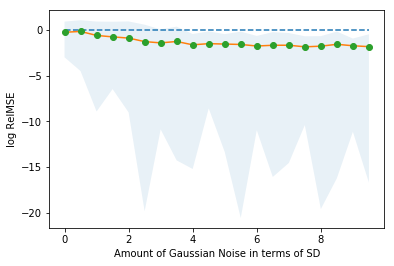

In [76]:
import matplotlib.pyplot as plt
import numpy as np
variance_level_results = np.load("variance_level_results.npy")
variance_level_results = variance_level_results.reshape((20,100))
mean_var = np.log(np.mean(variance_level_results,axis=1))
lower_ci = np.log(np.percentile(variance_level_results,q=2.25,axis=1))
upper_ci = np.log(np.percentile(variance_level_results,q=97.5,axis=1))
plt.plot(np.arange(0,10,.5),np.repeat(0,20),linestyle='--')
plt.plot(np.arange(0,10,.5),mean_var)
plt.plot(np.arange(0,10,.5),mean_var,'o')
plt.fill_between(np.arange(0,10,.5),lower_ci,upper_ci,alpha=.1)

plt.xlabel("Amount of Gaussian Noise in terms of SD")
plt.ylabel("log RelMSE")
plt.show()